In [1]:
import os
import sys
import cv2
import random
import itertools
import numpy as np
import matplotlib.pylab as plt
from matplotlib.pyplot import plot
    
from statistics import mean
from collections import namedtuple
# %matplotlib inline

GREEN = (0, 255, 0)
BLUR = (255, 0, 0)
RED = (0, 0, 255)

def show(img):
    """
    show rgb image
    """
    ax = plt.axes([0,0,4,4], frameon=False)
    ax.set_axis_off()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()
    
def show_gray(img):
    """
    show grayscale image
    """
    ax = plt.axes([0,0,4,4], frameon=False)
    ax.set_axis_off()
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    plt.show()
    
def find_text_contours(image):
    """
    Find areas with text on image
    """
    img = image.copy()
    n, m, _ = img.shape
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)[1]
    # gray = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)[1]
    show_gray(gray)
    binary = cv2.bitwise_not(gray)
    show_gray(binary)
    contours, hierarchy  = cv2.findContours(binary,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    text_contours = []
    for contour in contours:
        (x, y, w, h) = cv2.boundingRect(contour)
        if m > w > m / 2 and n / 2 > h > n / 12:
            text_contours.append([x, y, w, h])
    text_contours.sort(key = lambda x : x[1])
    return text_contours


def draw_contour_on_image(image, contours):
    """
    Draw contours finded with function "find_text_contours"
    """
    img = image.copy()
    for cnt in contours:
        x, y, w, h = cnt
        cv2.rectangle(img, (x, y), (x + w, y + h), GREEN, 4)
    show(img)
    
def get_text_area(image, contour, padding = 20):
    """
    Cut text areas from image with contours find in "find_text_contours"
    """
    x, y, w, h = contour
    img = image[y + padding +10  : y + h - padding - 10, x + padding + 10 : x + w - padding - 80]
    return cv2.copyMakeBorder(img, 5, 5, 5, 5, cv2.BORDER_CONSTANT, value=[255,255,255] )

def otsu_binarization(image):
    """
    Otsu image binarization
    """
    img = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2GRAY)
    img = cv2.threshold(img, 230, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    return img

def get_chunks(image, channels = 1):
    """
    Split image on chunks, each chunk is 5 percent of image width
    return: array with y-coordinates
    """
    if (channels == 3):
        n, m, _ = image.shape
    else:
        n, m = image.shape
    return np.arange(0, m + 1, m // 20)

def median_smooth(signal, kernel_size = 5):
    """
    Smooth signal
    """
    smooth_signal = []
    for i, val in enumerate(signal[:-kernel_size]):
        smooth_signal.append(sum(signal[i: i + kernel_size]) / kernel_size)
        #smooth_signal.append(np.median(signal[i: i + kernel_size]))
    return np.array(smooth_signal)

def build_hists(image):
    """
    Build hist to each chunk
    """
    hists = []
    chunks = get_chunks(image)
    black_height = []
    white_height = []
    lines_count = []
    for i, val in enumerate(chunks[:-1]):
        chunk = image[:, val : chunks[i + 1]]
        hist = np.sum(1 - (chunk / 255), axis=1)
        current_black_height = 0
        current_white_height = 0
        count = 0
        if hist[0] == 0:
            current_black_height += 1
        else:
            current_white_height += 1
        for pix in hist[1:]:
            if pix == 0:
                if current_black_height > 0:
                    current_black_height += 1
                else:
                    current_black_height += 1
                    white_height.append(current_white_height)
                    current_white_height = 0
            else:
                if current_white_height > 0:
                    current_white_height += 1
                else:
                    current_white_height += 1
                    black_height.append(current_black_height)
                    count += 1
                    current_black_height = 0
        lines_count.append(count)
        hists.append(hist)
    print('avg_black_height ' + str(mean(black_height)))
    print('avg_white_height ' + str(mean(white_height)))
    return hists, mean(black_height), mean(white_height), lines_count

def smooth_hists(hists):
    """
    Smooth hists witch is got in function build_hists
    """
    new_hists = []
    for hist in hists:
        new_hists.append(median_smooth(hist))
    return new_hists

def show_hists(hists):
    """
    Draw hists
    """
    fig = plt.figure()
    y = np.arange(len(hists[0]))
    for i in range(len(hists)):
        h = hists[i]
        plt.plot(h[::-1] + i*35, y)
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.show()
    fig.savefig('temp.png', dpi=fig.dpi)
#     axes = []    
#     fig, axes = plt.subplots(nrows=1, ncols=len(hists), figsize=(20, 20))
#     y = np.arange(len(hists[0]))
#     for i in range(len(hists)):
#         h = hists[i]
#         axes[i].plot(h[::-1], y)
#     plt.show()
    
def chunks_on_image(image, chunks):
    """
    Draw chunks on image
    """
    text_chunks = image.copy()
    n, m, _ = text_chunks.shape
    for i in chunks:
        cv2.line(text_chunks, (i, 0), (i, n),GREEN,3)
    show(text_chunks)
    

def find_valleys(sm_hists, thresh = 1):
    """
    Поиск впадин на сглаженных гистограммах 
    """
    valleys = []
    interval_average_height = []
    for curr in sm_hists:
        curr[curr < thresh] = 0
        valleys_ind, curr_valley = [], []
        prev = 1
        for i, val in enumerate(curr[:-1]):
            if (val == 0 and prev != 0):
                curr_valley.append(i)
            if (val == 0 and curr[i + 1] != 0):
                curr_valley.append(i)
            if len(curr_valley) == 2:
                valleys_ind.append(curr_valley)
                interval_average_height.append(curr_valley[1] - curr_valley[0])
                curr_valley = []
            if len(curr_valley) == 1 and (i == len(curr) - 2):
                curr_valley.append(i)
                valleys_ind.append(curr_valley)
            prev = val
        valleys.append(valleys_ind)
    return valleys


def show_valleys(image, valleys, channels = 3):
    chunks = get_chunks(image, channels)
    img = image.copy()
    
    for i, y in enumerate(chunks[:-1]):
        for (x_1, x_2) in valleys[i]:
            cv2.line(img, (y, x_1), (chunks[i + 1], x_1),GREEN,3)
            cv2.line(img, (y, x_2), (chunks[i + 1], x_2),RED,3)
    if channels == 3:
        show(img)
    else:
        show_gray(img)

class Trait:
    """
    Класс штрих
    """
    def __init__(self, x_1, x_2, y_1):
        self.x_1 = x_1
        self.x_2 = x_2
        self.y_1 = y_1
        #self.y_2 = y_2
    
    def dist(self, other):
        return ((self.x_2 - other.x_1) ** 2 + (self.y_1 - other.y_1) ** 2) ** (1 / 2)
    
    def print_(self):
        print('x_1: {}  x_2: {}  y: {}'.format(self.x_1, self.x_2, self.y_1))
    
    
def get_lines(image, valleys, channels = 3):
    """
    Вычислить среднюю линию в впадине и среднюю высоту строки
    """
    #h, w, _ = image.shape
    #image = image[10:h-10, 10:w - 10]
    total_lines = []
    chunks = get_chunks(image, channels)
    for i, chunk in enumerate(chunks[:-1]):
        chunk_lines = []
        for val in valleys[i]:
            chunk_lines.append(Trait(chunk, chunks[i+1], sum(val) // len(val)))
        total_lines.append(chunk_lines)
    
    height = []
    for i, line in enumerate(total_lines):
        for j, trait in enumerate(line[:-1]):
            height.append(abs(trait.y_1 - line[j + 1].y_1))
            #print('line ' + str(i) + ' = ' + str((abs(trait.y_1 - line[j + 1].y_1))))
    height = sum(height) / len(height)
    #print('height = ' + str(height))
    return total_lines, height

def show_lines(image, lines):
    img = image.copy()
    for chunk in lines:
        for line in chunk:
            cv2.line(img, (line.x_1, line.y_1), (line.x_2, line.y_1),GREEN,3)
    show(img)
    
    
Point = namedtuple('Point', ['x' , 'y'])
# class Point:
#     def __init__(self, x, y):
#         self.x = x
#         self.y = y

class Line:
    def __init__(self):
        self.data = []
        self.last_trait = None
        
    def continue_line(self, trait):
        self.data.append(Point(trait.x_1, trait.y_1))
        self.data.append(Point(trait.x_2, trait.y_1))

        
def filter_chunk(chunk, avg_black_height, average_white_height):
    prev = chunk[0]
    new_traits = [prev]
    for i, trait in enumerate(chunk[1:-1]):
        next_trait = chunk[i + 2]
        if abs(prev.y_1 - trait.y_1) > (avg_black_height + average_white_height/4) \
            and abs(next_trait.y_1 - trait.y_1) > (avg_black_height+ average_white_height/4):
            new_traits.append(trait)
            prev = trait
    new_traits.append(chunk[-1])
    return new_traits

def filter_chunks(chunks, avg_black_height, average_white_height):
    new_chunks = []
    for chunk in chunks:
        new_chunks.append(filter_chunk(chunk, avg_black_height, average_white_height))
    return new_chunks
            
    
def connect_two_chunks(chunk_1, chunk_2, avg_height):
    """
    Соединить первые две chunk-ки
    """
    all_inds_from_chunk2 = [i for i in range(len(chunk_2))]
    used_traits_from_chunk2 = []
    created_lines = []
    for trait_1 in chunk_1:
        minimum = sys.maxsize
        for j, trait_2 in enumerate(chunk_2):
            if trait_1.dist(trait_2) <  minimum:
                minimum = trait_1.dist(trait_2)
                min_trait = trait_2
            #if minimum >= avg_height / 2:
            if minimum >= 2 * avg_height / 3:
                min_trait = Trait(min_trait.x_1, min_trait.x_2, trait_1.y_1)
                
            if (min_trait.x_1 == trait_2.x_1) and (min_trait.x_2 == trait_2.x_2) \
                and (min_trait.y_1 == trait_2.y_1):
                used_traits_from_chunk2.append(j)
        new_line = Line()
        new_line.continue_line(trait_1)
        new_line.continue_line(min_trait)
        new_line.last_trait = min_trait
        created_lines.append(new_line)
    unused_traits = list(set(all_inds_from_chunk2) - set(used_traits_from_chunk2))

    for trait in unused_traits:
        chunk = chunk_2[trait]
        new_line = Line()
        start_trait = Trait(chunk_1[0].x_1, chunk.x_1, chunk.y_1)
        new_line.continue_line(start_trait)
        new_line.continue_line(chunk)
        new_line.last_trait = chunk
        created_lines.append(new_line)
    return created_lines
    
def connect_start_lines_with_next_chunks(lines, chunk, avg_height):
    all_inds_from_chunk = [i for i in range(len(chunk))]
    used_traits_from_chunk = []
    for line in lines:
        trait_1 = line.last_trait
        minimum = sys.maxsize
        for j, trait_2 in enumerate(chunk):
            if trait_1.dist(trait_2) <  minimum:
                minimum = trait_1.dist(trait_2)
                min_trait = trait_2
            if minimum >= avg_height / 2.0:
                min_trait = Trait(min_trait.x_1, min_trait.x_2, trait_1.y_1)
                
            if (min_trait.x_1 == trait_2.x_1) and (min_trait.x_2 == trait_2.x_2) \
                and (min_trait.y_1 == trait_2.y_1):
                used_traits_from_chunk.append(j)
        line.continue_line(min_trait)
        line.last_trait = min_trait
    unused_traits = list(set(all_inds_from_chunk) - set(used_traits_from_chunk))
    print(unused_traits)
    for i in unused_traits:
        trait = chunk[i]
        start_trait = Trait(0, trait.x_1, trait.y_1)
        new_line = Line()
        new_line.continue_line(start_trait)
        new_line.continue_line(trait)
        new_line.last_trait = trait
        lines.append(new_line)
        
def connect_lines_with_chunk(lines, chunk, avg_height):
    """
    Соединить оставшиеся chunk-ки и уже созданные линии
    """
    for line in lines: 
        trait_1 = line.last_trait
        minimum = sys.maxsize
        if len(chunk) == 0:
            return
        for trait_2 in chunk:
            if trait_1.dist(trait_2) <  minimum:
                minimum = trait_1.dist(trait_2)
                min_trait = trait_2
            if minimum >=  avg_height / 1:
            
                min_trait = Trait(min_trait.x_1, min_trait.x_2, trait_1.y_1)
        line.continue_line(min_trait)
        line.last_trait = min_trait

def get_first_approach_lines(chunk_with_traits, avg_height):
    """
    Get first approach of splitting lines
    """
    created_lines = connect_two_chunks(chunk_with_traits[0], chunk_with_traits[1], avg_height)
    connect_start_lines_with_next_chunks(created_lines, chunk_with_traits[2], avg_height)
    for chunk in chunk_with_traits[3:]:
        connect_lines_with_chunk(created_lines, chunk, avg_height)
    #print('avg height = ' + str(avg_height))
    return created_lines


def draw_line(image, line):
    img = image.copy()
    color = [random.randint(0, 255) for _ in range(3)]
    for i, point in enumerate(line.data[:-1]):
        next_point = line.data[i + 1]
        cv2.line(img, (point.x, point.y), (next_point.x, next_point.y), color ,3)
        #print('height = ' + str(next_point.y - point.y))
    return img
    
def draw_lines(image, lines, channels = 3):
    """
    Draw splitting lines
    """
    img = image.copy()
    for line in lines:
        img = draw_line(img, line)
    if channels == 3:
        cv2.imwrite("12345.png", img)
        show(img)
    else:
        show_gray(img)
    

def cut_line(image, line_1, line_2):
    
    n, m = image.shape
    print('')
    print('n = ' + str(n))
    print('m = ' + str(m))
    img = image.copy()
    x_list = []
    for i, point in enumerate(line_1.data[:-1]):
        next_point = line_1.data[i + 1]
        img[:point.y, point.x:next_point.x] = 255
        x_list.append(point.x)
    for i, point in enumerate(line_2.data[:-1]):
        next_point = line_2.data[i + 1]
        img[point.y:n, point.x:next_point.x] = 255
        x_list.append(point.x)
    max_x = max(x_list)
    print('max_x = ' + str(max_x))
    img[:, max_x:m] = 255
#line1: [Point(x=0, y=111), Point(x=88, y=111)
    inds = np.argwhere(img == 0)
    if len(inds) != 0:
        x_min = min(inds[:, 0])
        x_max = max(inds[:, 0])
        y_min = min(inds[:, 1])
        y_max = max(inds[:, 1])
        show_gray(img[x_min:x_max,:])
        #cv2.imwrite('line' + str(random.randint(0, 100)) + '.png', img[x_min:x_max,:])
        return img[x_min:x_max, y_min:y_max]
        

def cut_lines(image, created_lines):
    lines = []
    for i, line in enumerate(created_lines[:-1]):
        #print('line1: ' + str(line.data))
        #print('line2: ' + str( created_lines[i + 1].data))
        lines.append(cut_line(image, line, created_lines[i + 1]))
        #print('avg_height = ' + str(sum(line.data.y))/len(line.data.y))
        
            
            
    return lines
    
def upwords_traversal(img, point):
    """
    обход снизу вверх
    """
    points = [point]
    min_point = point
    n, m = img.shape
    used_points = []
    while len(points) > 0:
        next_point = points.pop(0)
        used_points.append(next_point)
        #проверяем, что не выходим за границы изображения
        neighbors = []
        if (0 < next_point.x + 1 < m) and (0 < next_point.y + 1 < n) \
            and (0 <= next_point.x - 1 <= m) and (0 <= next_point.y - 1 <= n):
            neighbors += [Point(next_point.x - 1, next_point.y - 1), Point(next_point.x, next_point.y - 1)]
            neighbors += [Point(next_point.x + 1, next_point.y - 1), Point(next_point.x + 1, next_point.y)]
        for p in neighbors:
            if img[p.y, p.x] == 0:
                if (p not in points) and (p not in used_points):
                    points.append(p)
                if p.y < min_point.y:
                    min_point = p
    return min_point
        
    
def downwords_traversal(img, point):
    """
    обход сверху сниз
    """
    points = [point]
    max_point = point
    n, m = img.shape
    used_points = []
    while len(points) > 0:
        next_point = points.pop(0)
        used_points.append(next_point)
        #проверяем, что не выходим за границы изображения
        neighbors = []
        if (0 < next_point.x + 1 < m) and (0 < next_point.y + 1 < n) \
            and (0 <= next_point.x - 1 <= m) and (0 <= next_point.y - 1 <= n):
            neighbors += [Point(next_point.x - 1, next_point.y + 1), Point(next_point.x, next_point.y + 1)]
            neighbors += [Point(next_point.x + 1, next_point.y + 1), Point(next_point.x + 1, next_point.y)]
        for p in neighbors:
            if img[p.y, p.x] == 0:
                if (p not in points) and (p not in used_points):
                    points.append(p)
                if p.y > max_point.y:
                    max_point = p
    return max_point

def adjust_lines(binary, created_lines, average_black_height):
    img = binary.copy()
    for line_data in created_lines:
        line = line_data.data
        new_line = []
        for i, point_1 in enumerate(line[:-1]):
            point_2 = line[i+1]
            trait = img[point_1.y, point_1.x:point_2.x]
            start_black = 0
            for i in range(len(trait)):
                if trait[i] == 0:
                    start_black = i  
                    break
            if start_black:
                x = start_black + point_1.x
                y = point_1.y
                top = upwords_traversal(img, Point(x, y))
                bottom = downwords_traversal(img, Point(x, y))
                h_u = abs(y - top.y)
                h_d = abs(y - bottom.y)
                if h_u < h_d and h_u <= average_black_height:
                    new_line.append(Point(point_1.x, top.y))
                    new_line.append(Point(point_2.x, top.y))
                elif h_d < h_u and h_d <= average_black_height:
                    new_line.append(Point(point_1.x, bottom.y))
                    new_line.append(Point(point_2.x, bottom.y))
                else:
                    new_line.append(point_1)
            else:
                new_line.append(point_1)
        print(new_line)
        new_line.append(line[-1])
        line_data.data = new_line
        
        

def get_words_from_line(line, min_width = 10, thresh =  100): #400000
    """
    line : grayscale line
    min_width : min space length
    """
    words = []
    if line is None:
        return words
    n, m = line.shape
    image = cv2.bitwise_not(line)
    y = np.sum(image // 255, axis = 0)
    #x = np.arange(len(y))
    #plot(x, y)
    #plt.show()

    _, inds = np.where([y == 0])

    start = 0
    spaces = []
    for i, ind in enumerate(inds[:-1]):
        if (ind + 1 == inds[i + 1]) and (start == 0):
            start = ind
        elif (ind + 1 < inds[i + 1]) and (start != 0):
            if (ind - start) >= min_width:
                spaces.append([int(start), int(ind)])
                start = 0
            else:
                start = 0

    spaces = np.ravel(spaces)
    spaces = np.insert(spaces, [0, len(spaces)], [0, m])
    spaces = spaces.reshape(len(spaces) // 2, 2)     
    
    for inds in spaces:
        word = line[:, int(inds[0]): int(inds[1])]
        print("sum", np.sum(word))
        show_gray(word)
        if np.sum(1 - (word / 255)) > thresh:
            words.append(word)
    return words

def extract_words(lines):
    words = []
    for line in lines:
        words += get_words_from_line(line)
    return words

def prepare(image, contour):
    text = get_text_area(image, contour) 
    show(text)
    binary = otsu_binarization(text)
    show_gray(binary)
    hists, average_black_height, average_white_height, lines_count = build_hists(binary)
#     show_hists(hists)
    sm_hists = smooth_hists(hists)
    show_hists(sm_hists)
    valleys = find_valleys(sm_hists)
    show_valleys(text, valleys)
    lines, avg_height = get_lines(text, valleys) 
    
    # print("BEFORE")
    show_lines(text, lines)
    lines = filter_chunks(lines, average_black_height, average_white_height)
    # print("AFTER")
    show_lines(text, lines)
    created_lines = get_first_approach_lines(lines, average_black_height)
    draw_lines(text, created_lines)
    # adjust_lines(binary, created_lines, average_black_height)
    created_lines = sorted(created_lines, key = lambda x: x.data[0].y)
    print('ща нарисую отсортированные')
    draw_lines(text, created_lines)
    print('режу!')
    extracted_lines = cut_lines(binary, created_lines)
    words = extract_words(extracted_lines)
    return words

def save_words(path, words):
    for i, word in enumerate(words):
        cv2.imwrite(os.path.join(path , 'word_' + str(i) + '.png'), word)

In [2]:
path_saving = r'Literature Data/'
train_path = path_saving + 'train_set'
try:
    os.mkdir(train_path)
except OSError: 
    print ("Директория уже создана " + train_path)
test_path = path_saving + 'test_set'
try:
    os.mkdir(test_path)
except OSError: 
    print ("Директория уже создана " + test_path)
valid_path = path_saving + 'valid_set'
try:
    os.mkdir(valid_path)
except OSError: 
    print ("Директория уже создана " + valid_path)

Директория уже создана Literature Data/train_set
Директория уже создана Literature Data/test_set
Директория уже создана Literature Data/valid_set


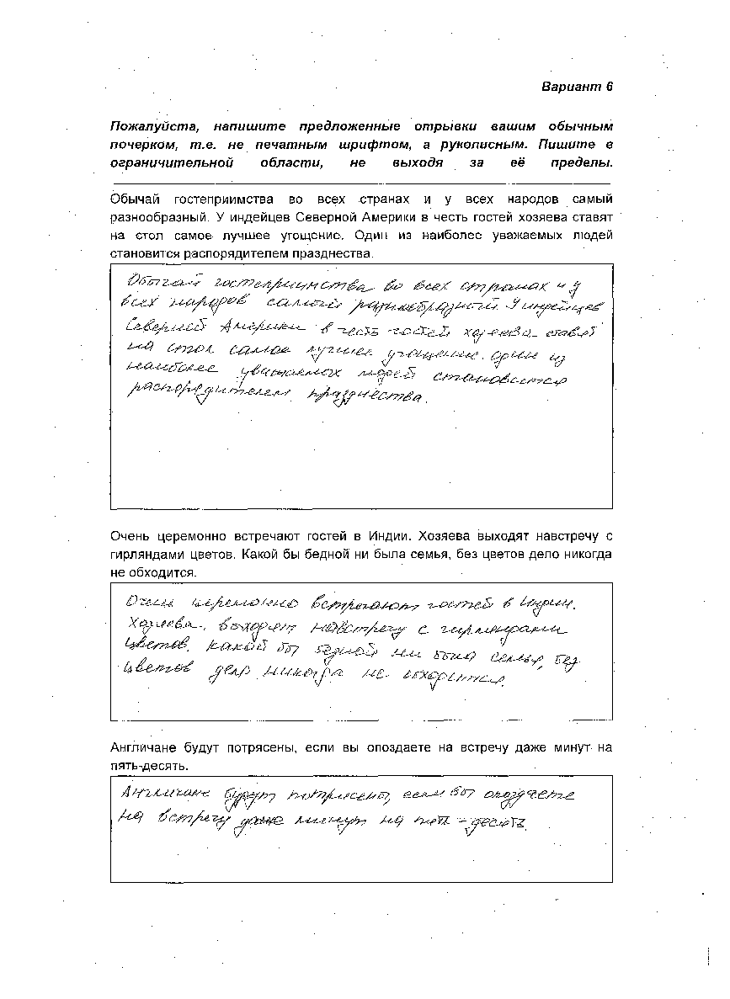

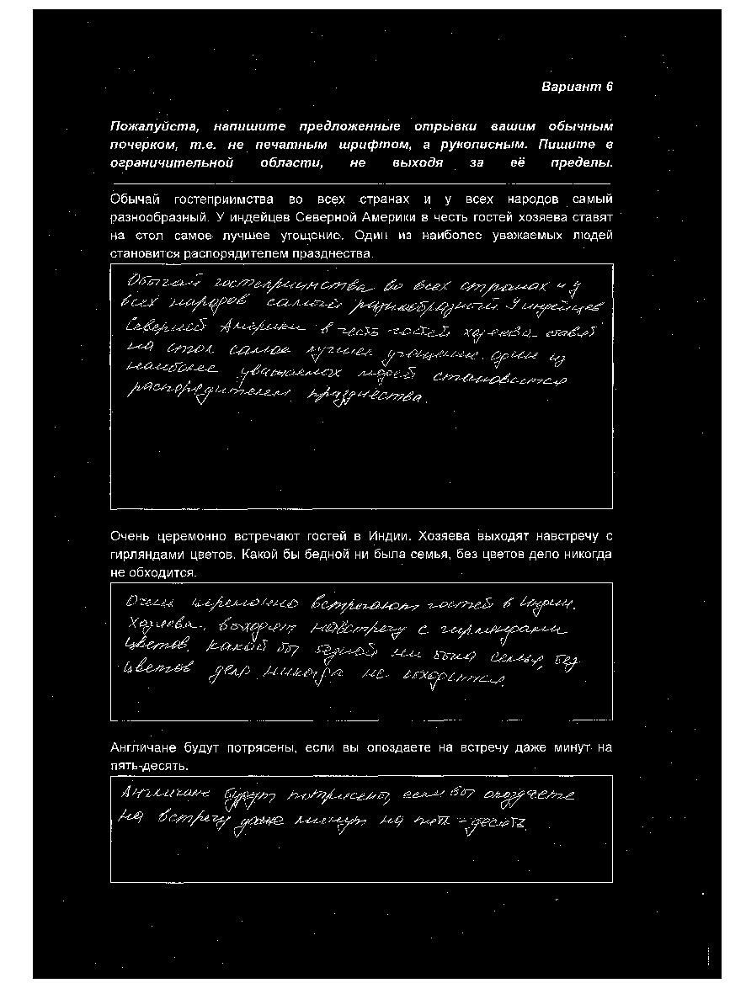

[[279, 921, 1825, 896], [280, 2079, 1822, 505], [281, 2779, 1821, 393]]


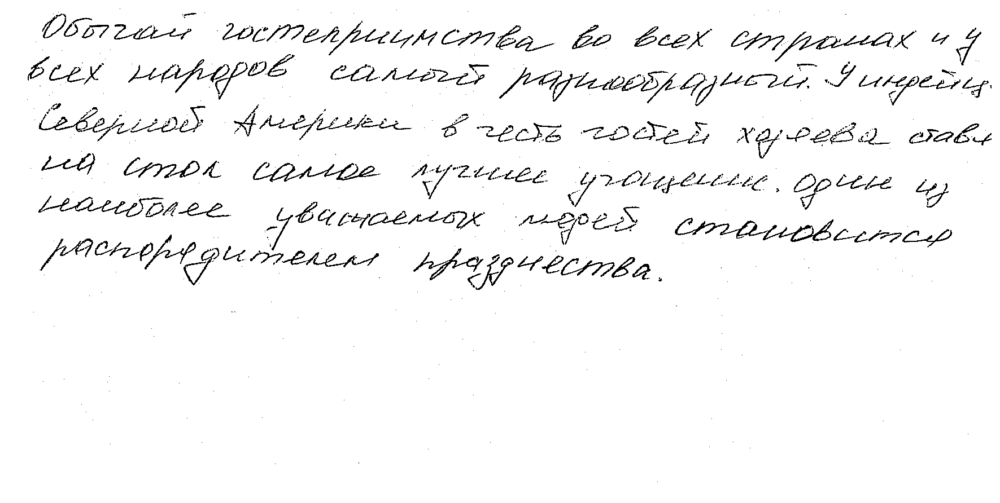

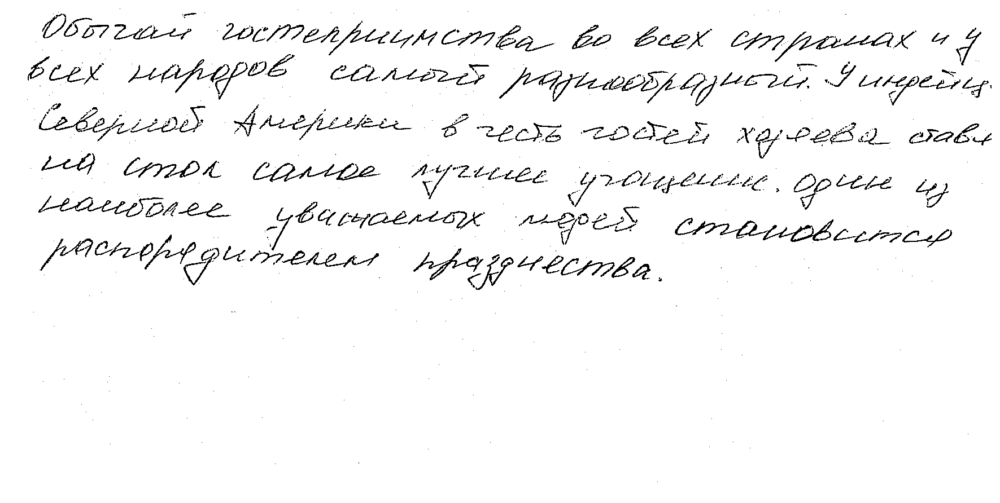

avg_black_height 31.99655172413793
avg_white_height 15.872413793103448


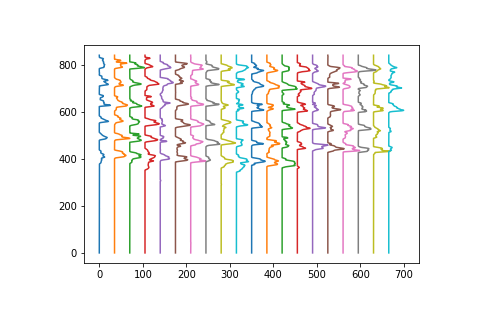

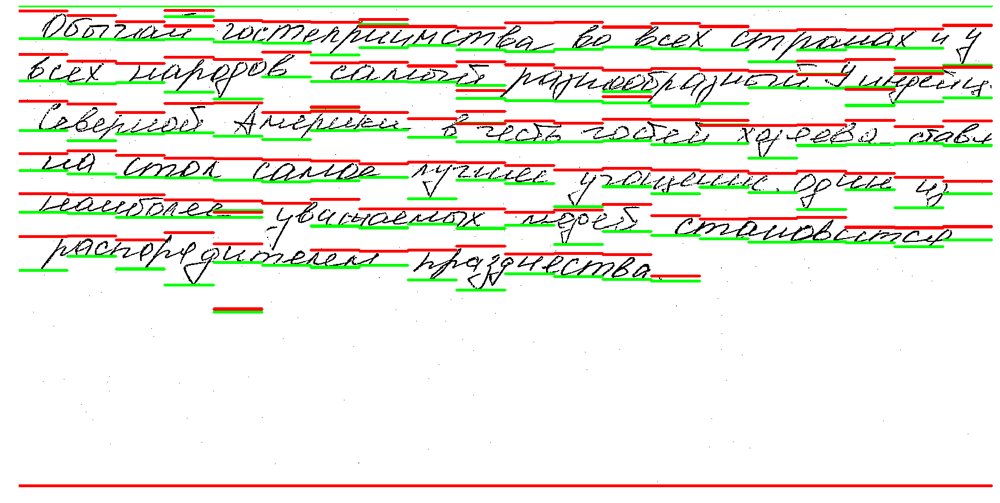

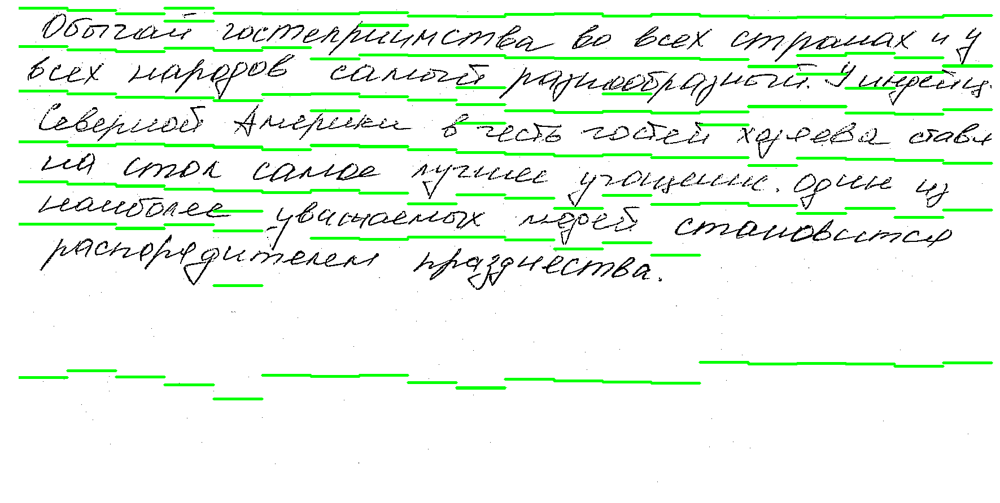

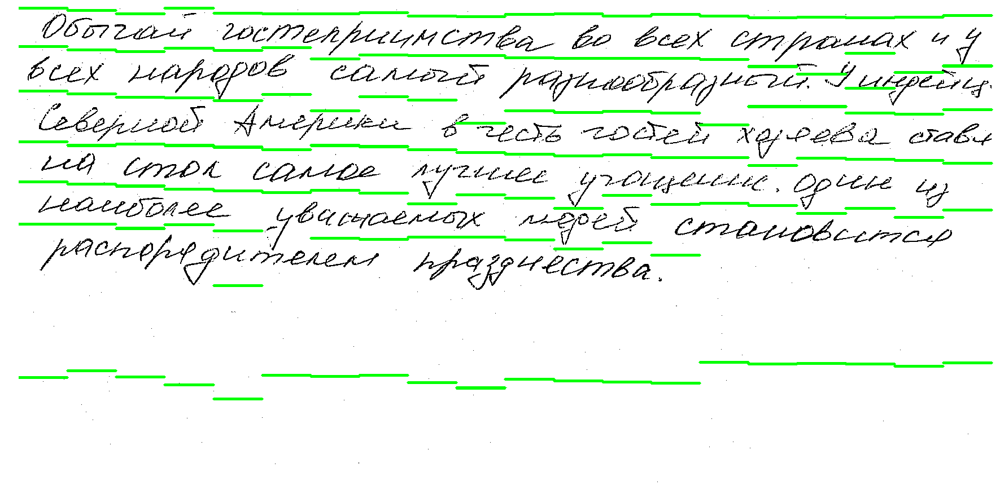

[]


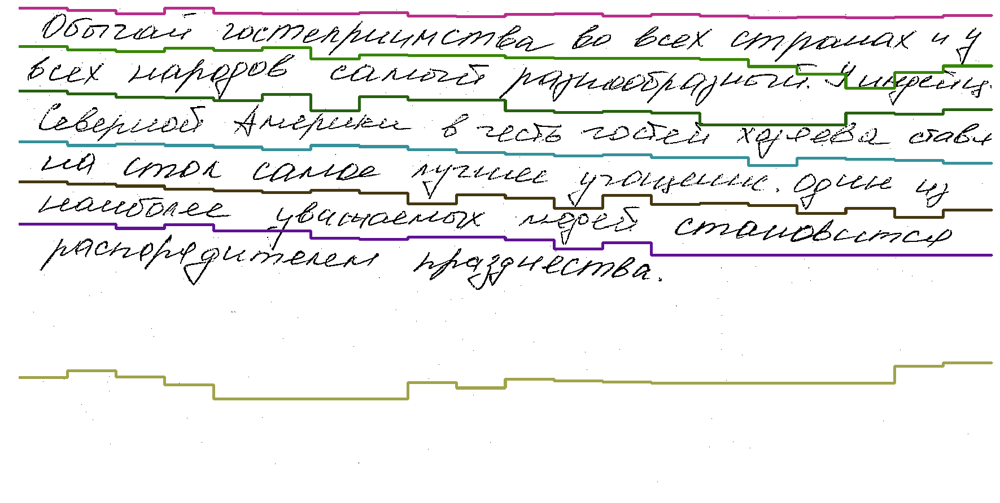

ща нарисую отсортированные


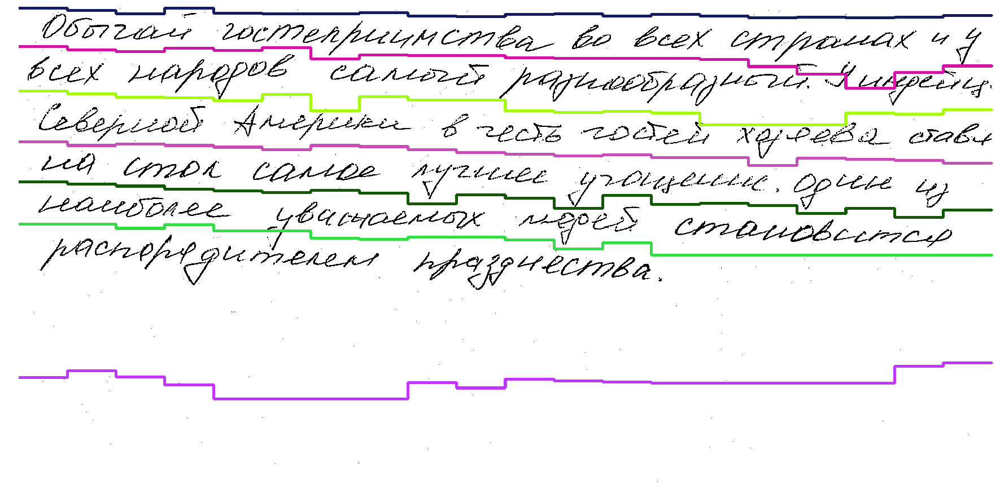

режу!

n = 846
m = 1705
max_x = 1615


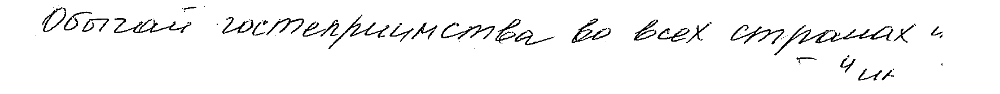


n = 846
m = 1705
max_x = 1615


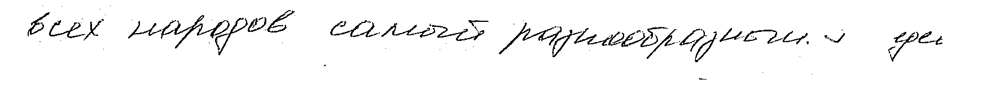


n = 846
m = 1705
max_x = 1615


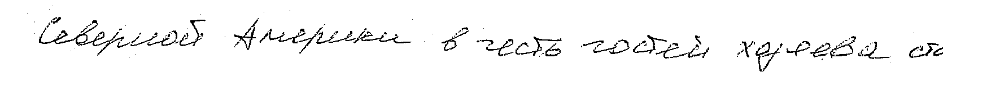


n = 846
m = 1705
max_x = 1615


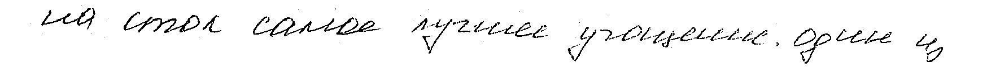


n = 846
m = 1705
max_x = 1615


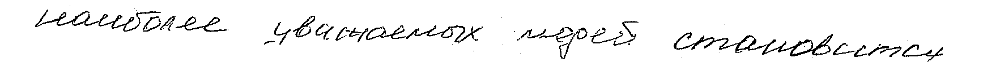


n = 846
m = 1705
max_x = 1615


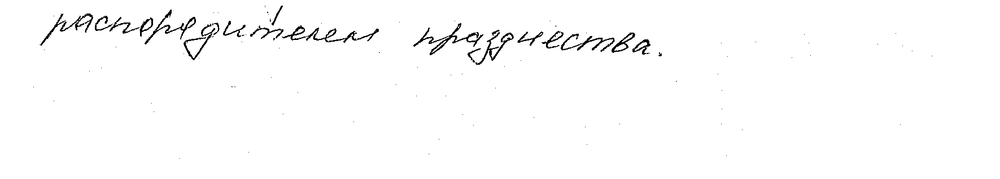

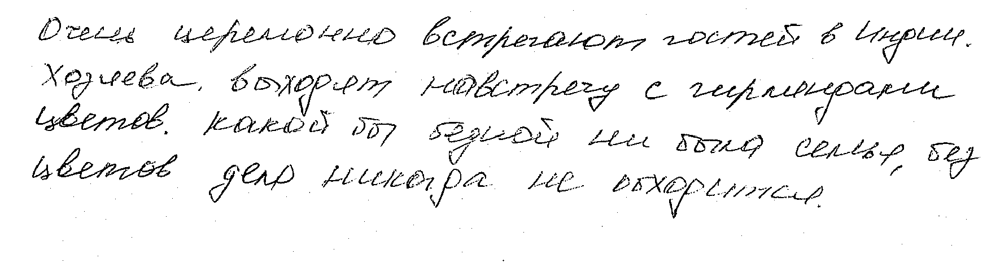

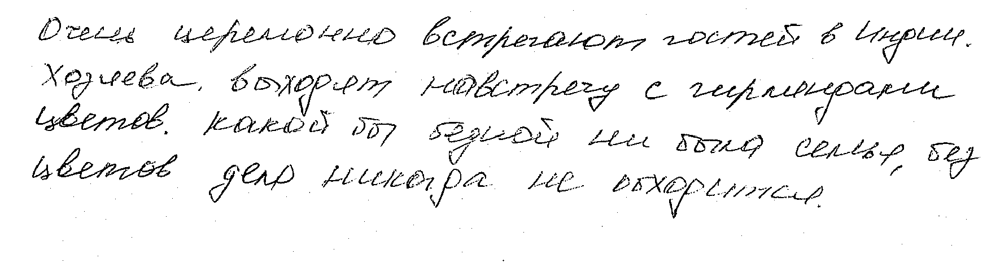

avg_black_height 31.020408163265305
avg_white_height 22.6734693877551


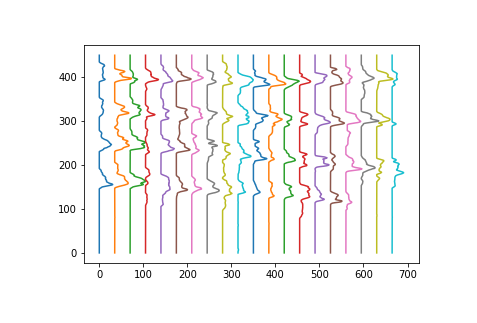

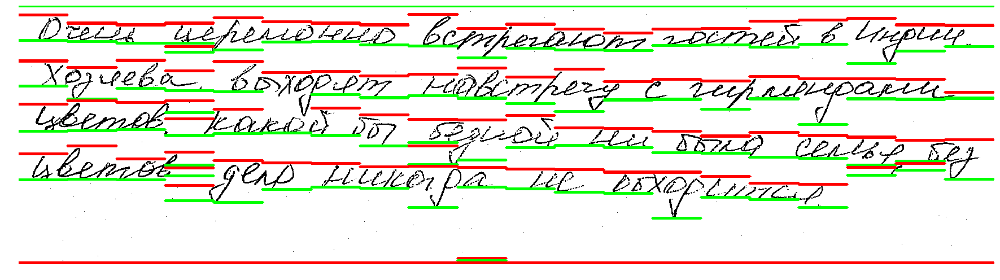

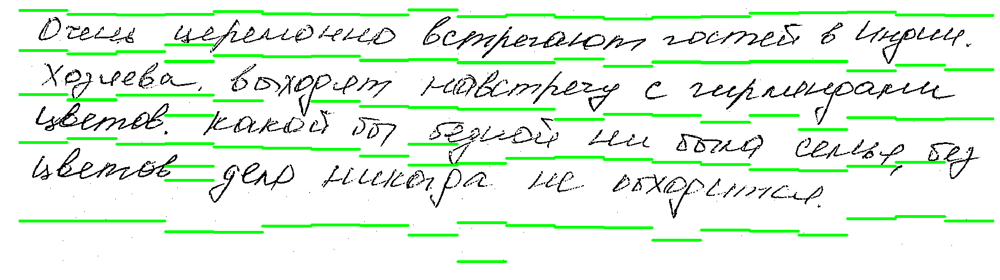

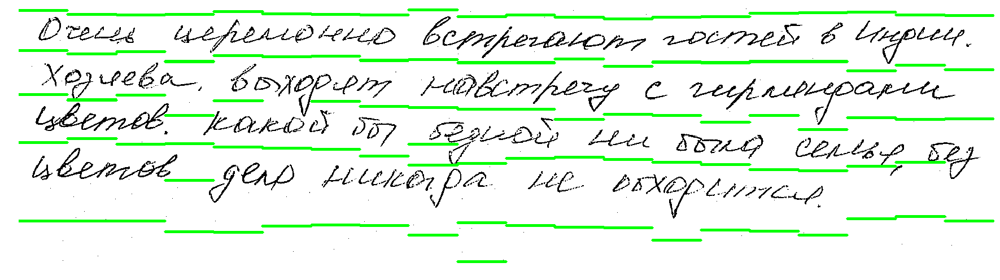

[]


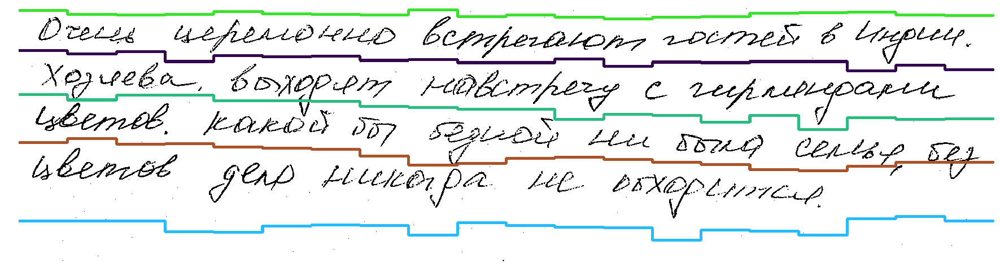

ща нарисую отсортированные


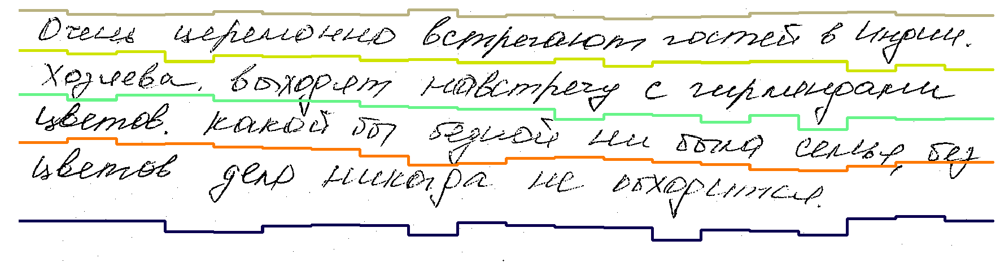

режу!

n = 455
m = 1702
max_x = 1615


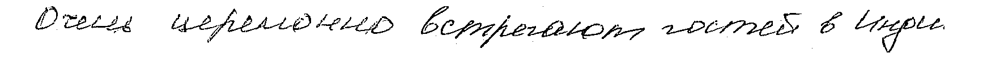


n = 455
m = 1702
max_x = 1615


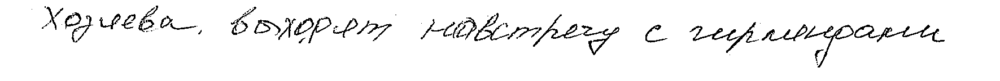


n = 455
m = 1702
max_x = 1615


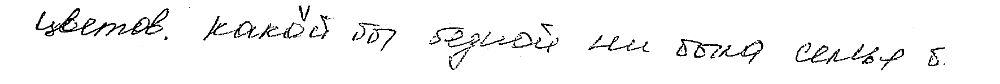


n = 455
m = 1702
max_x = 1615


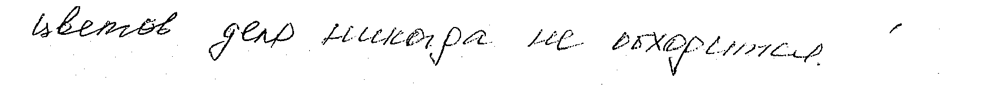

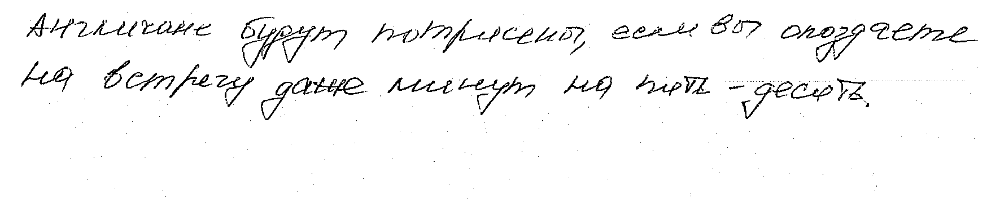

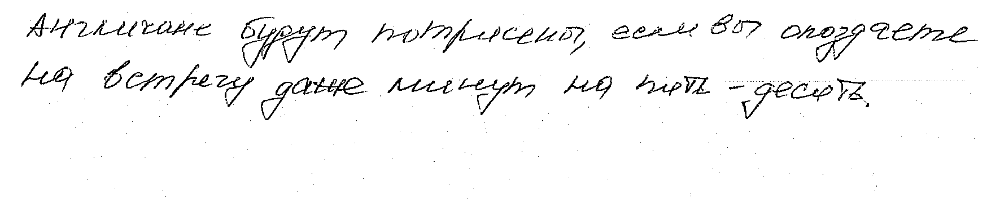

avg_black_height 26.243589743589745
avg_white_height 11.602564102564102


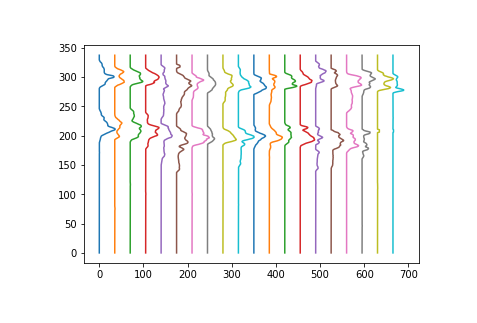

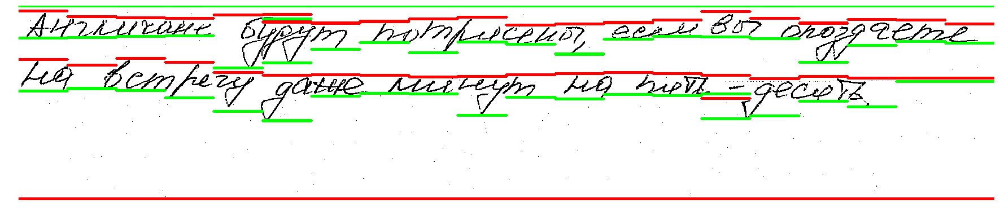

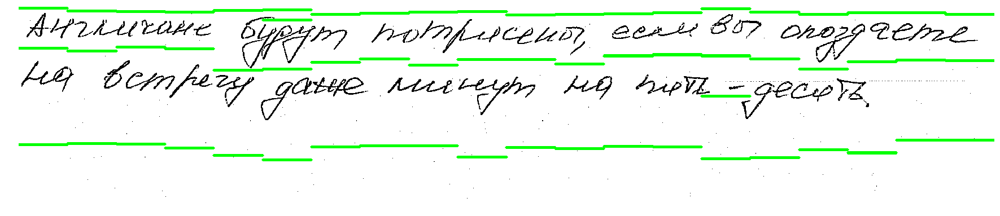

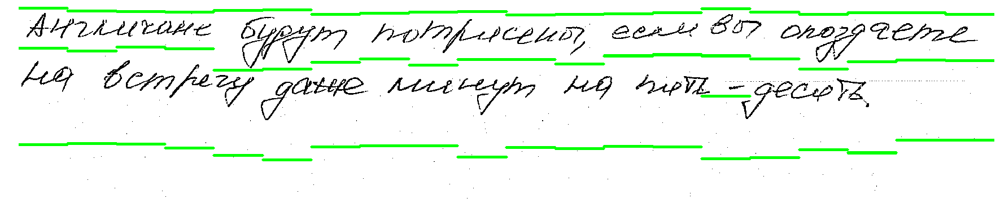

[]


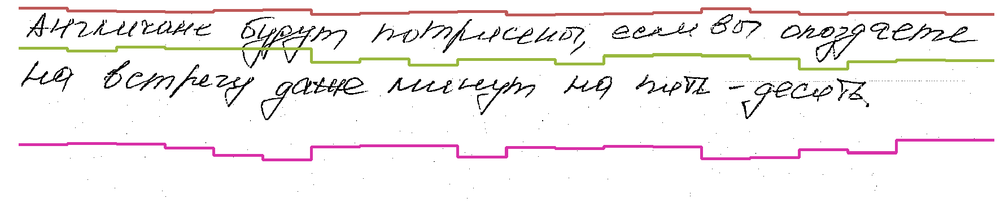

ща нарисую отсортированные


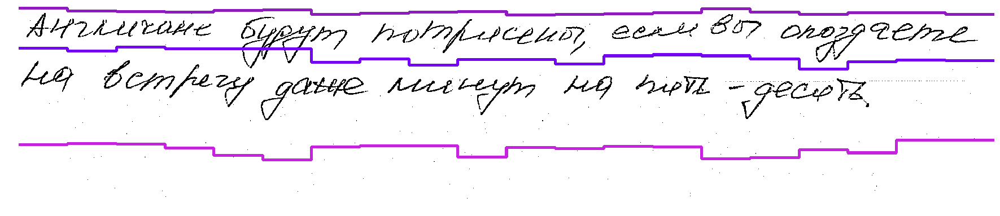

режу!

n = 343
m = 1701
max_x = 1615


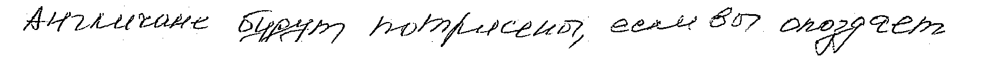


n = 343
m = 1701
max_x = 1615


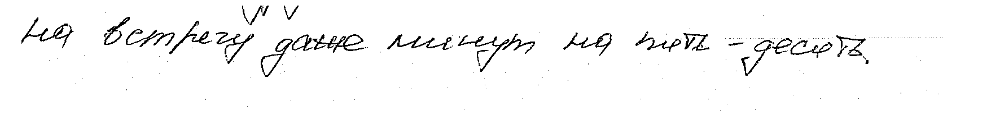

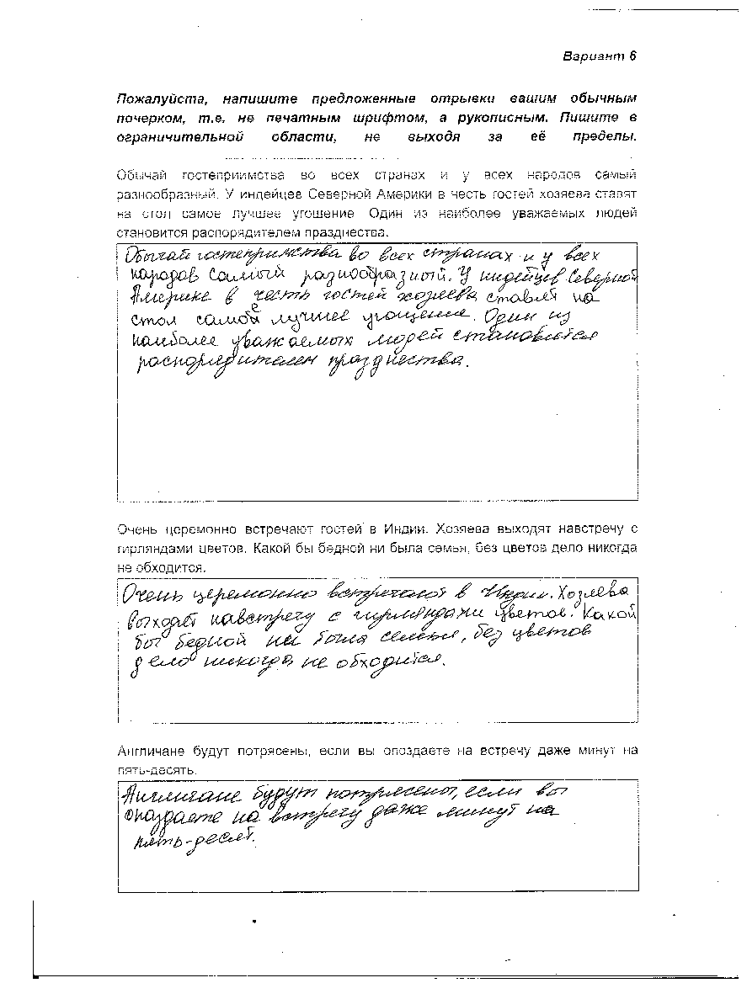

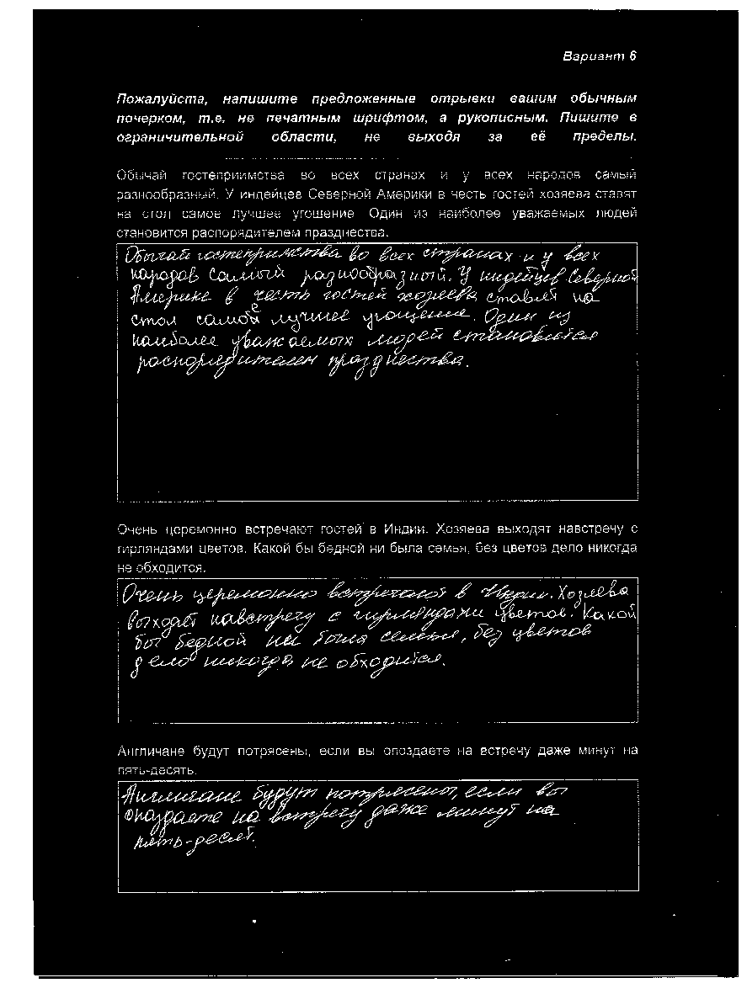

[]


In [33]:
#size=(1024, 768)
path_var = 'dataset/variant_6'
imgs = os.listdir(path_var)
for j, img_p in enumerate(imgs):
    if  12 <= j <= 14:
        path_img = path_var + '/' + img_p
        img  = cv2.imread(path_img)
        contours = find_text_contours(img)
        print(contours)
        if contours != []:
            try:
                train_words = prepare(img, contours[0])
                for i, word in enumerate(train_words):
                    #word_h, word_w  = word.shape
                    #print('Фрагмент № ' + str(i))
                    #print('word_h', word_h)
                    #print('word_w', word_w)
                    #show(word)
                    
                    path_i = train_path + '/' + '6_' + str(j) + '_' +'word_'  + str(i) + '.png'
                    cv2.imwrite(path_i, word)
                test_words = prepare(img, contours[1])
                for i, word in enumerate(test_words):
                    #word_h, word_w  = word.shape
                    #print('Фрагмент № ' + str(i))
                    #print('word_h', word_h)
                    #print('word_w', word_w)
                    #show(word)
                    #if w > size[0] or h > size[1]:
                    path_i = test_path + '/' + '6_' + str(j) + '_' +'word_'  + str(i) + '.png'
                    cv2.imwrite(path_i, word)
                valid_words = prepare(img, contours[2])
                for i, word in enumerate(valid_words):
                    #word_h, word_w  = word.shape
                    #print('Фрагмент № ' + str(i))
                    #print('word_h', word_h)
                    #print('word_w', word_w)
                    #show(word)
                    #if w > size[0] or h > size[1]:
                    path_i = valid_path + '/' + '6_' + str(j) + '_' +'word_'  + str(i) + '.png'
                    cv2.imwrite(path_i, word)
            except (TypeError, AttributeError):
                print('В варианте ' + str(j) + ' идентификторе ' + str(i) + ' произошла ошибка')

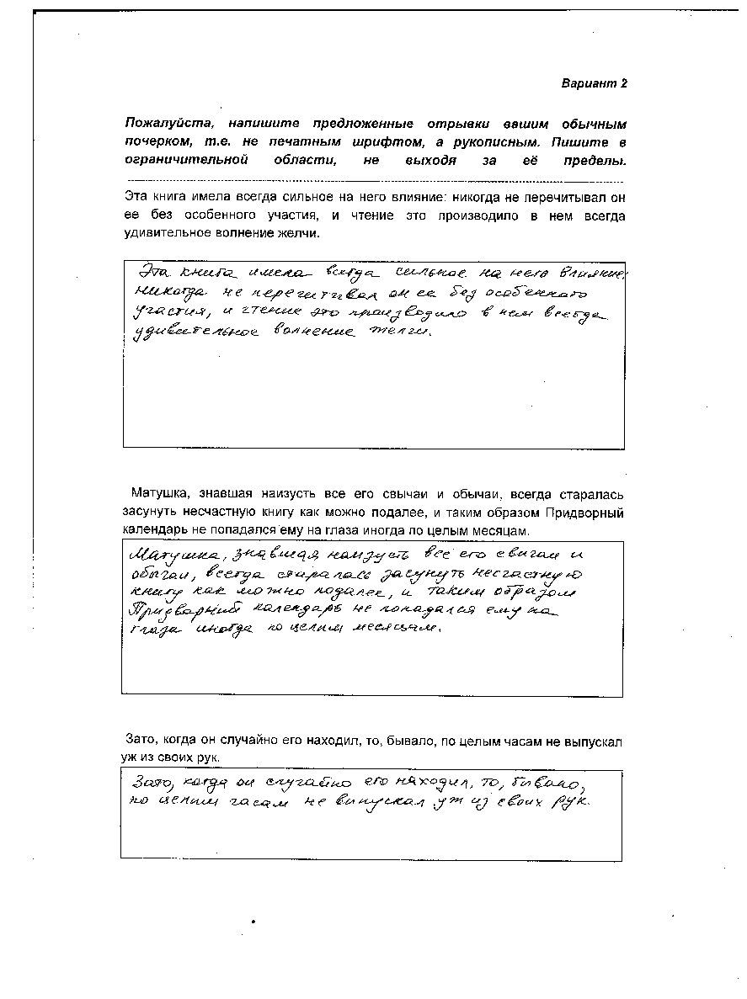

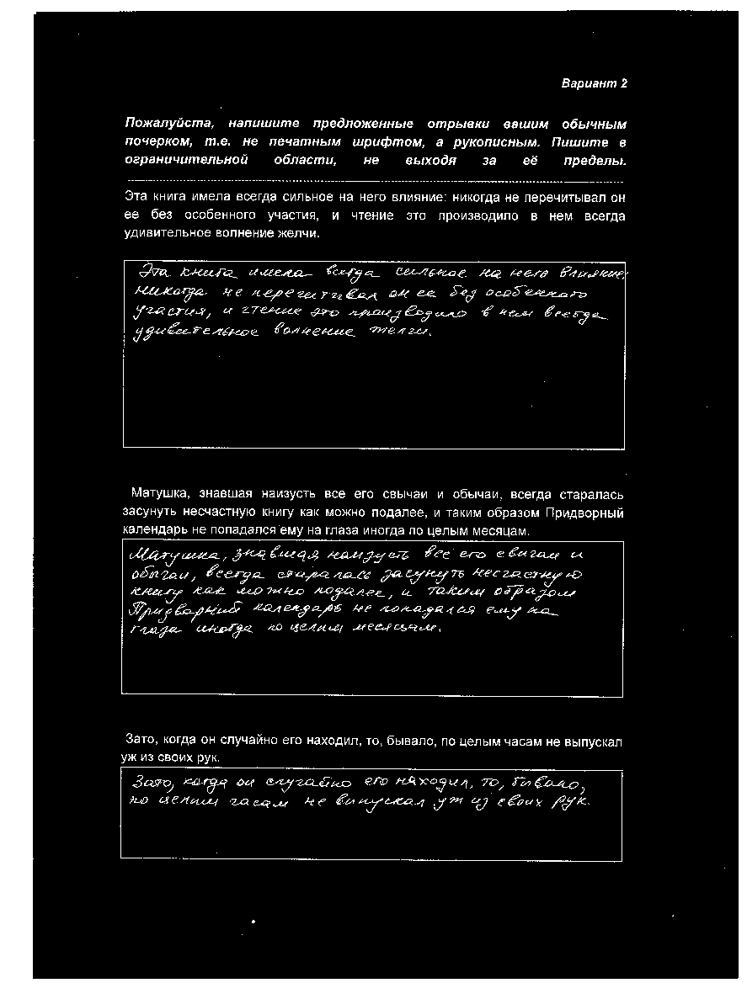

[[650, 1816, 3653, 1374], [639, 3831, 3637, 1152], [632, 5481, 3633, 692]]
(7017, 5101, 3)


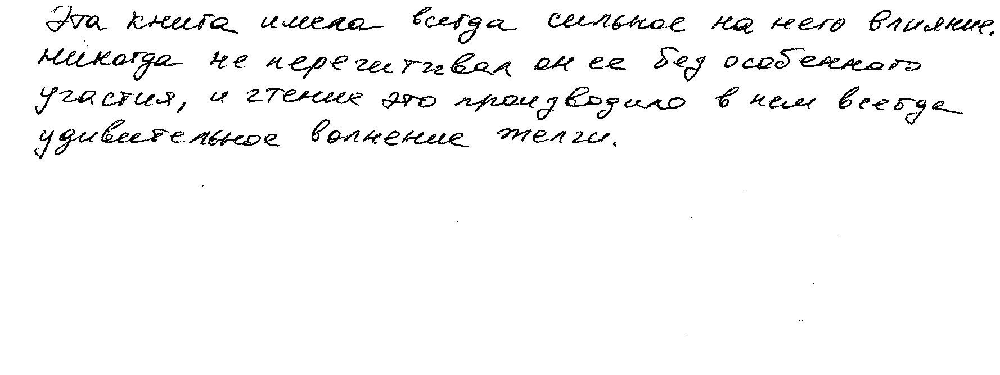

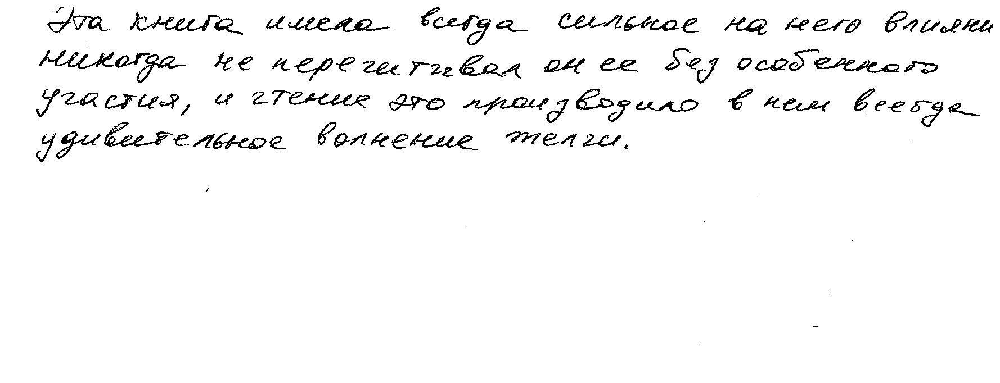

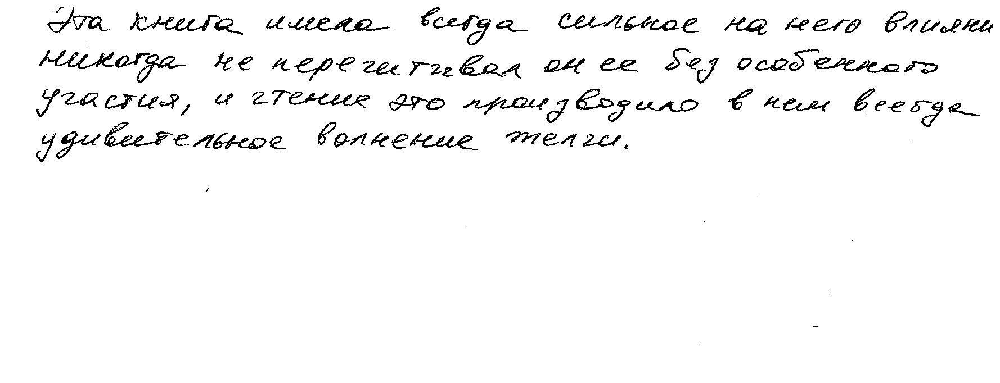

avg_black_height 91.3010752688172
avg_white_height 53.88172043010753


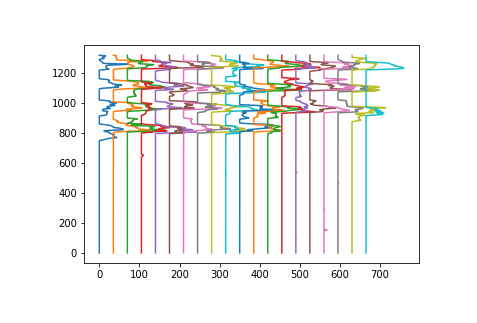

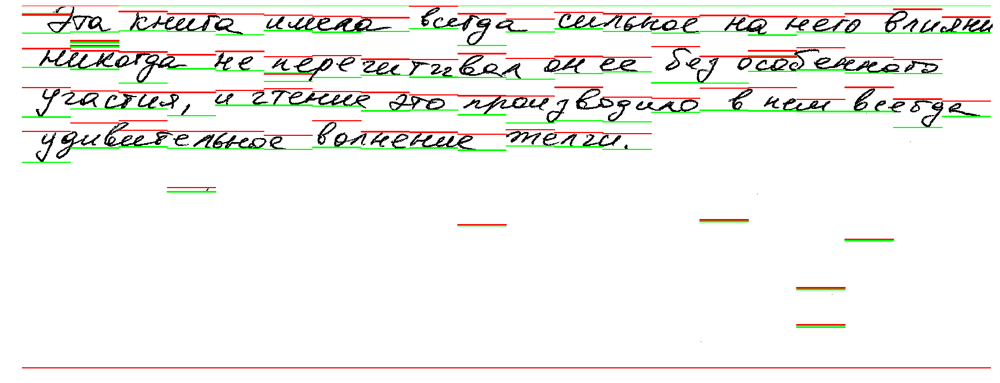

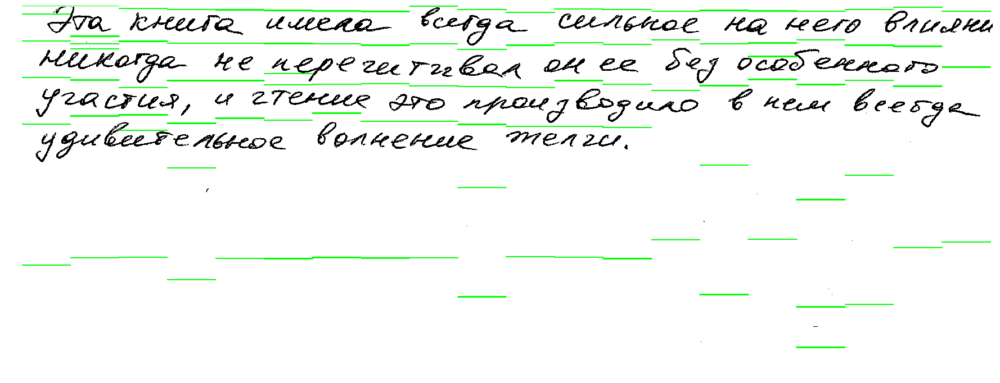

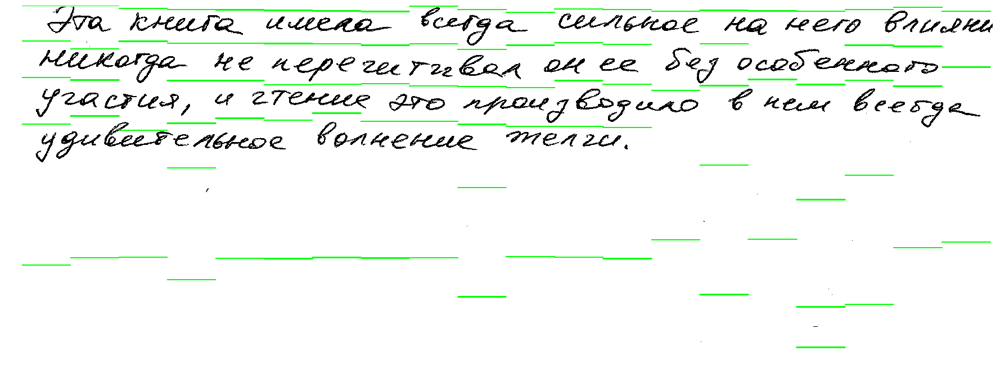

[2]


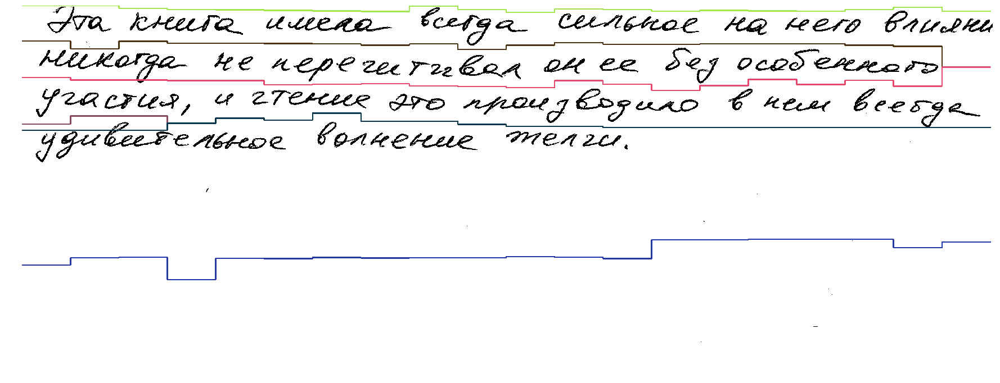

ща нарисую отсортированные


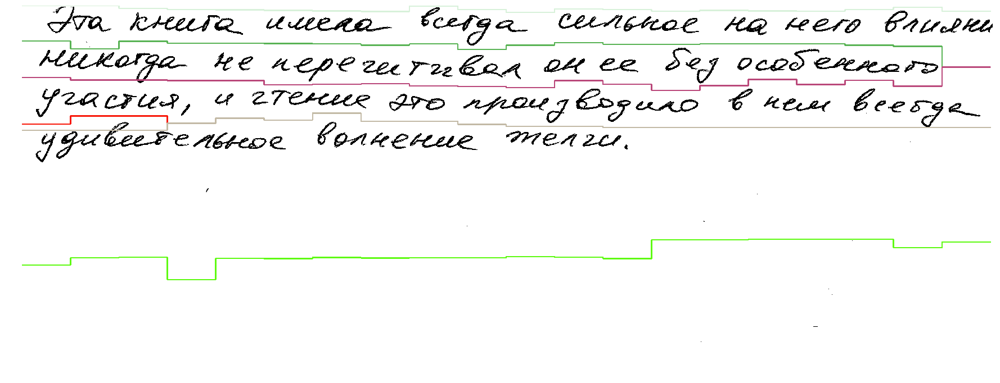

режу!

n = 1324
m = 3533
max_x = 3344


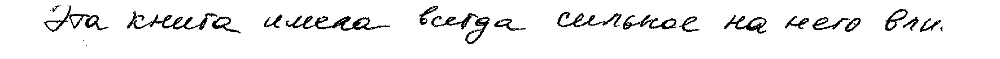


n = 1324
m = 3533
max_x = 3344


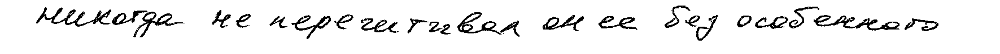


n = 1324
m = 3533
max_x = 3344


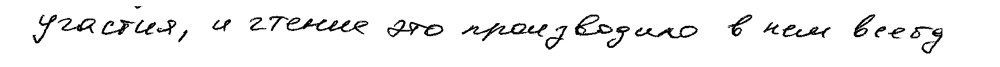


n = 1324
m = 3533
max_x = 3344


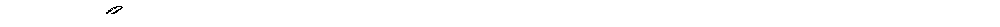


n = 1324
m = 3533
max_x = 3344


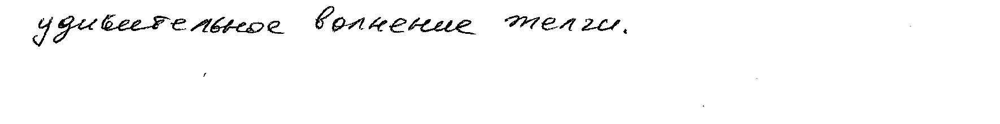

In [31]:
path_img = 'dataset/variant_2/2_13.png'
img  = cv2.imread(path_img)
contours = find_text_contours(img)
print(contours)
print(img.shape)
x, y, w, h = contours[0]
image = img[y+30:y+h-30, x+30:x+w-30]
show(image)
#new_words_extraction(img)
#new_words_extraction(image)
train_words = prepare(img, contours[0])


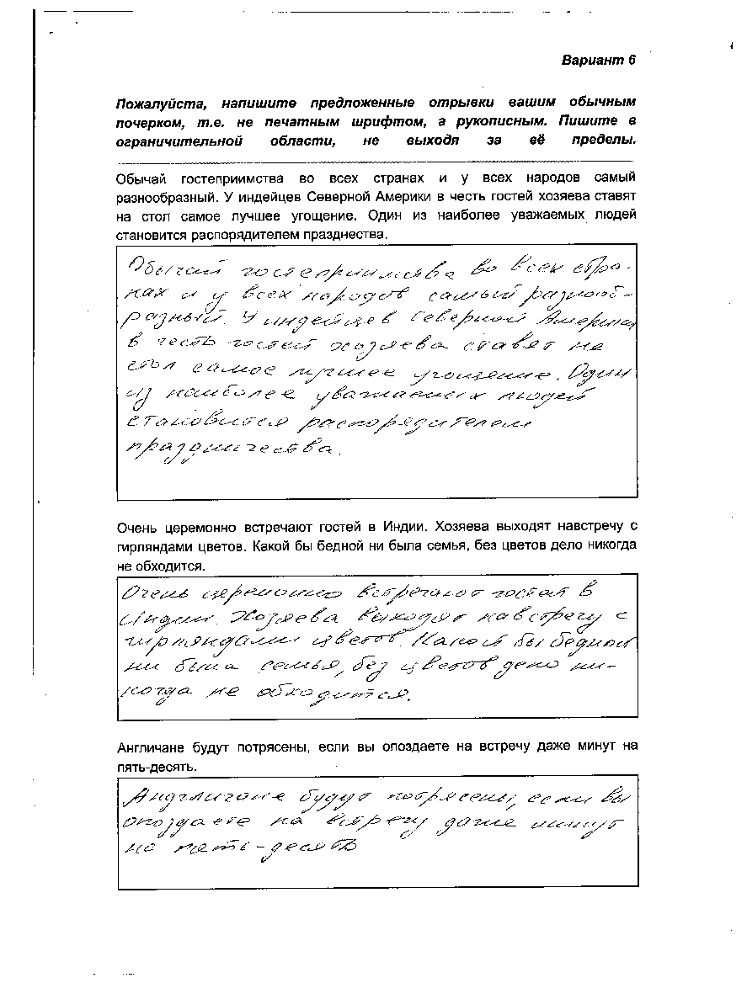

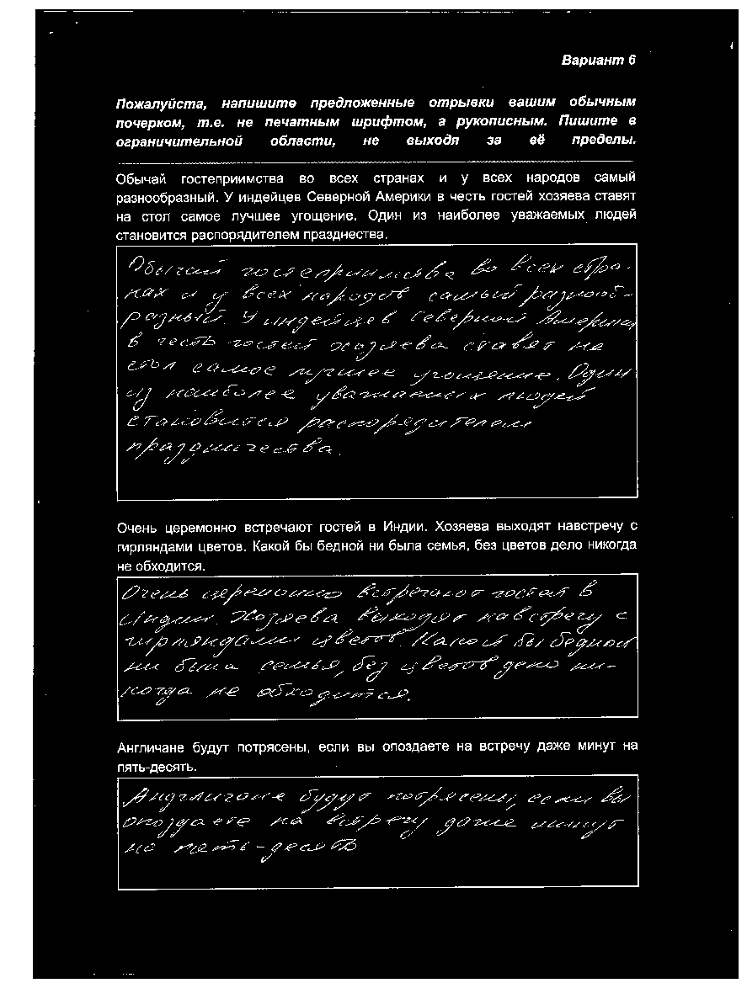

NameError: name 'new_words_extraction' is not defined

In [4]:

path_var = 'dataset/variant_6'
imgs = os.listdir(path_var)
for j, img_p in enumerate(imgs):
    if 8 Б= j <= 7:
        path_img = path_var + '/' + img_p
        img  = cv2.imread(path_img)
        contours = find_text_contours(img)
        if contours != []:
            try:
                x, y, w, h = contours[0]
                image = img[y:y+h, x:x+w]
                train_words = new_words_extraction(image)
                for i, word in enumerate(train_words):
                    path_i = train_path + '/' + '6_' + str(j) + '_' +'word_'  + str(i) + '.png'
                    cv2.imwrite(path_i, word)
                x, y, w, h = contours[1]
                image = img[y:y+h, x:x+w]
                test_words = new_words_extraction(image)
                for i, word in enumerate(test_words):
                    path_i = test_path + '/' + '6_' + str(j) + '_' +'word_'  + str(i) + '.png'
                    cv2.imwrite(path_i, word)
                x, y, w, h = contours[2]
                image = img[y:y+h, x:x+w]
                valid_words = new_words_extraction(image)
                for i, word in enumerate(valid_words):
                    path_i = valid_path + '/' + '6_' + str(j) + '_' +'word_'  + str(i) + '.png'
                    cv2.imwrite(path_i, word)
            except (TypeError, AttributeError):
                print('В варианте ' + str(j) + ' идентификторе ' + str(i) + ' произошла ошибка')

In [1]:
import os
import pandas as pd
train_path = 'Literature Data/train_set'
words_path = train_path
csv_name = 'Literature Data/train.csv'
names = []
authors = []
for word_file in os.listdir(words_path):
    label =  word_file[:word_file.find('word' )-1]
    names.append(word_file)
    authors.append(label)
pd.DataFrame({"file_name": names, "label": authors}) \
        .to_csv(csv_name, index=False, header=True, columns = ["file_name", "label"])  

Директория уже создана Literature Data/train_set


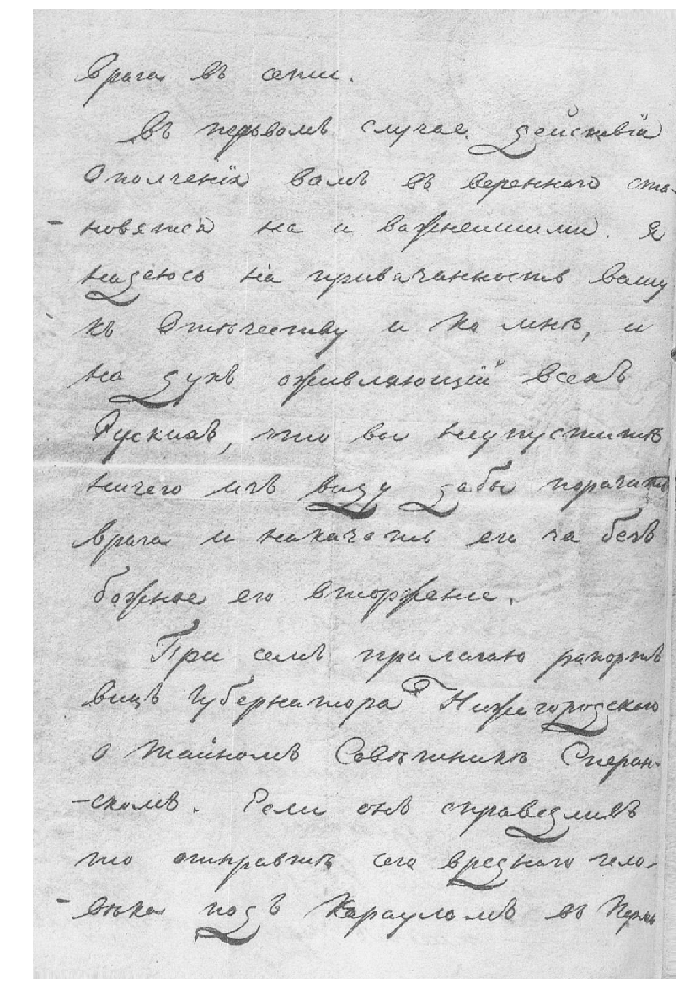

binary


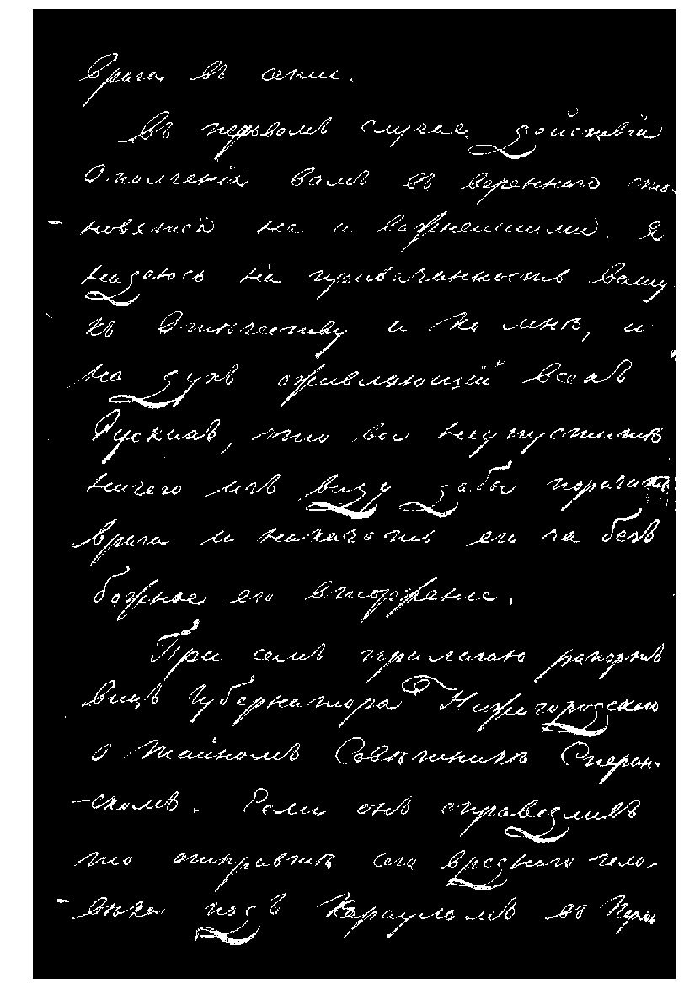

dilation


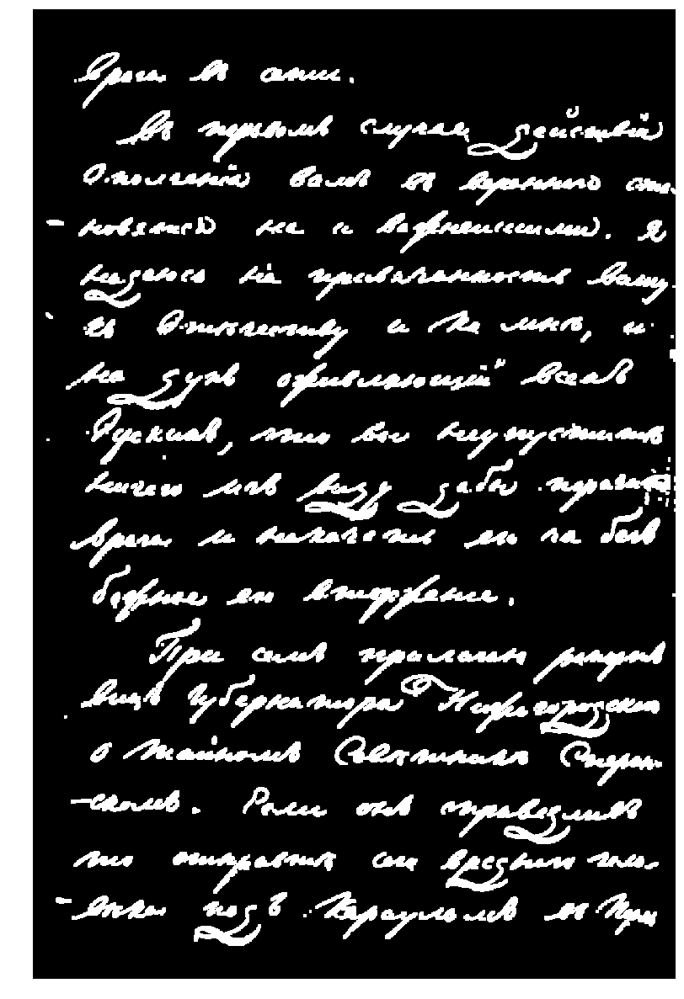

226
Фрагмент № 0


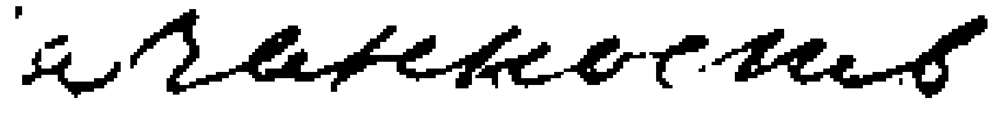

Фрагмент № 1


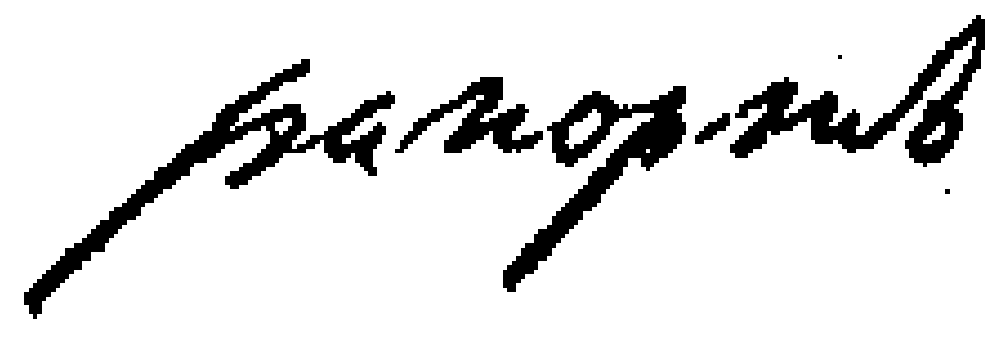

Фрагмент № 2


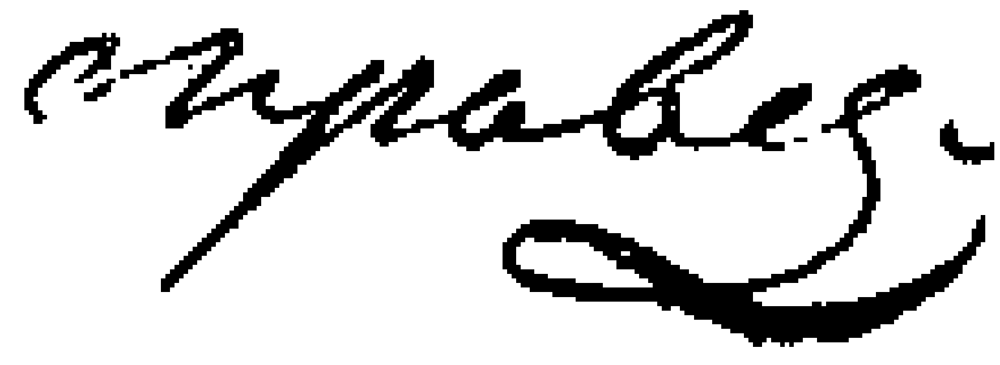

Фрагмент № 3


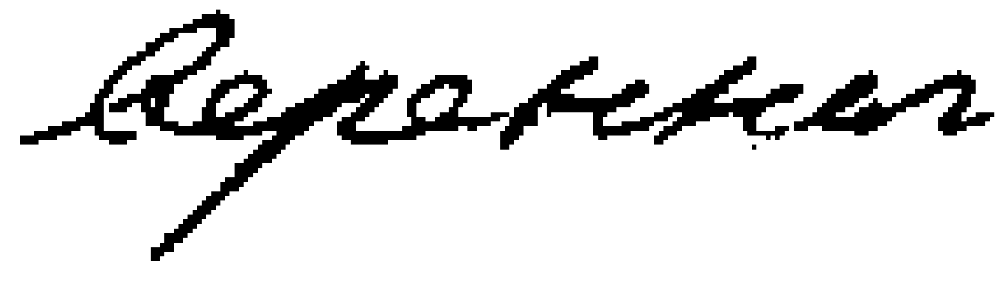

Фрагмент № 4


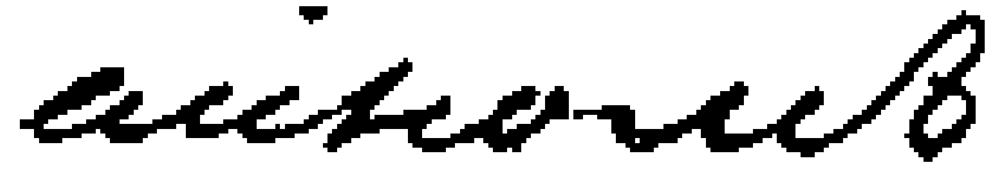

Фрагмент № 5


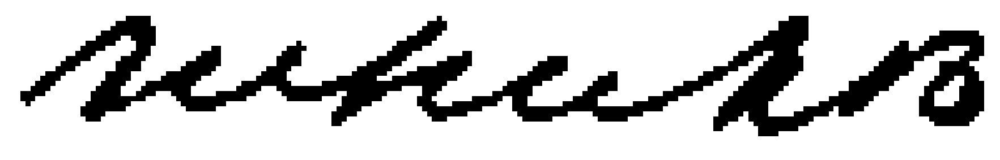

Фрагмент № 6


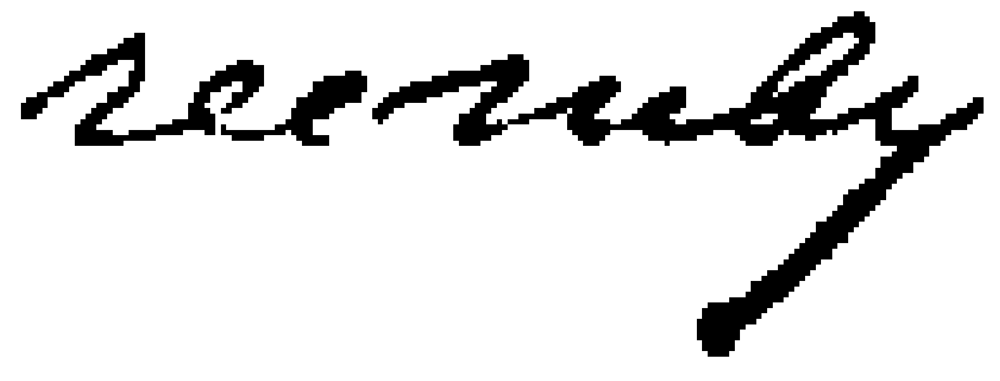

Фрагмент № 7


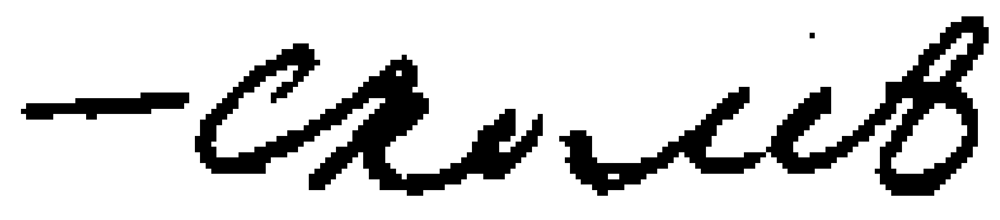

Фрагмент № 8


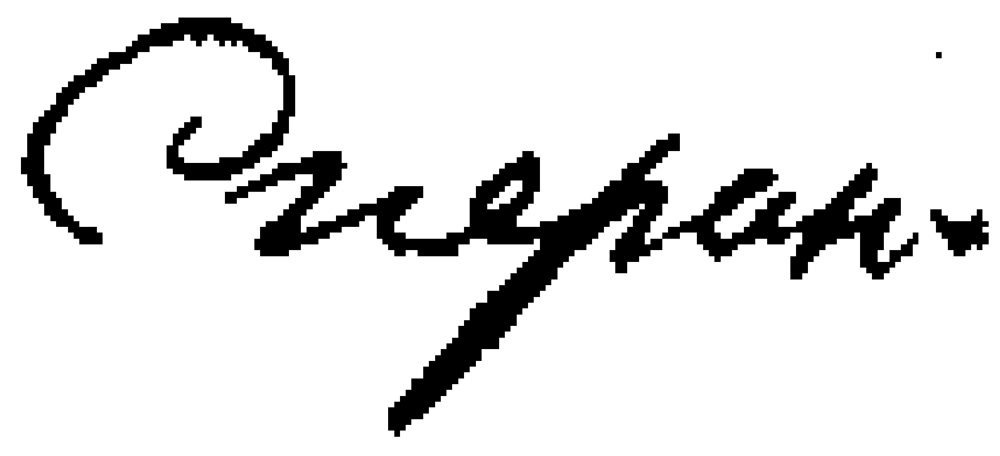

Фрагмент № 9


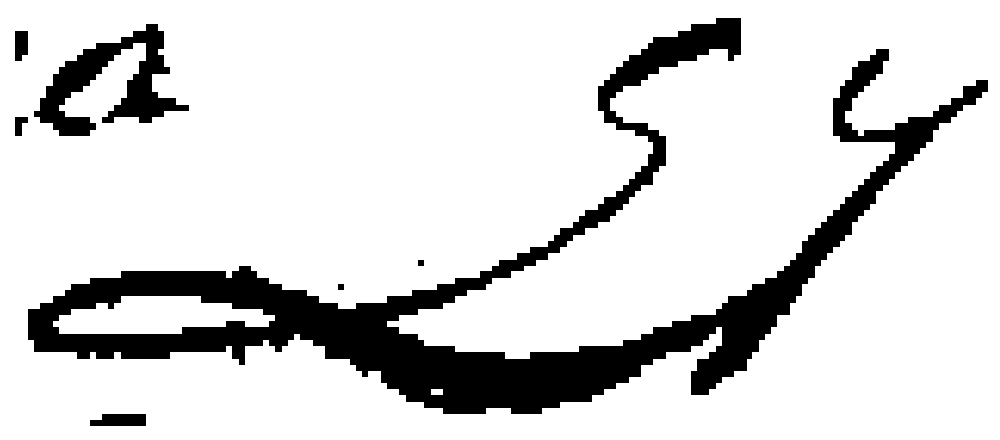

Фрагмент № 10


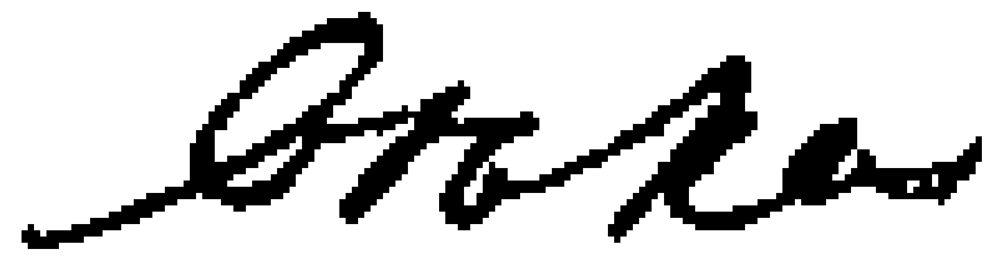

Фрагмент № 11


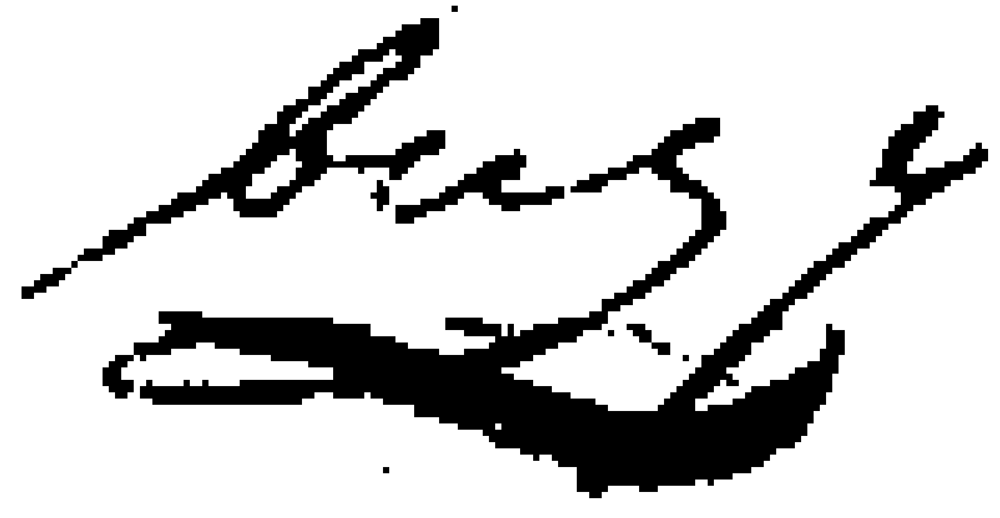

Фрагмент № 12


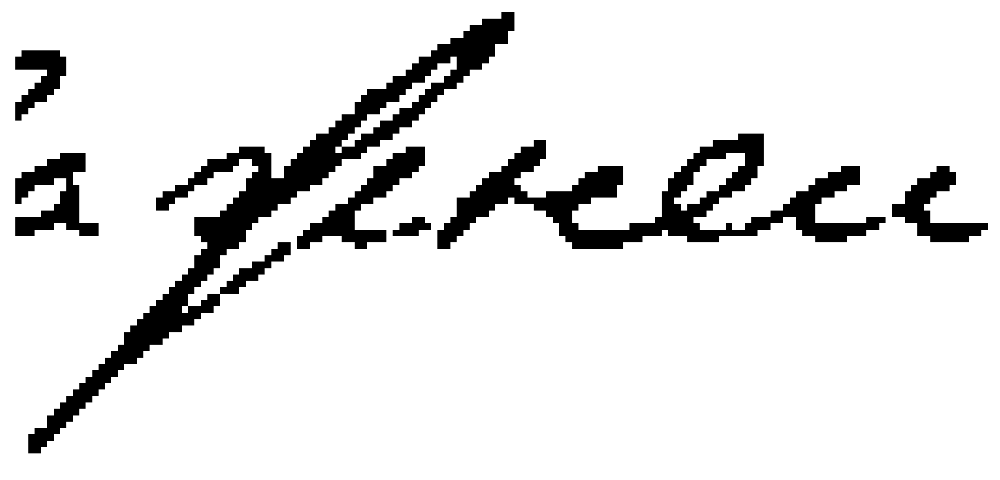

Фрагмент № 13


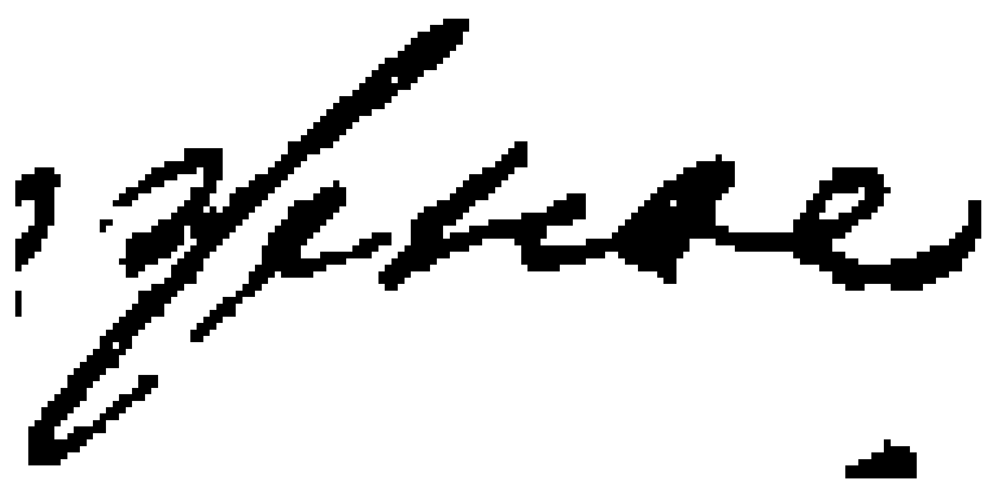

Фрагмент № 14


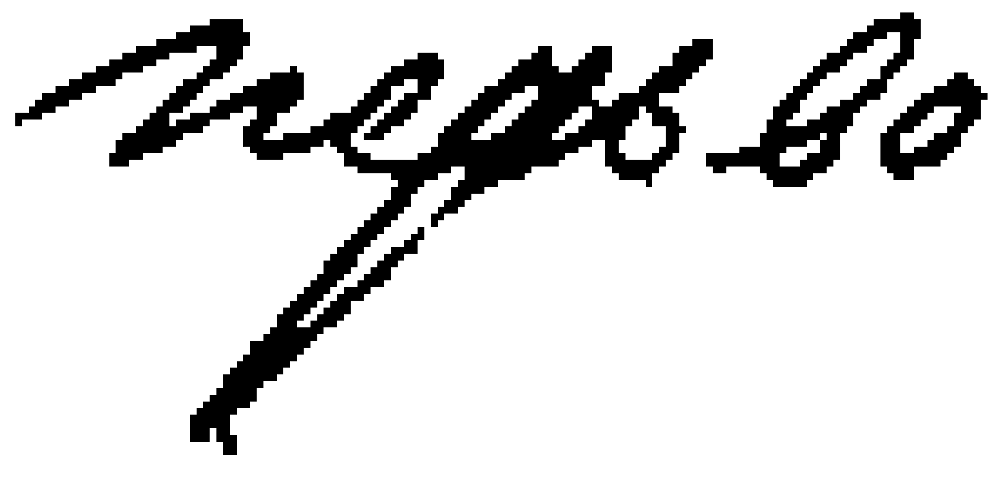

Фрагмент № 15


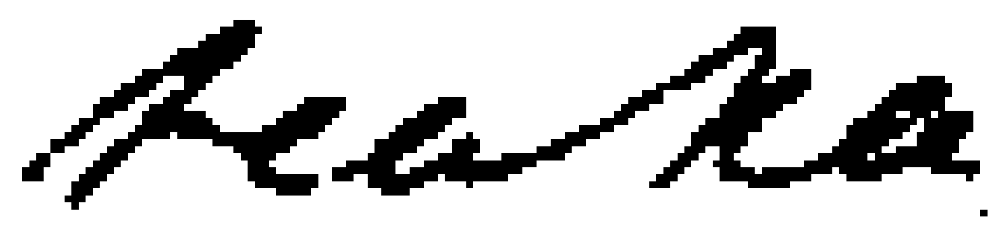

Фрагмент № 16


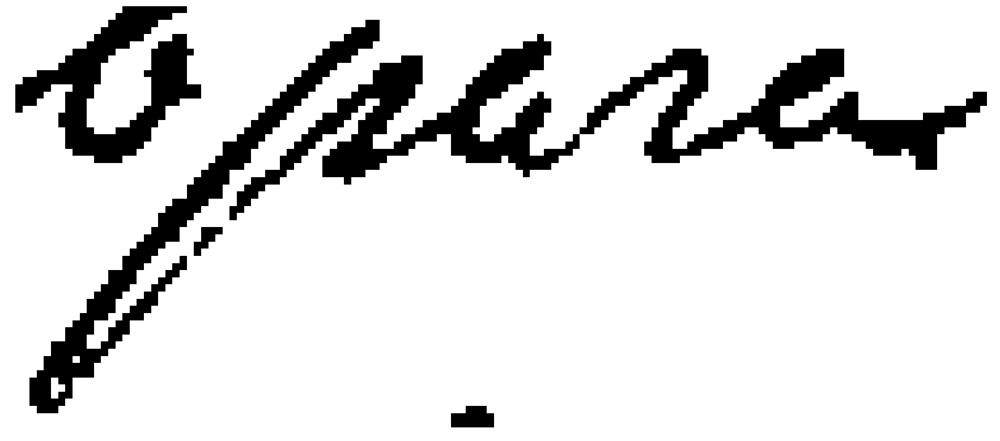

Фрагмент № 17


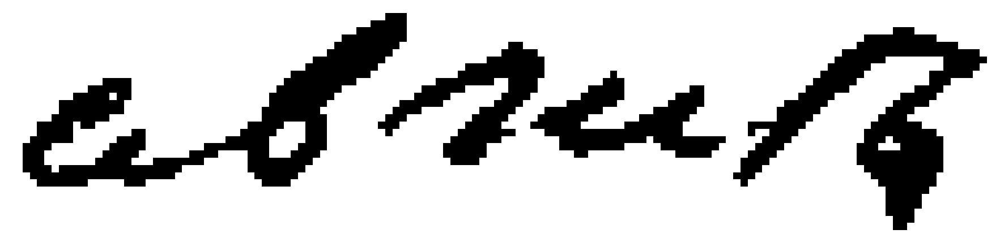

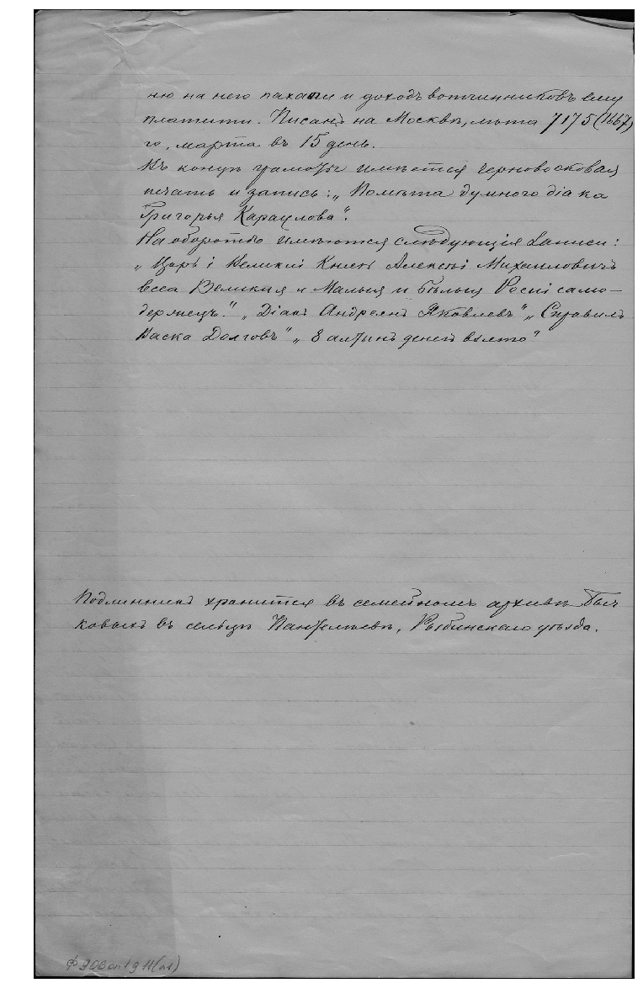

binary


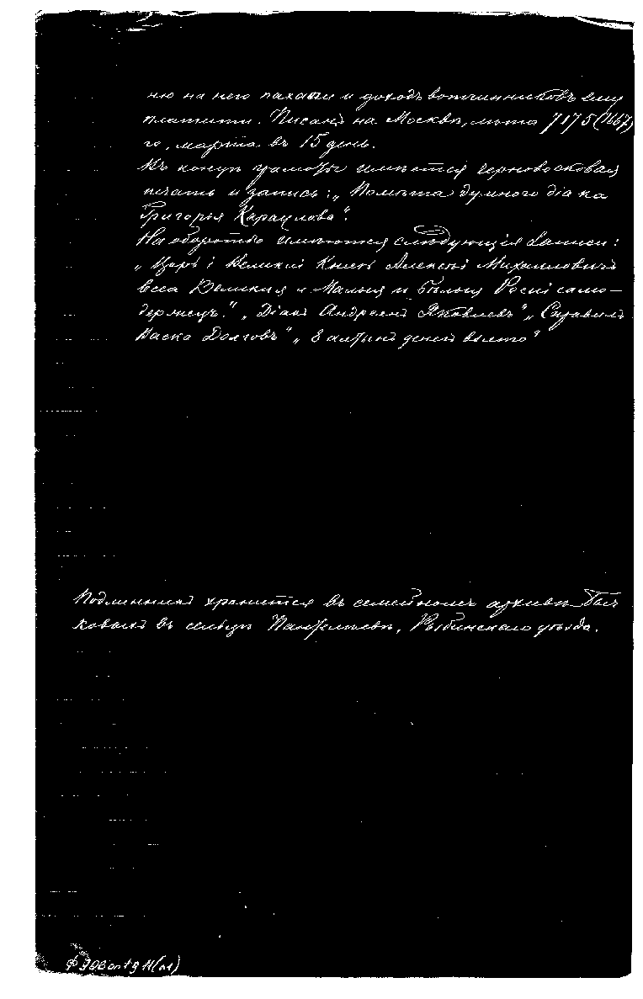

dilation


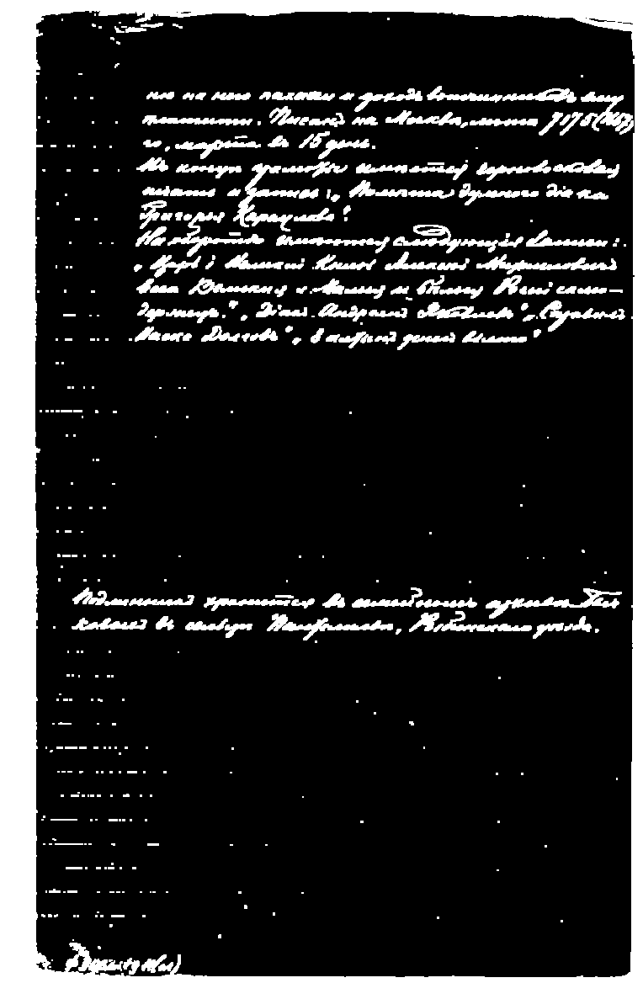

440
Фрагмент № 0


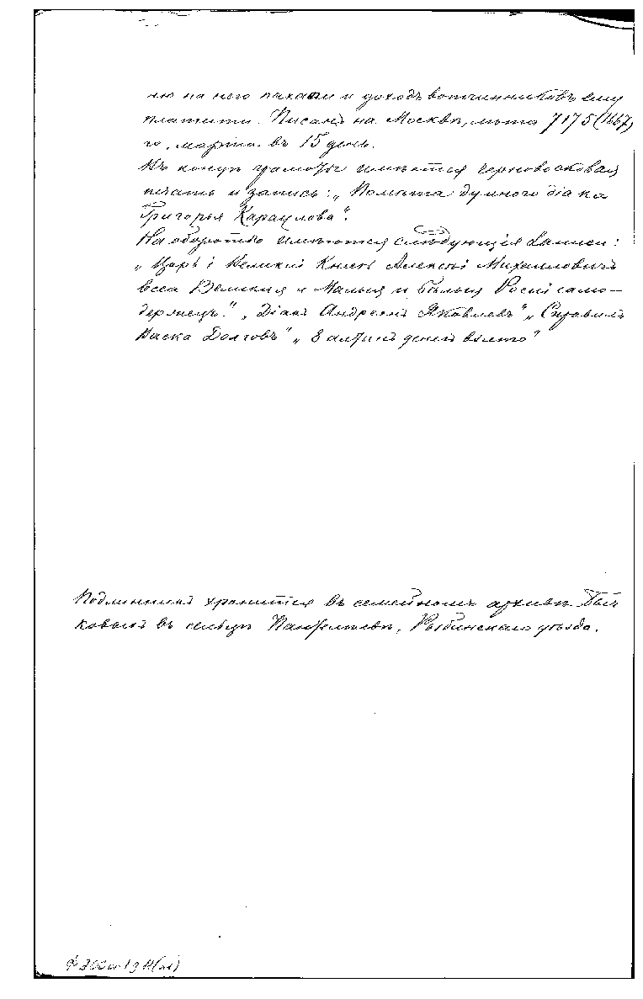

Фрагмент № 1


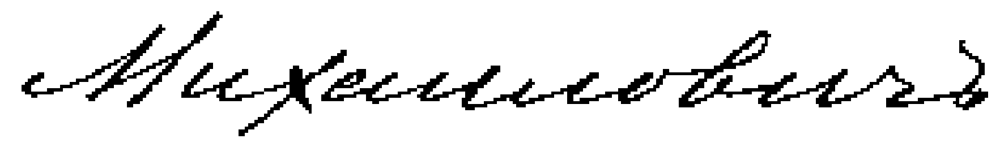

Фрагмент № 2


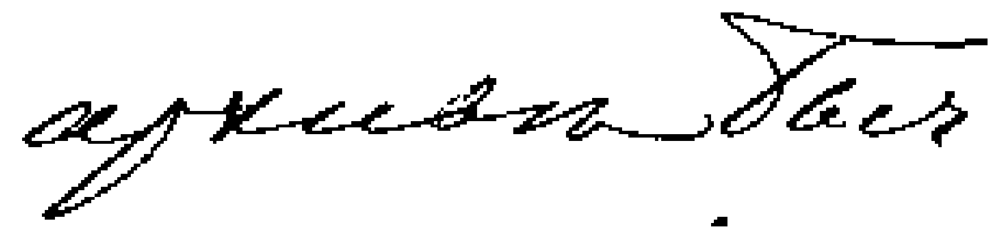

Фрагмент № 3


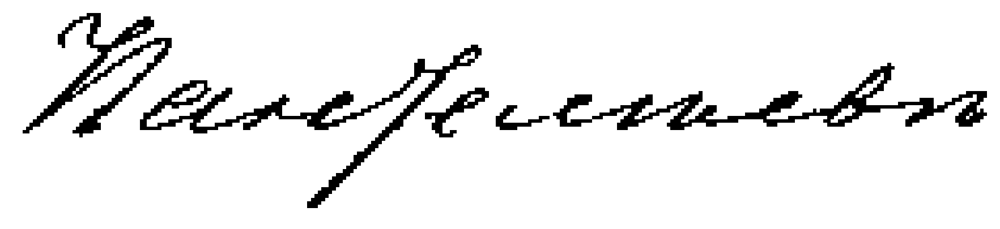

Фрагмент № 4


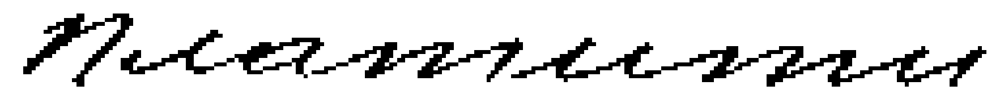

Фрагмент № 5


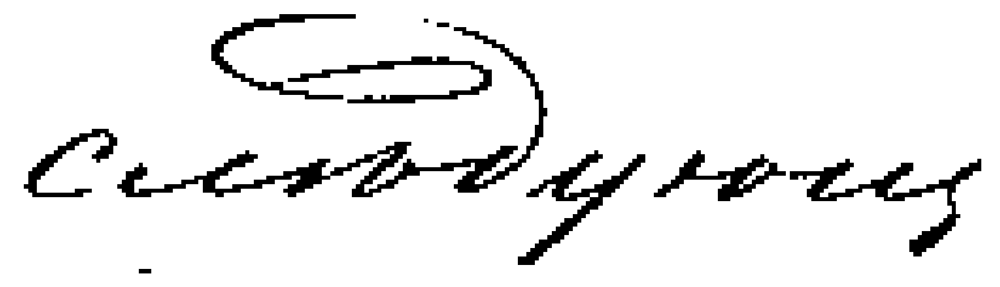

Фрагмент № 6


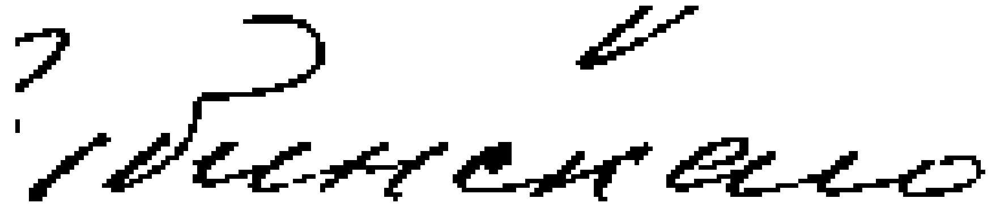

Фрагмент № 7


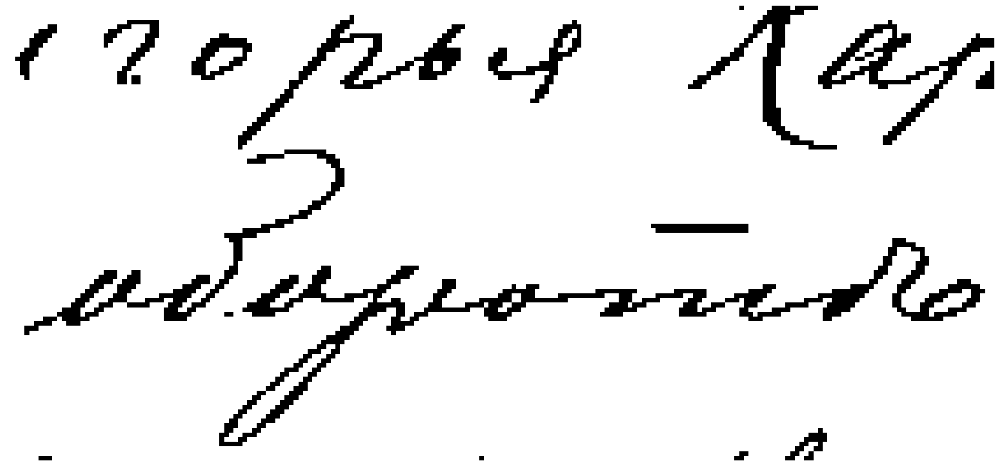

Фрагмент № 8


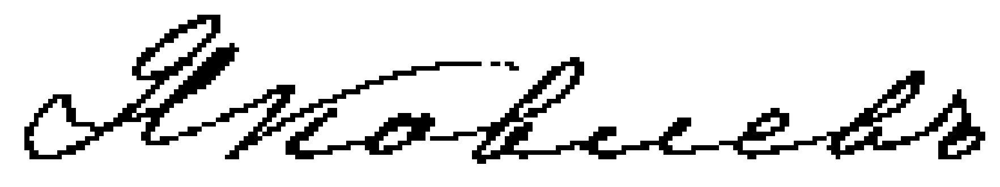

Фрагмент № 9


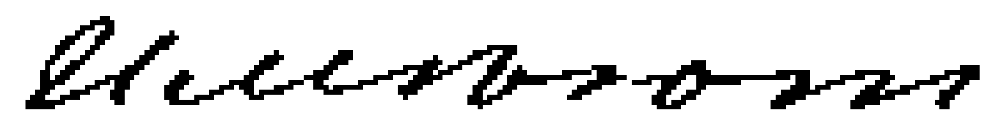

Фрагмент № 10


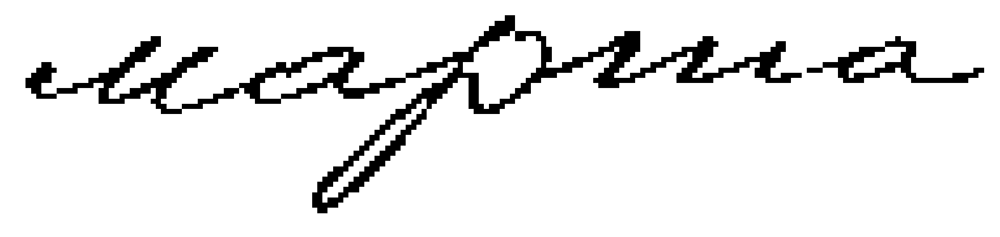

Фрагмент № 11


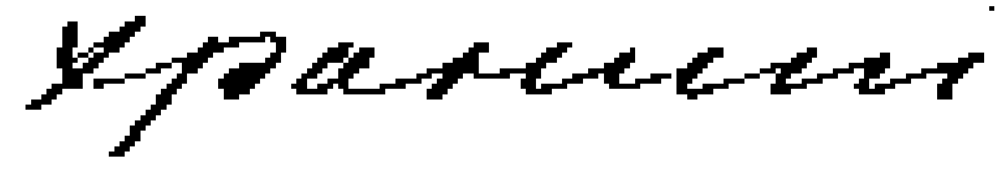

Фрагмент № 12


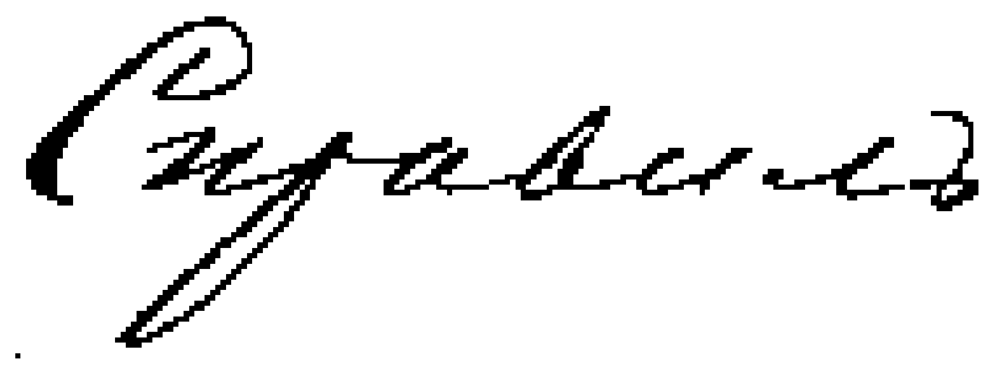

Фрагмент № 13


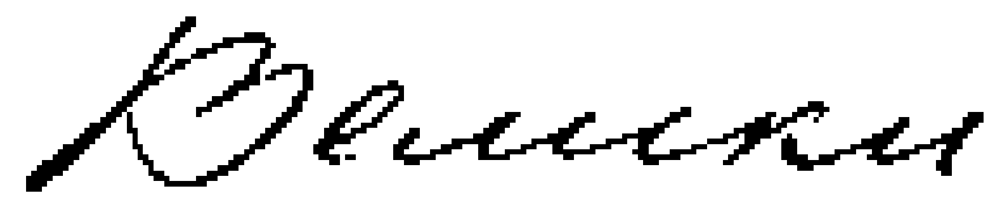

Фрагмент № 14


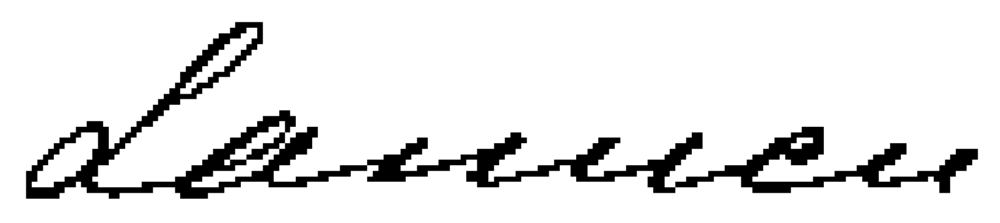

Фрагмент № 15


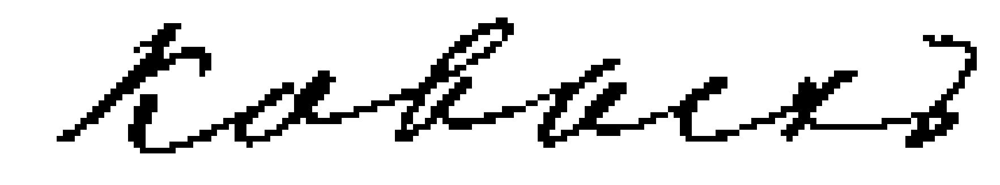

Фрагмент № 16


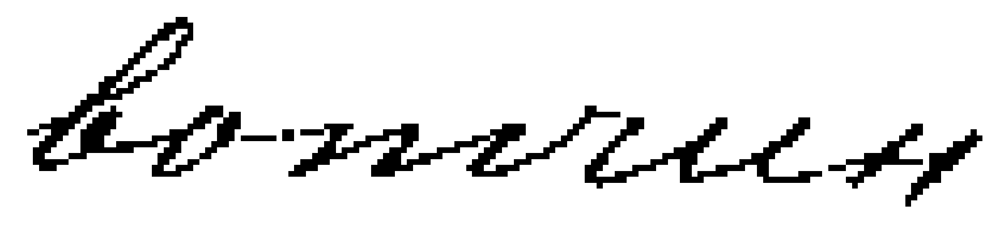

Фрагмент № 17


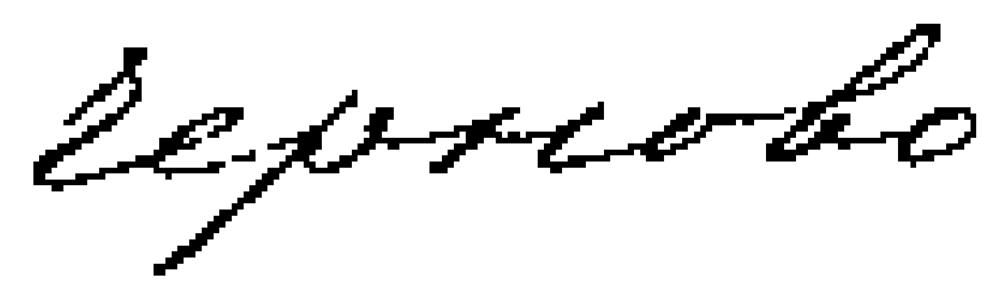

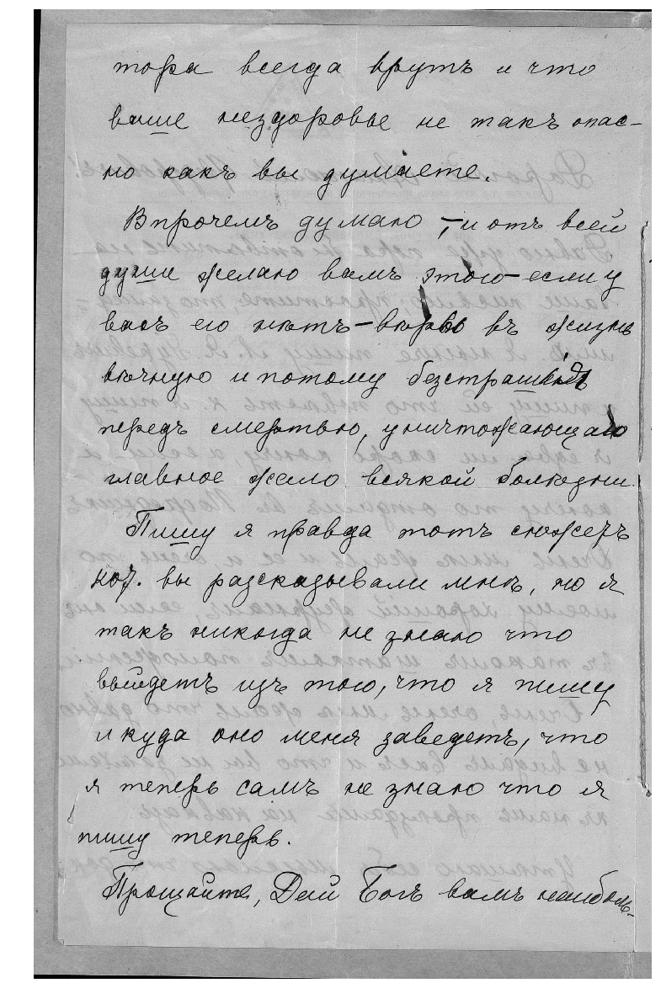

binary


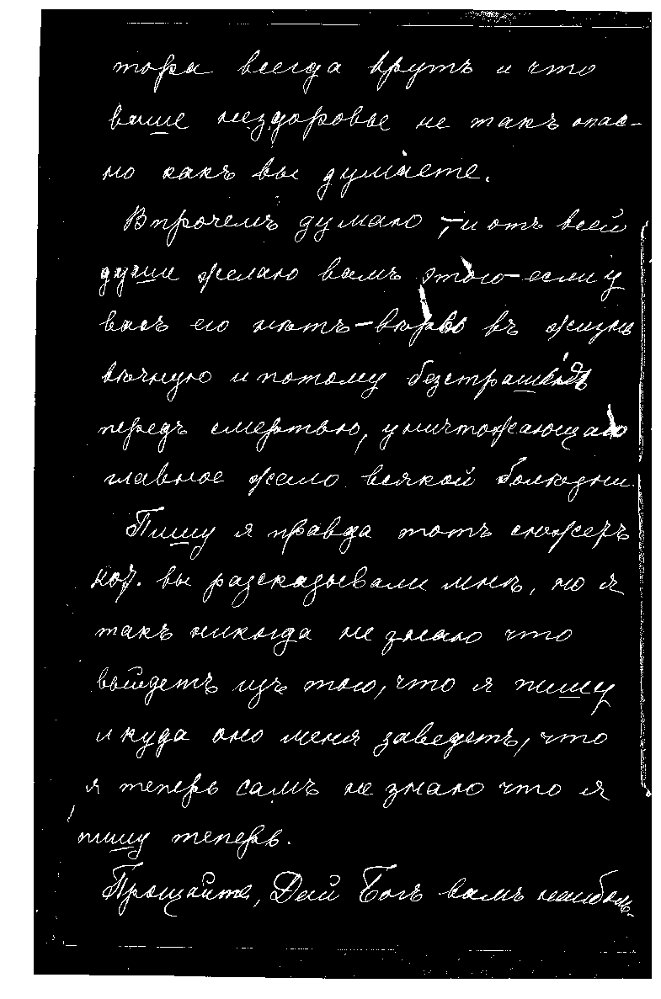

dilation


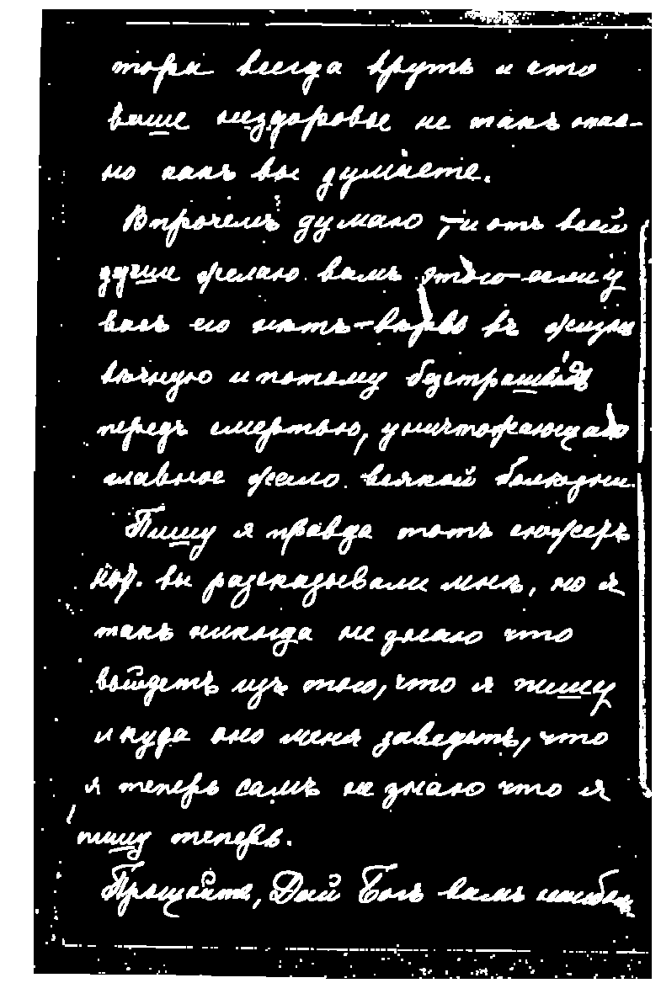

414
Фрагмент № 0


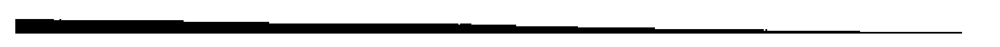

Фрагмент № 1


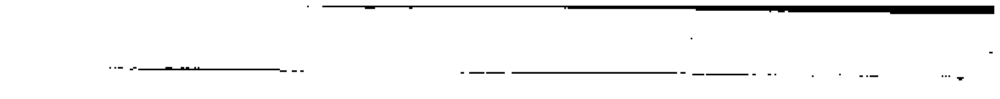

Фрагмент № 2


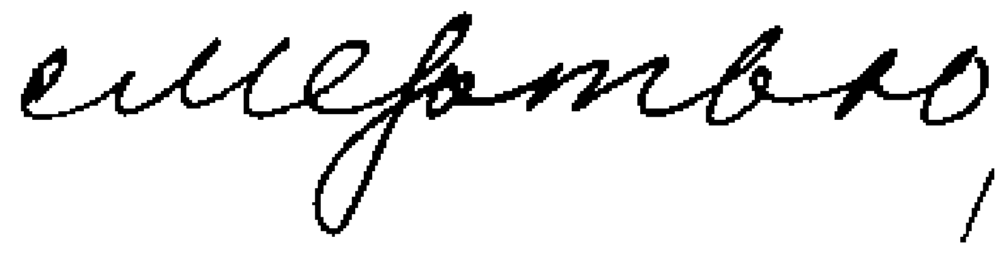

Фрагмент № 3


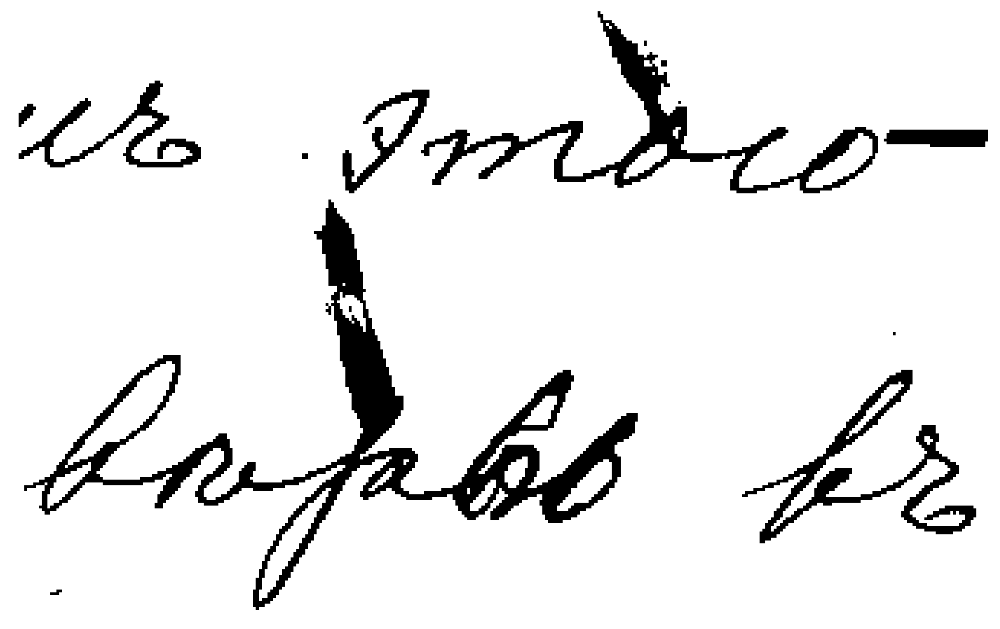

Фрагмент № 4


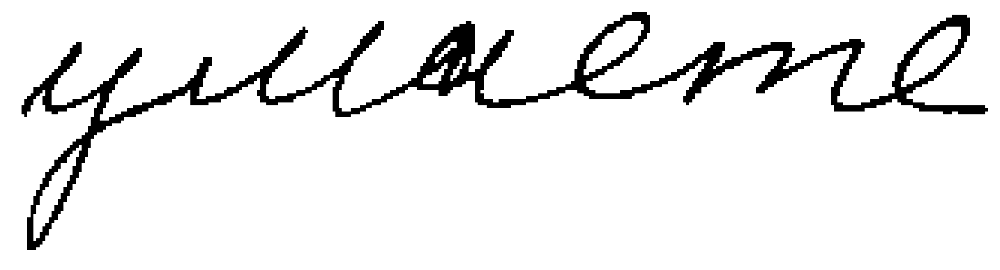

Фрагмент № 5


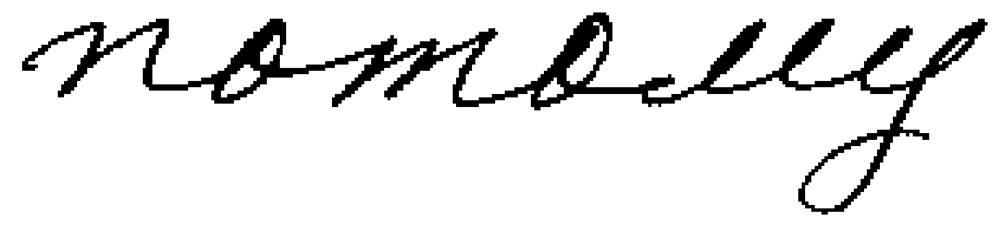

Фрагмент № 6


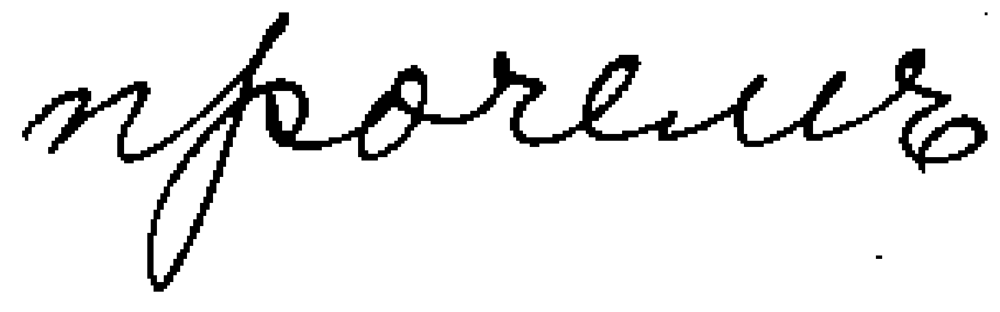

Фрагмент № 7


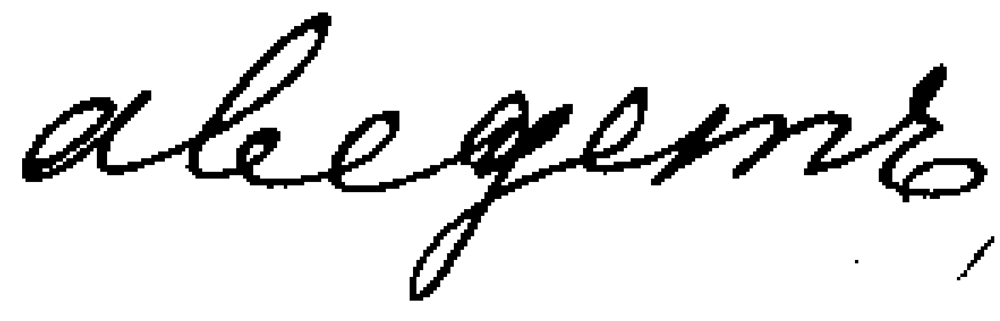

Фрагмент № 8


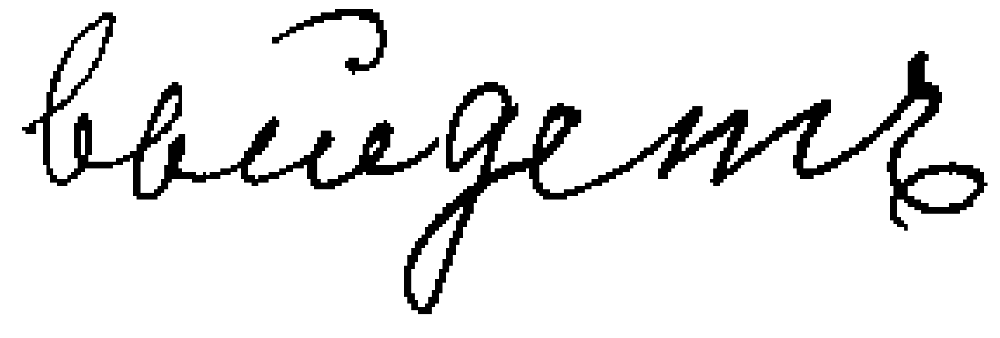

Фрагмент № 9


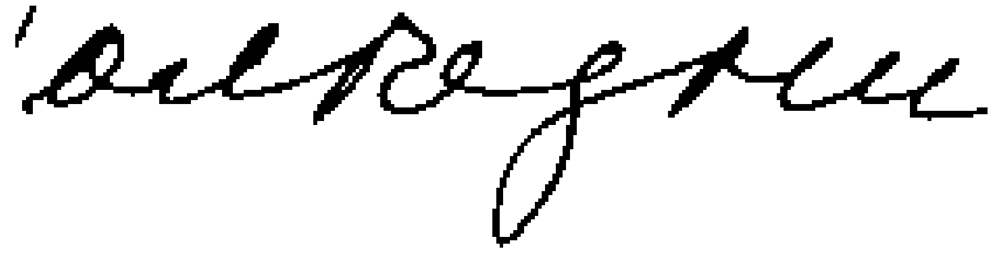

Фрагмент № 10


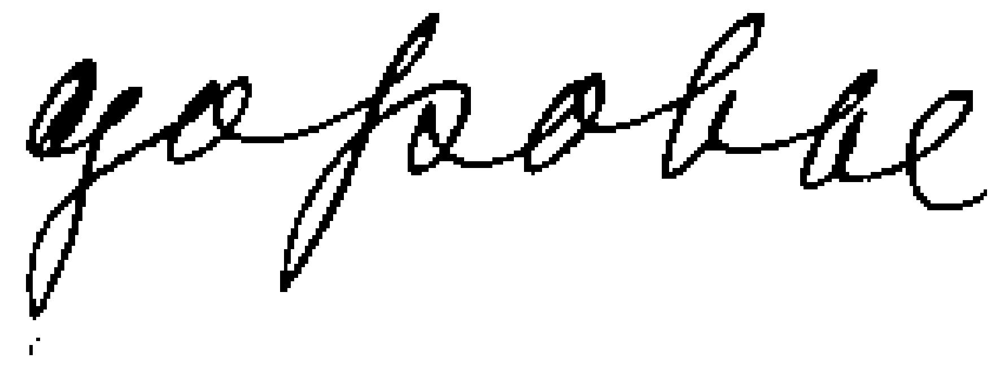

Фрагмент № 11


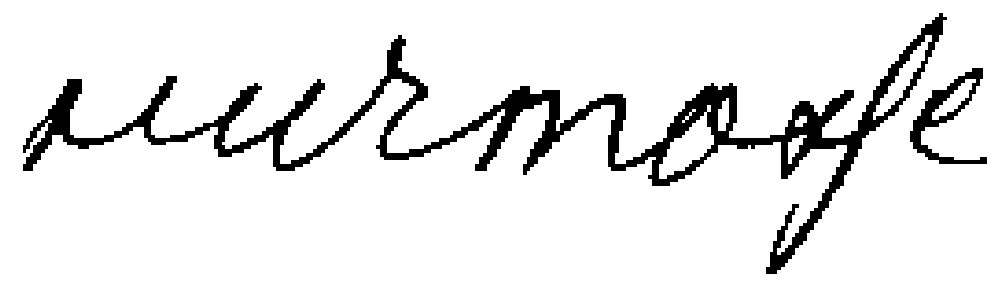

Фрагмент № 12


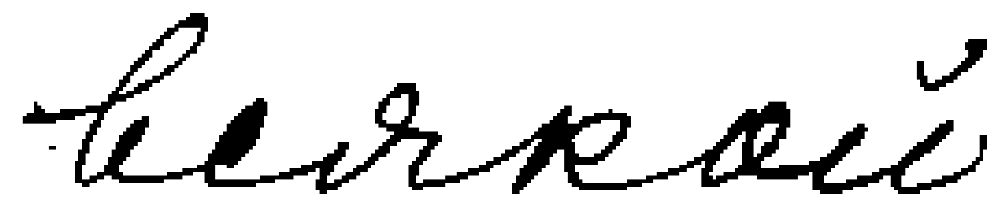

Фрагмент № 13


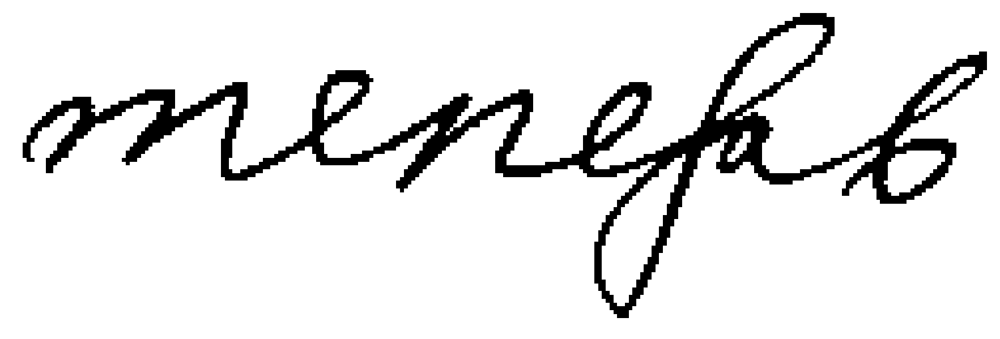

Фрагмент № 14


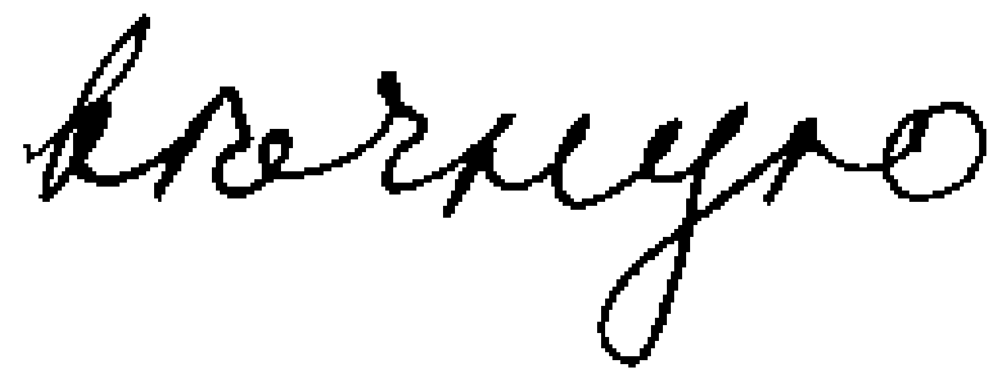

Фрагмент № 15


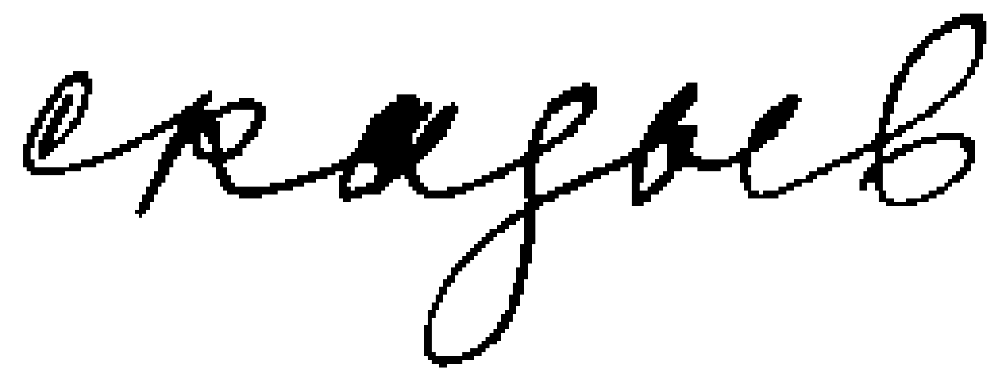

Фрагмент № 16


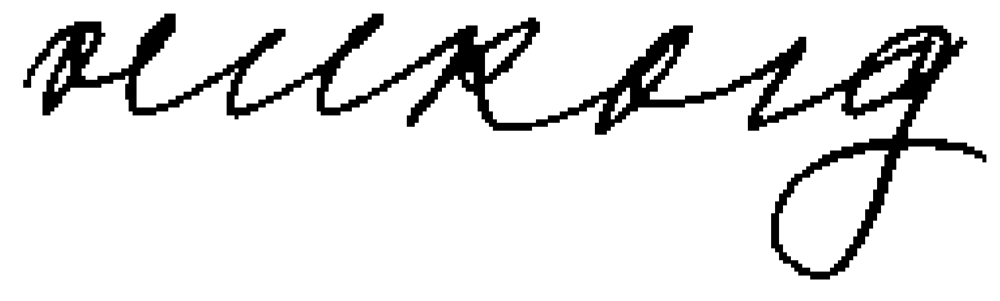

Фрагмент № 17


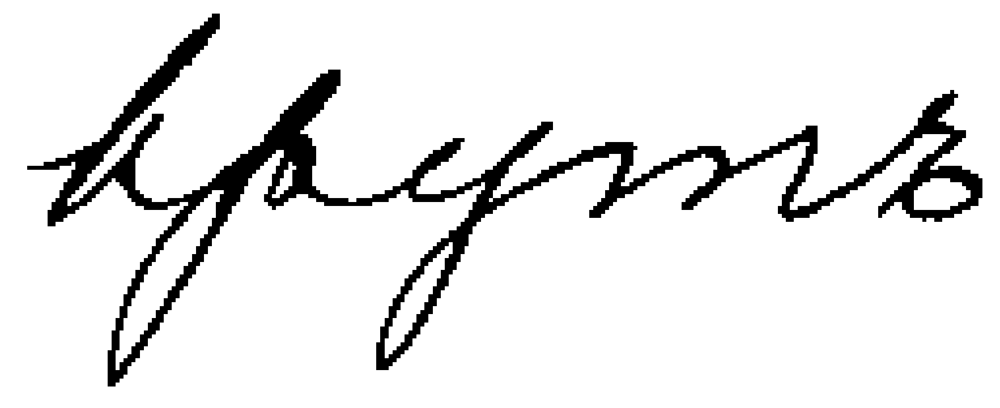

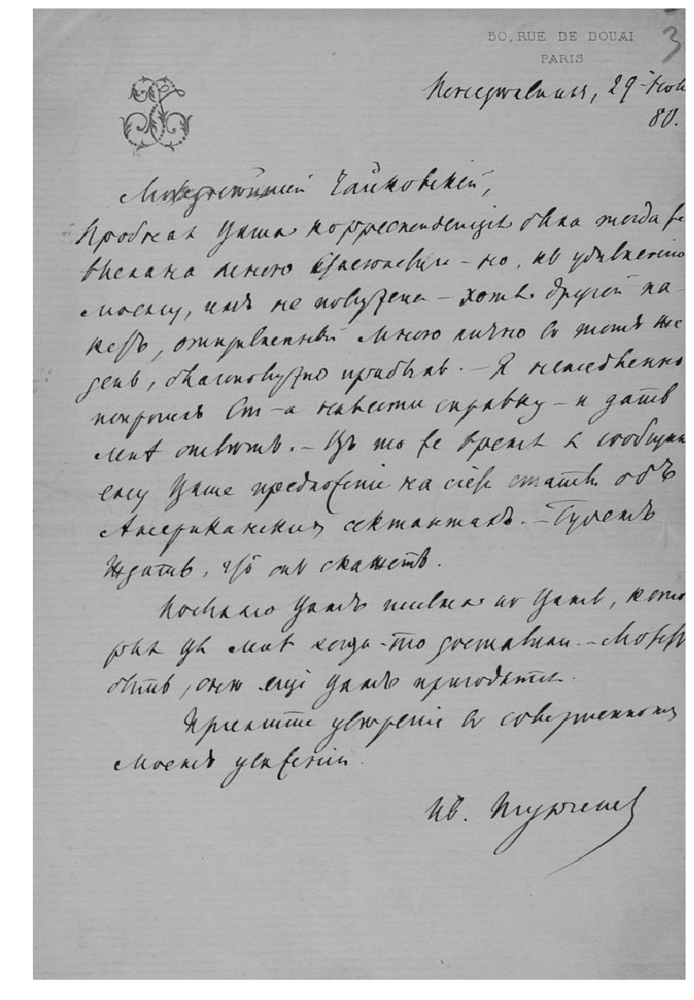

binary


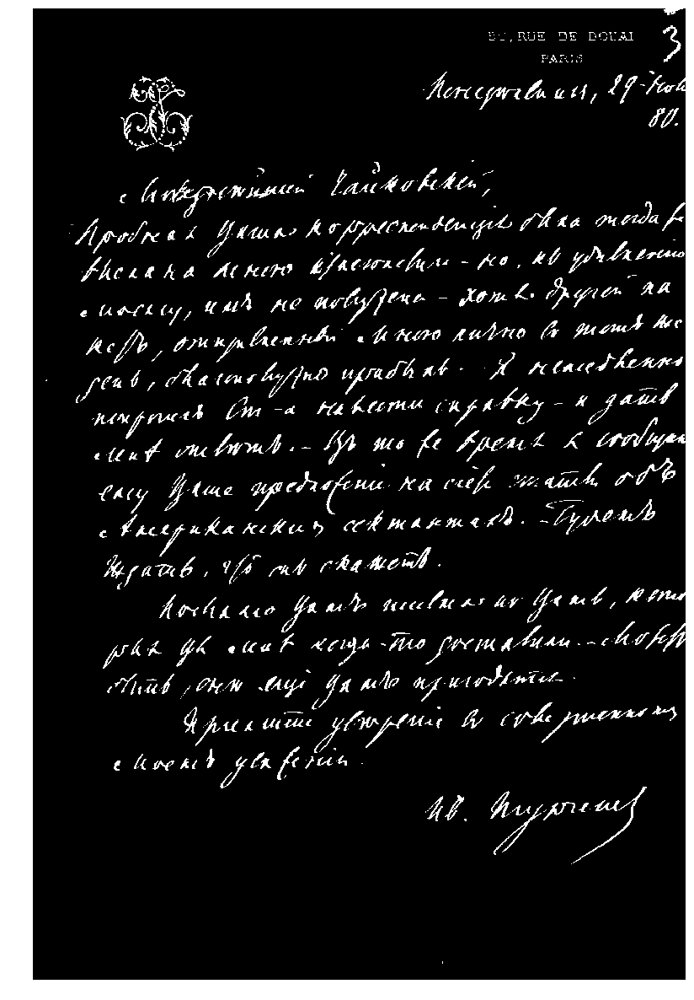

dilation


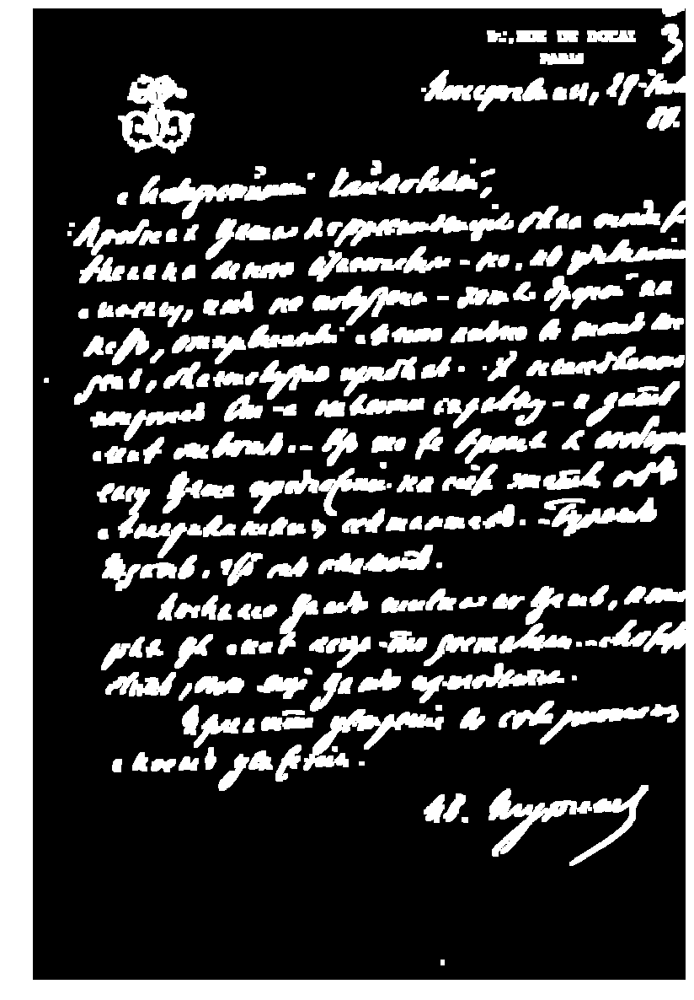

254
Фрагмент № 0


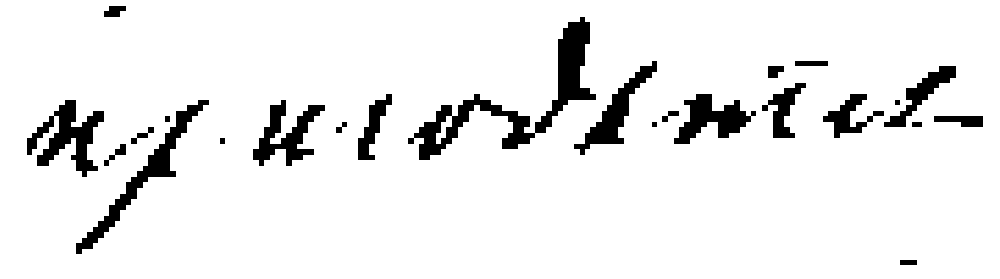

Фрагмент № 1


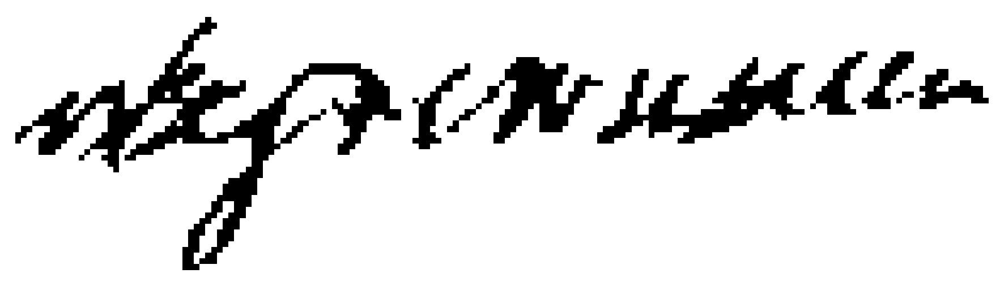

Фрагмент № 2


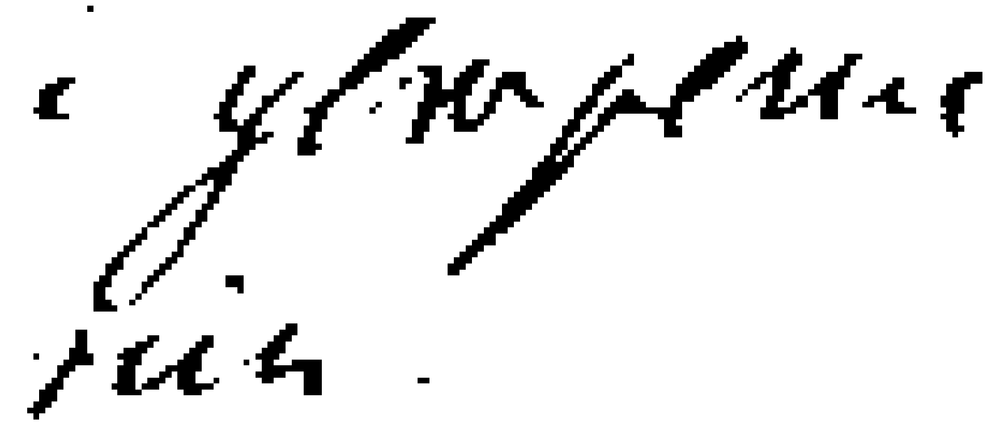

Фрагмент № 3


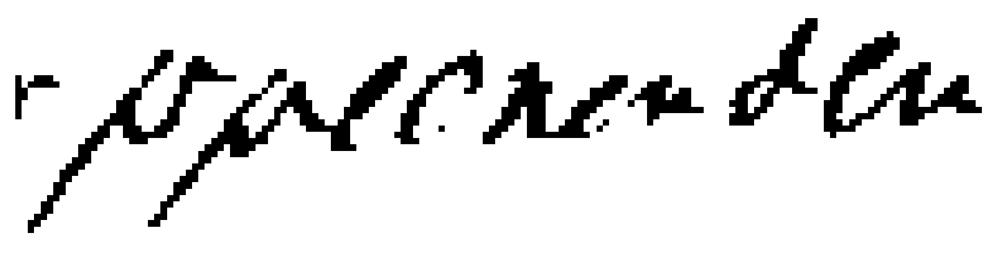

Фрагмент № 4


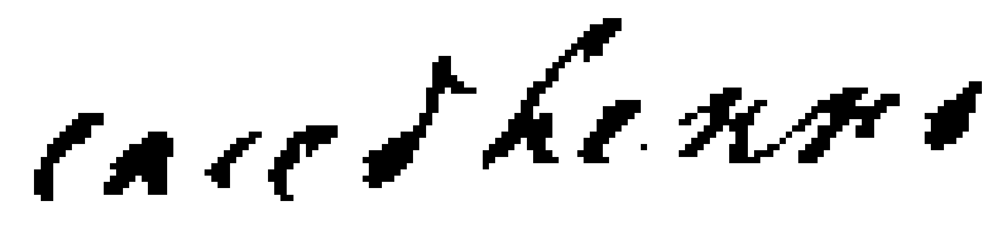

Фрагмент № 5


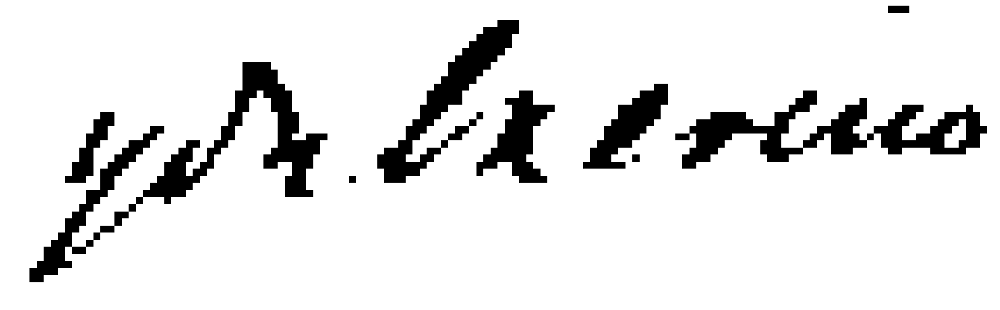

Фрагмент № 6


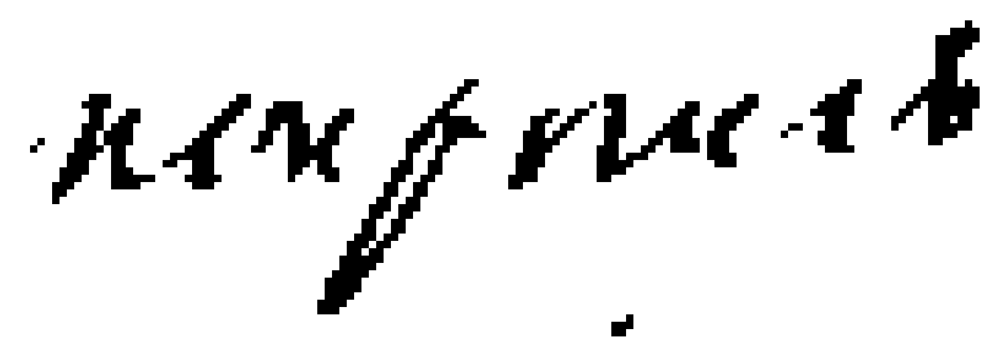

Фрагмент № 7


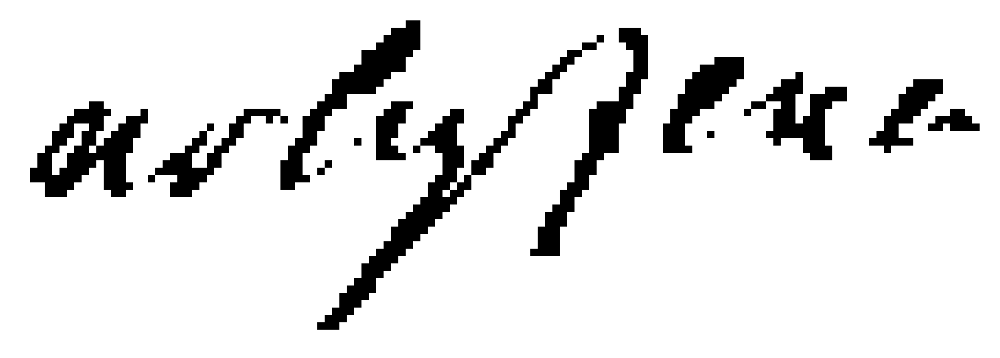

Фрагмент № 8


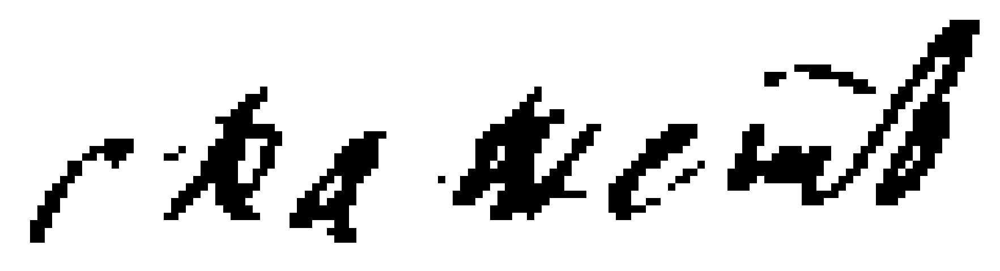

Фрагмент № 9


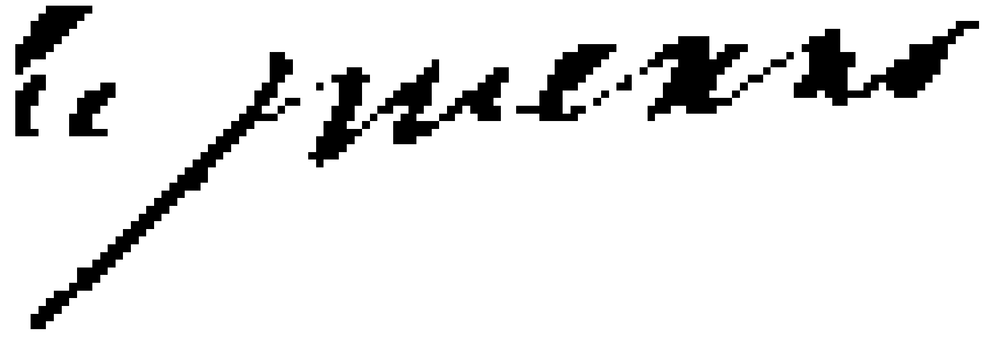

Фрагмент № 10


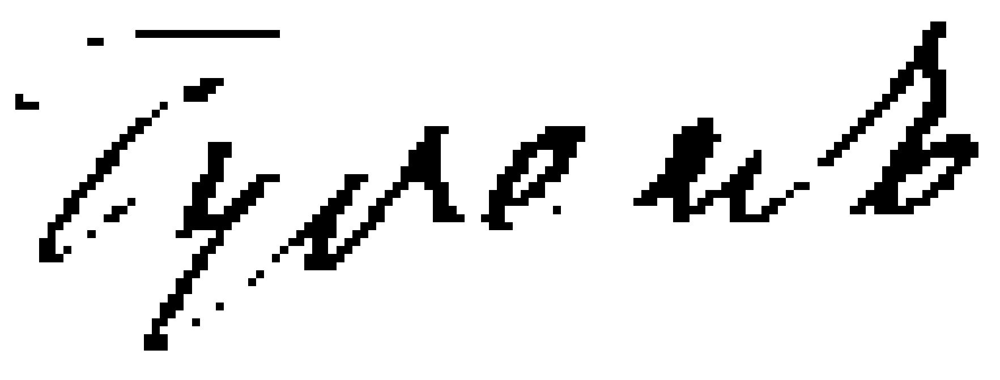

Фрагмент № 11


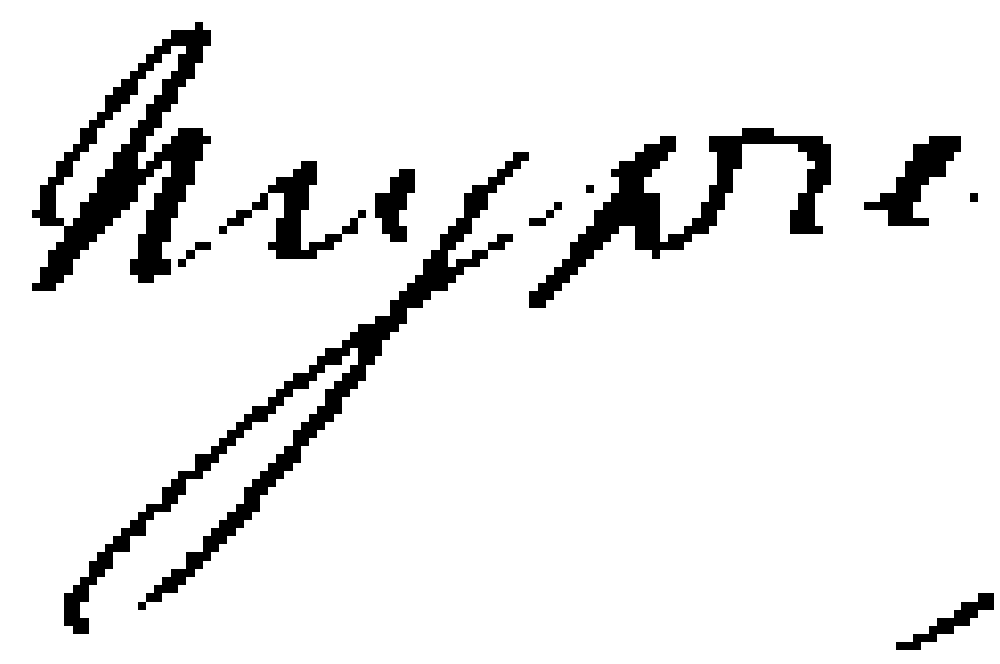

Фрагмент № 12


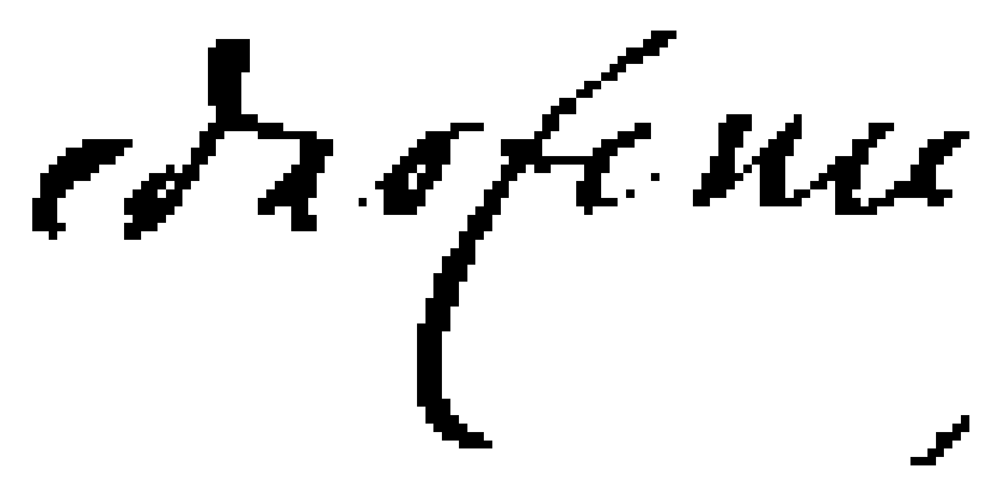

Фрагмент № 13


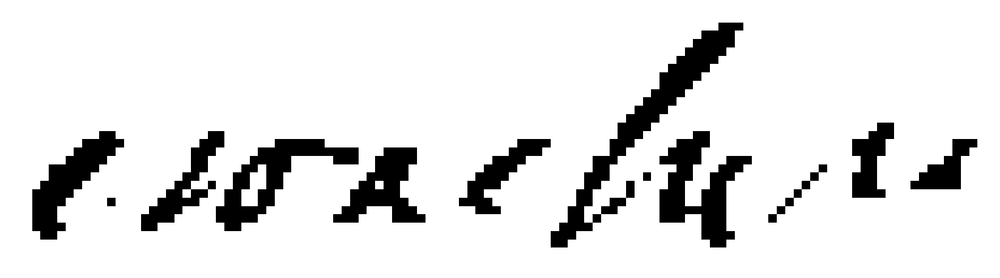

Фрагмент № 14


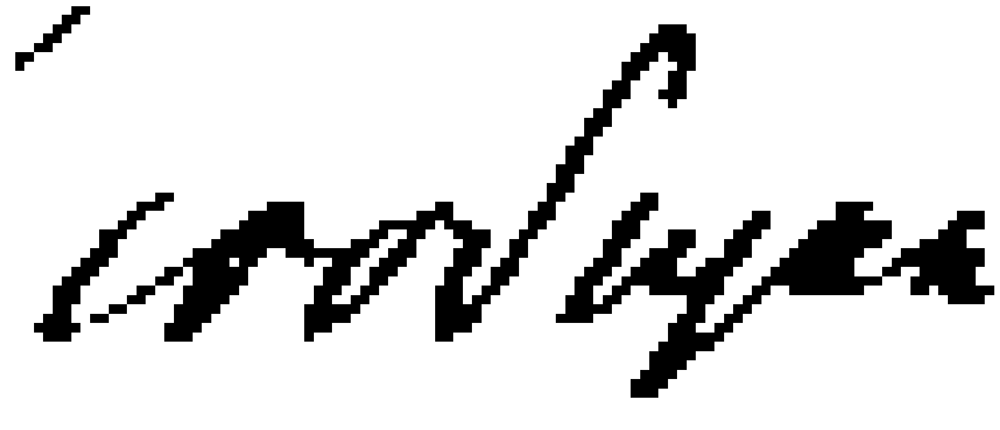

Фрагмент № 15


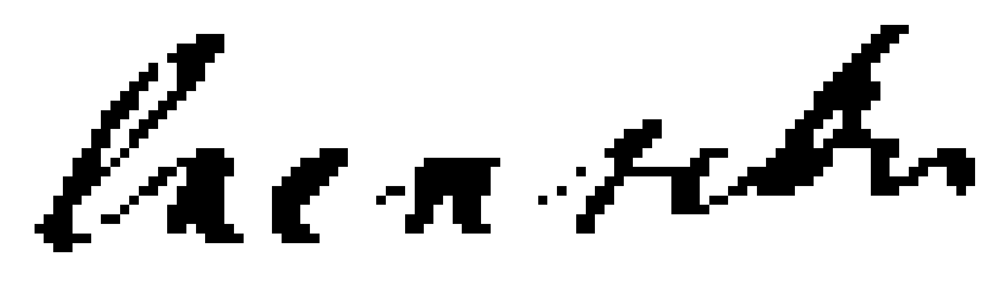

Фрагмент № 16


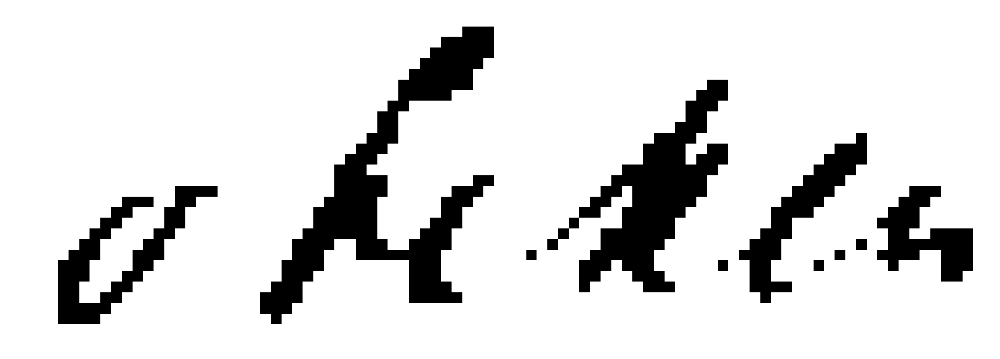

Фрагмент № 17


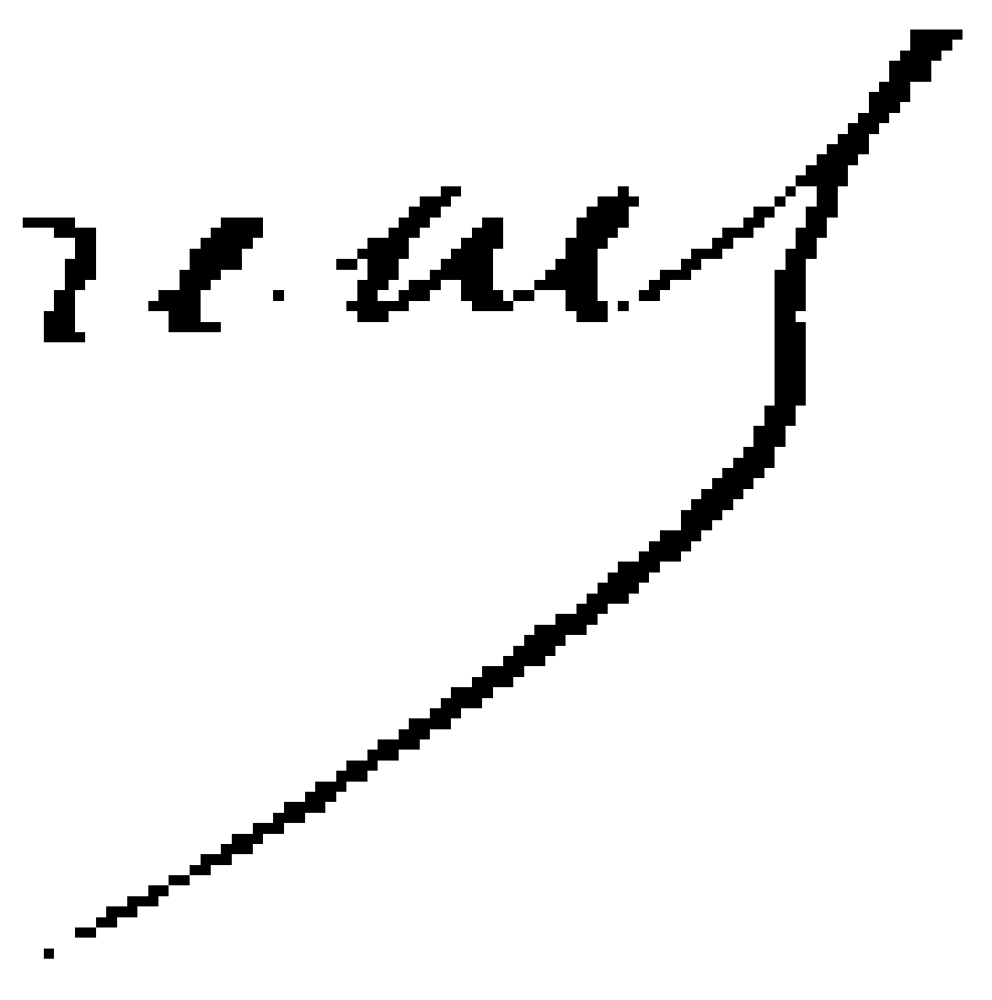

In [53]:
path_var = 'Literature Data/test_variant_7'
path_load = 'Literature Data/test_words_real'
try:
    os.mkdir(path_load)
except OSError: 
    print ("Директория уже создана " + train_path)
imgs = os.listdir(path_var)
for j, img_p in enumerate(imgs):
    if 0 <= j <= 3:
        try:
            img_path = path_var + '/' + img_p
            img = cv2.imread(img_path)
            train_words = new_words_extraction(img, 18)
            for i, word in enumerate(train_words):
                    path_i = path_load + '/' + '7_' + str(j) + '_' +'word_'  + str(i) + '.png'
                    cv2.imwrite(path_i, word)
        except (TypeError, AttributeError, ZeroDivisionError):
            print('В варианте ' + str(j) + ' идентификторе ' + str(i) + ' произошла ошибка')

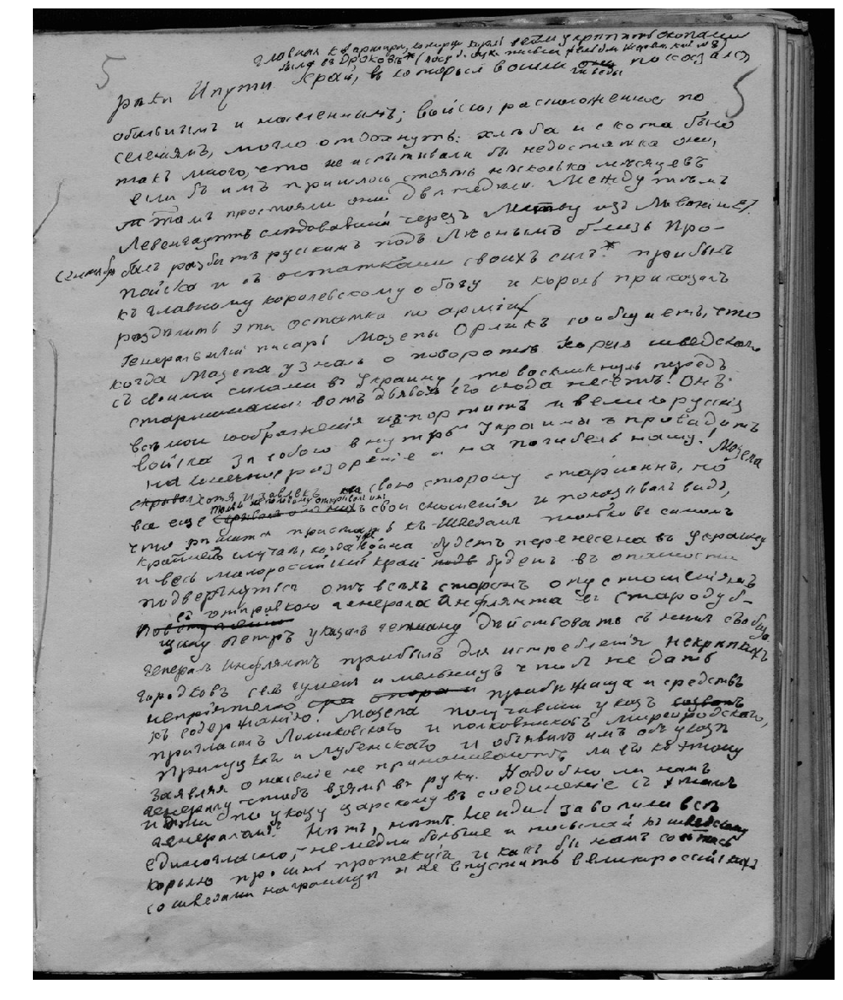

binary


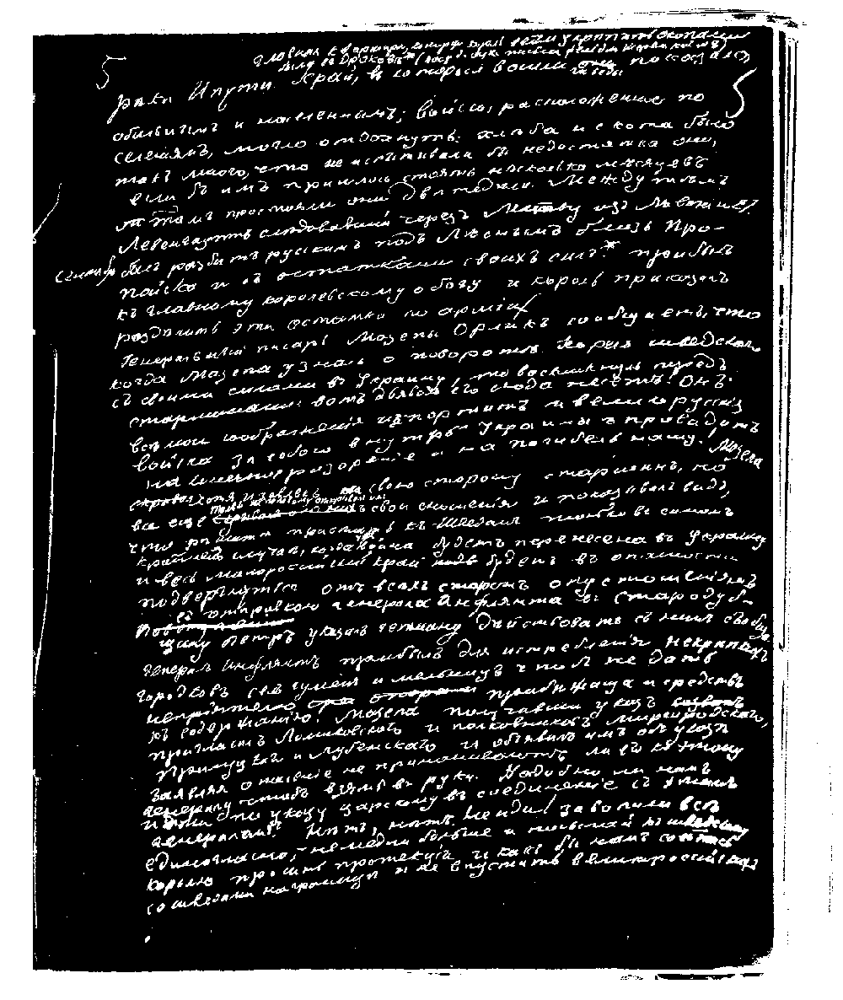

dilation


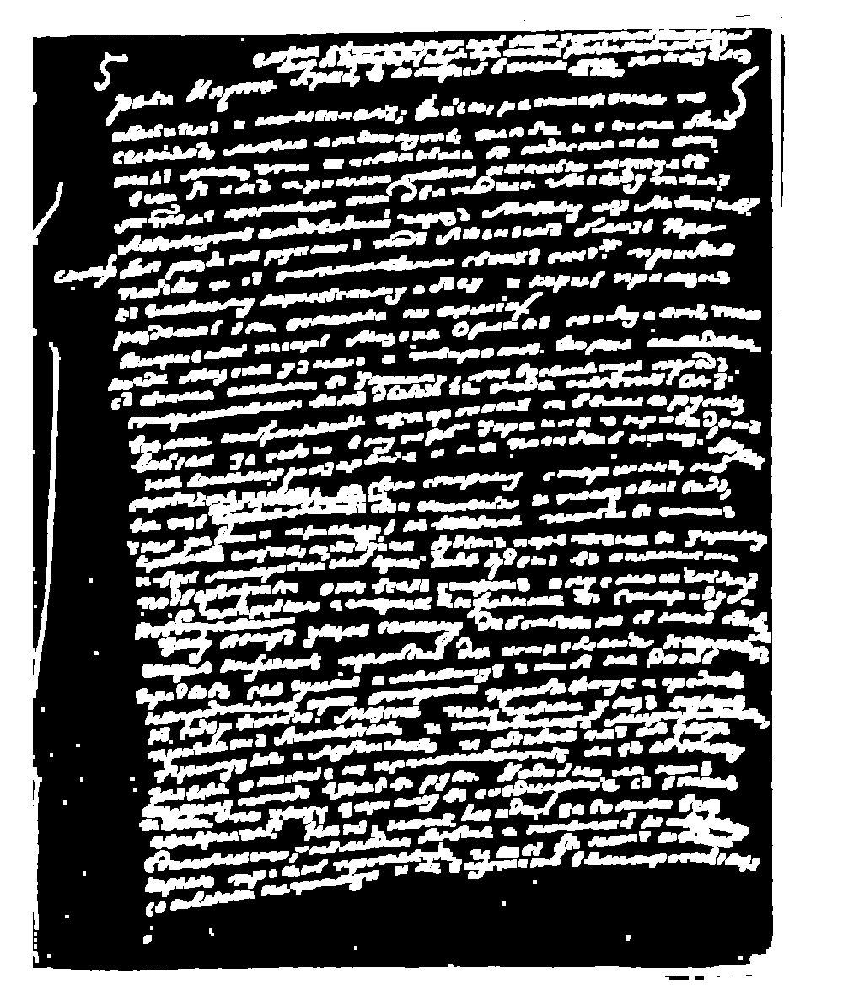

580
Фрагмент № 6


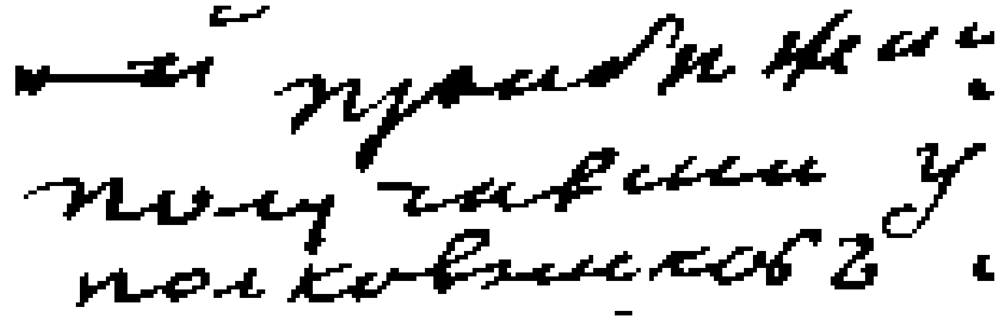

Фрагмент № 7


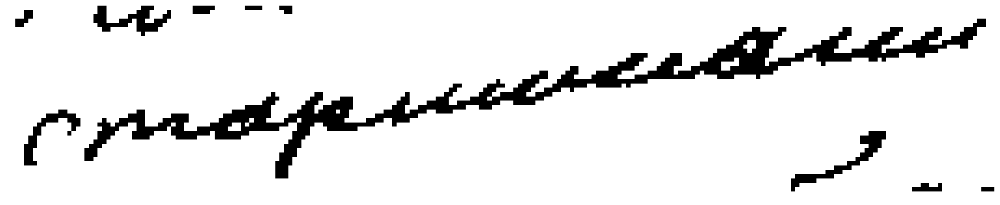

Фрагмент № 8


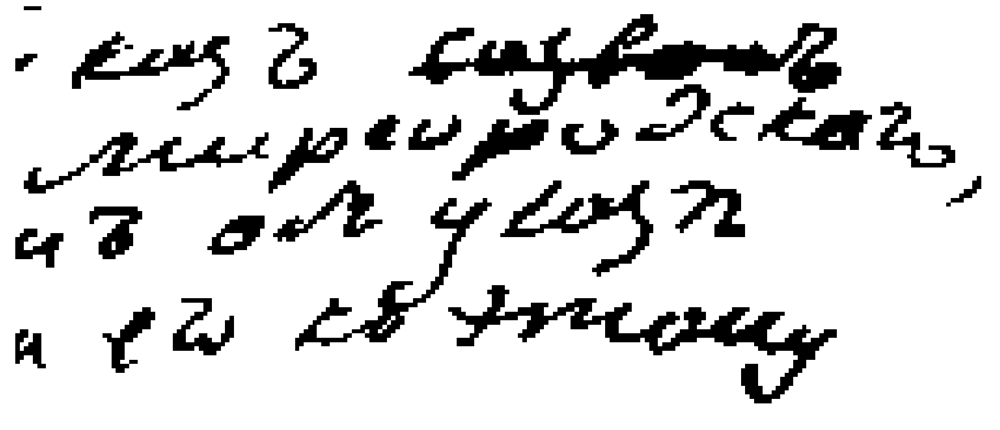

Фрагмент № 9


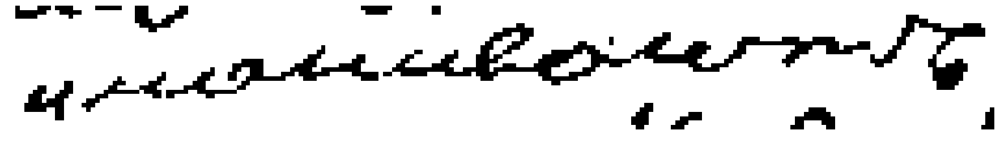

Фрагмент № 10


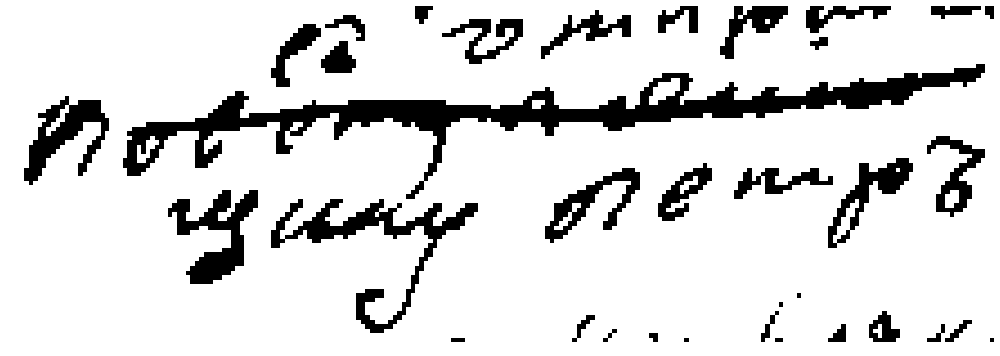

Фрагмент № 11


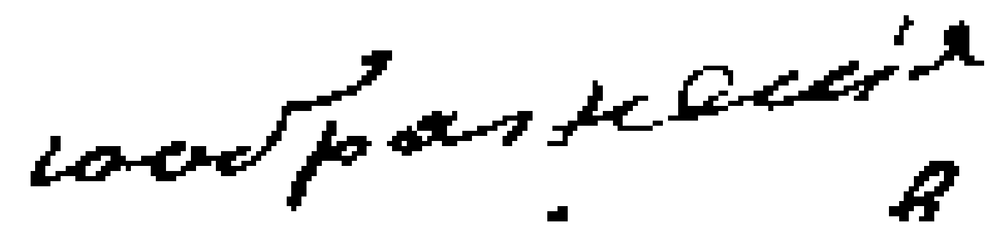

Фрагмент № 12


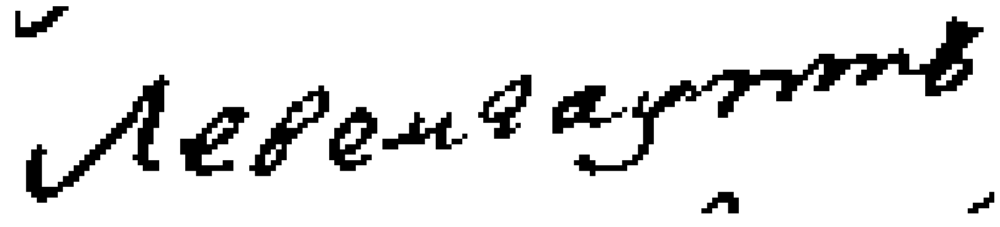

Фрагмент № 13


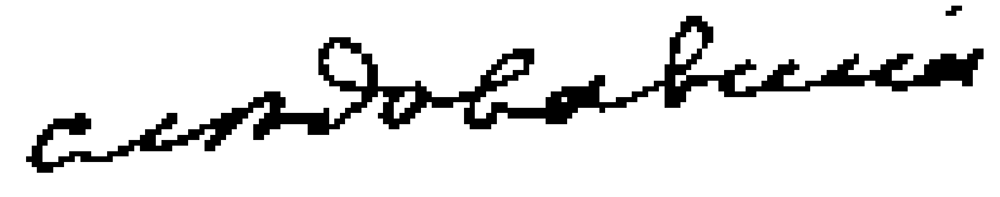

Фрагмент № 14


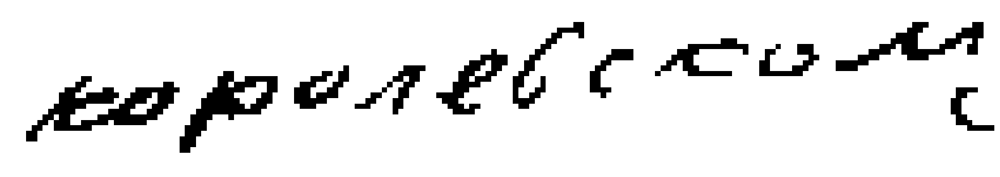

Фрагмент № 15


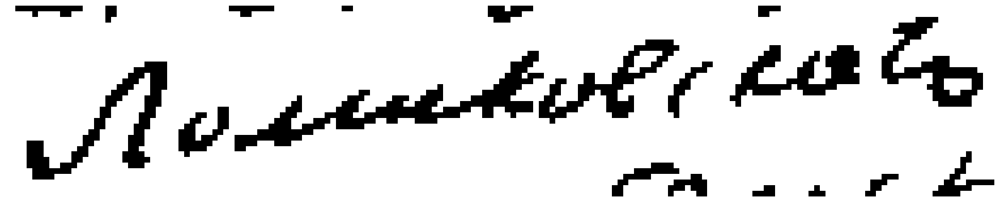

Фрагмент № 16


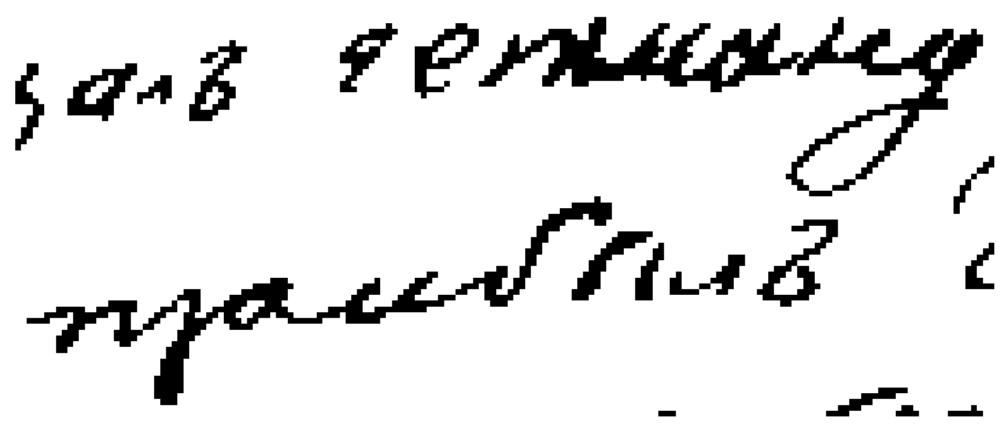

Фрагмент № 17


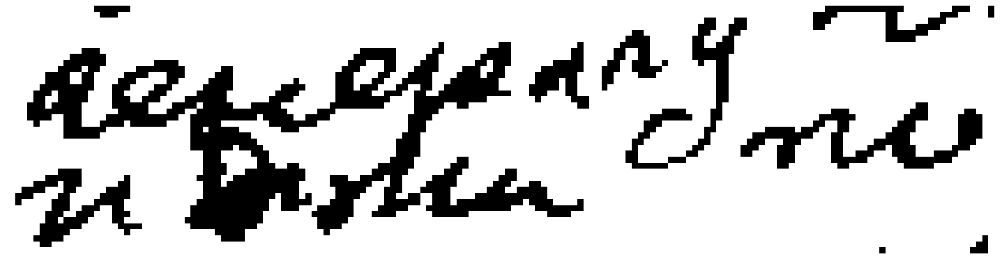

Фрагмент № 18


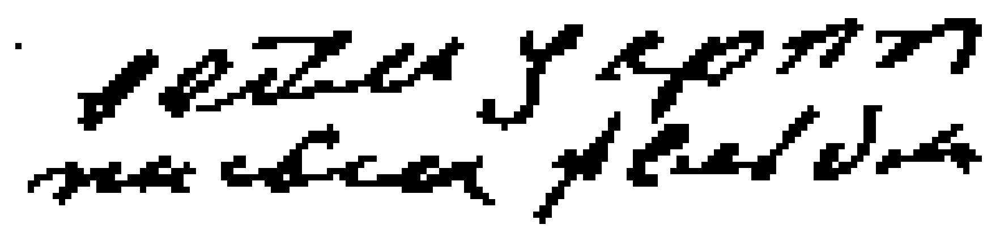

Фрагмент № 19


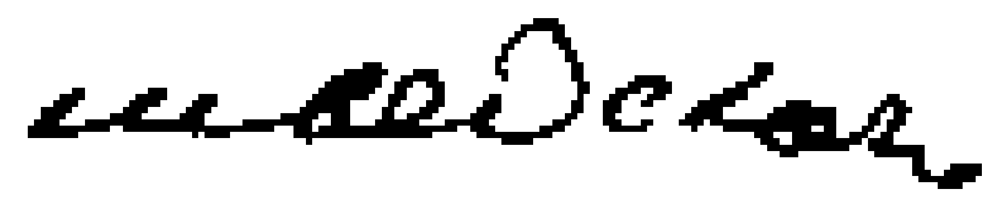

Фрагмент № 20


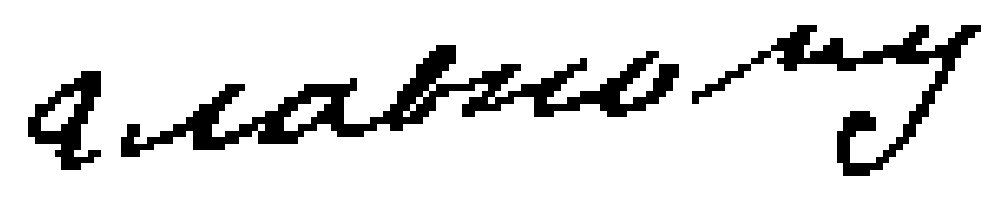

Фрагмент № 21


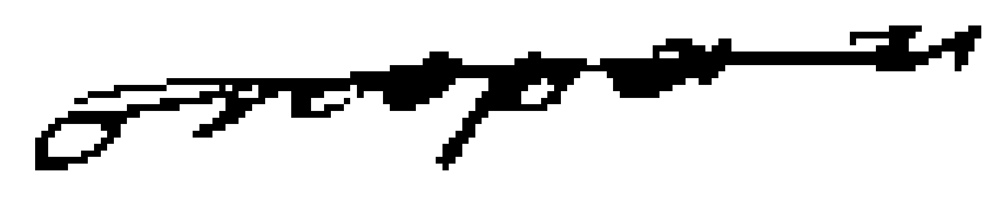

Фрагмент № 22


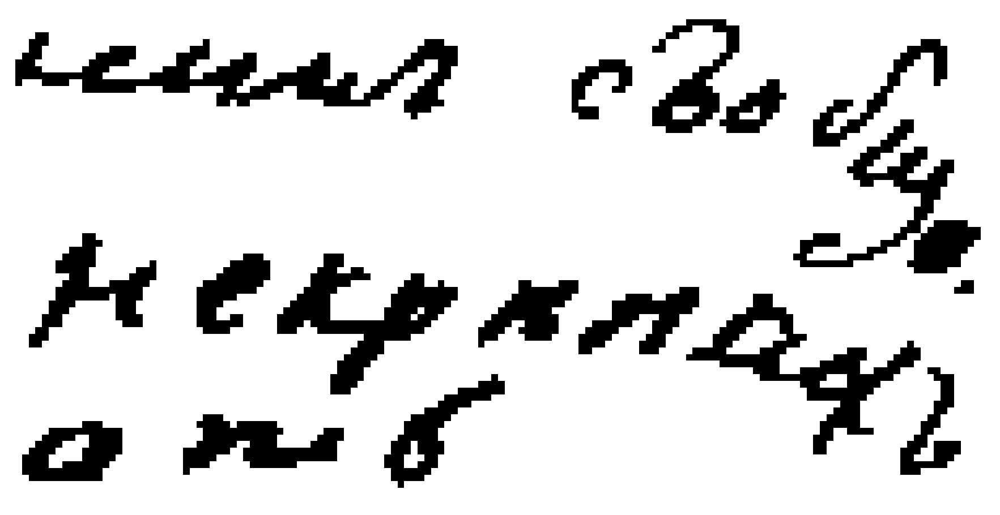

Фрагмент № 23


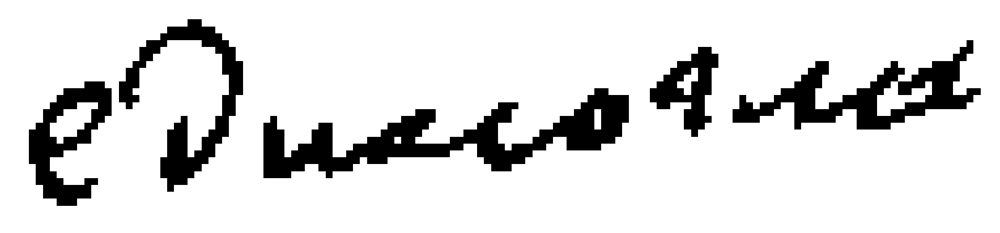

Фрагмент № 24


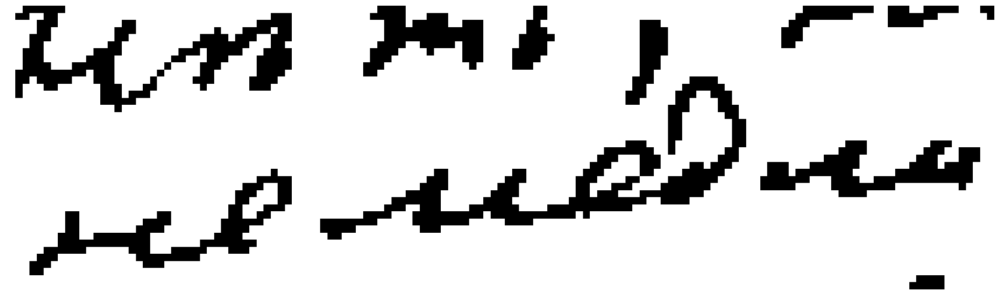

Фрагмент № 25


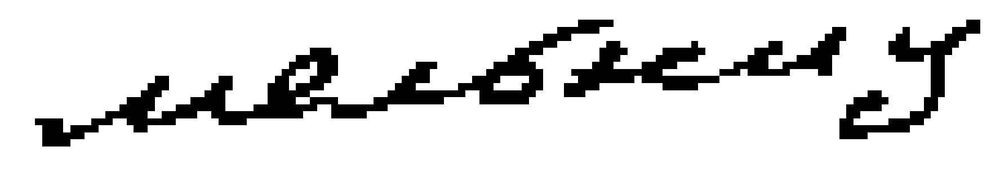

Фрагмент № 26


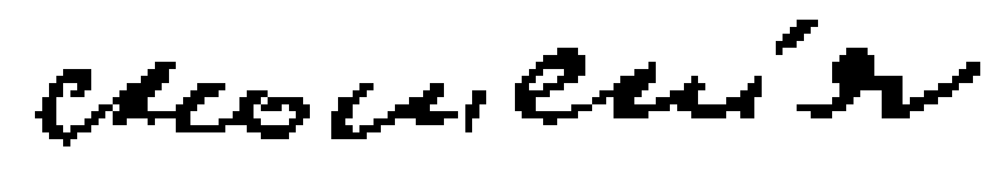

Фрагмент № 27


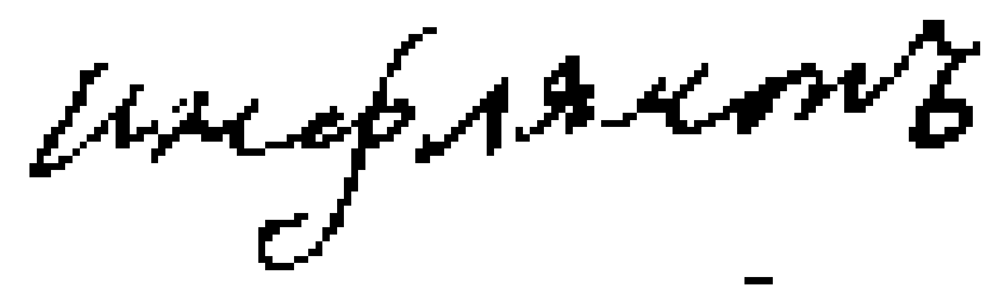

Фрагмент № 28


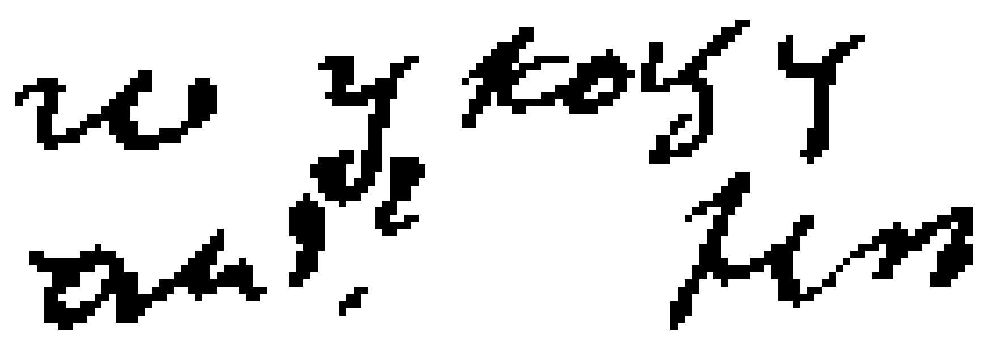

Фрагмент № 29


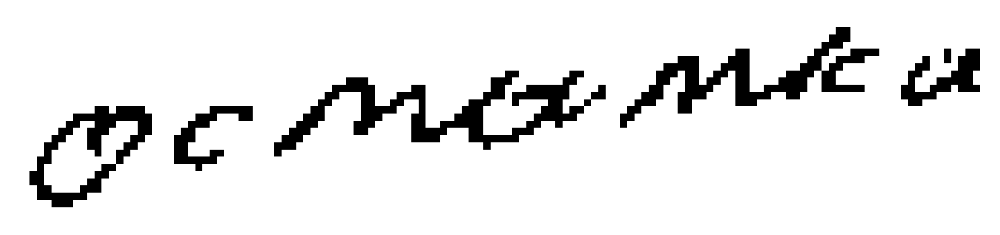

Фрагмент № 30


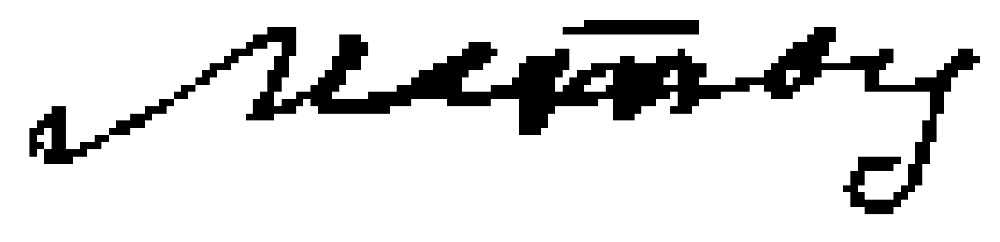

Фрагмент № 31


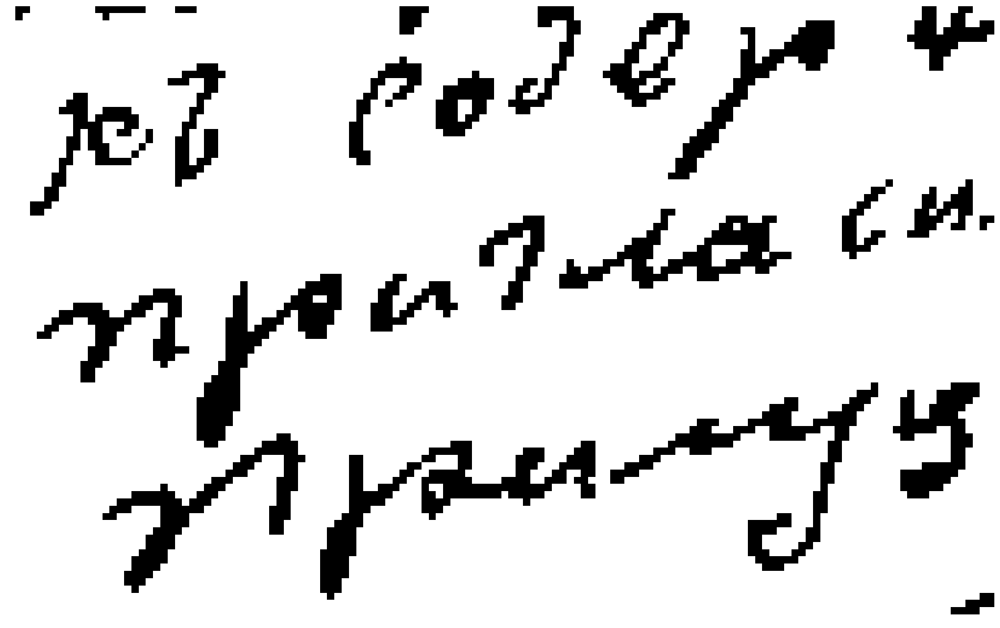

Фрагмент № 32


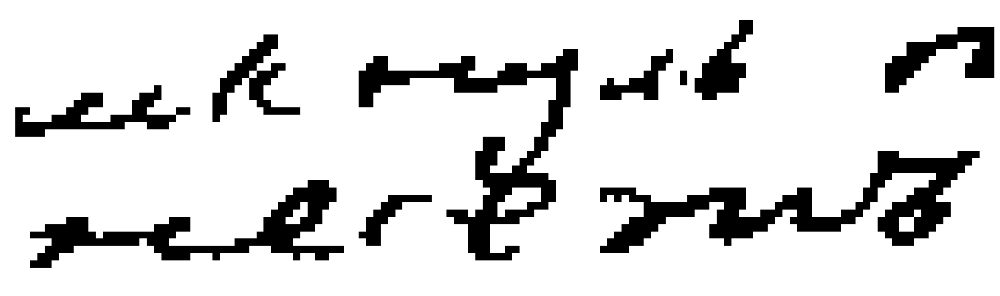

Фрагмент № 33


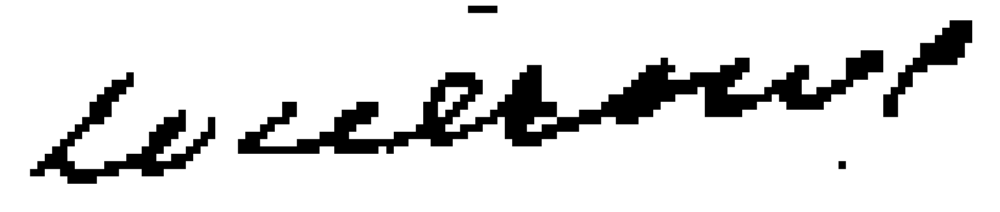

Фрагмент № 34


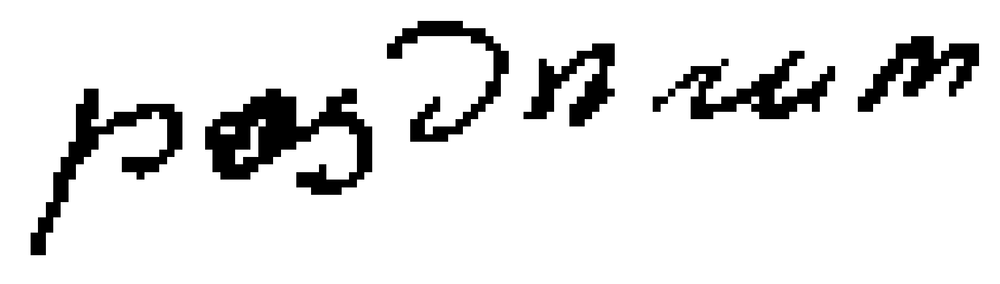

Фрагмент № 35


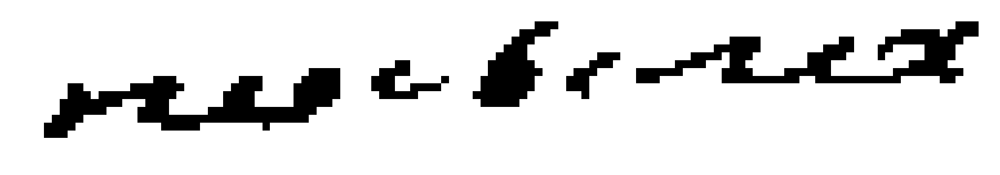

Фрагмент № 36


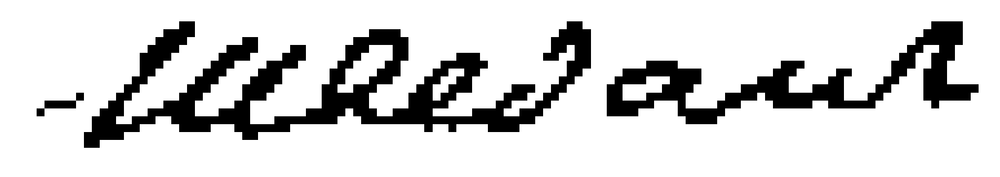

Фрагмент № 37


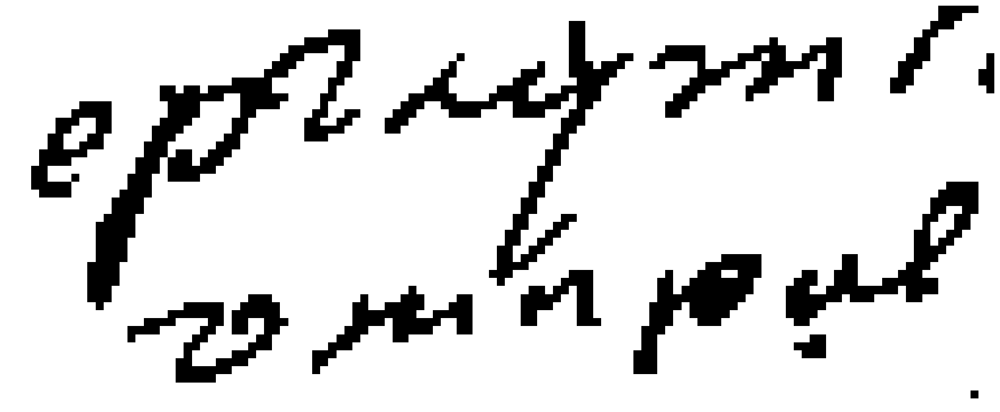

Фрагмент № 38


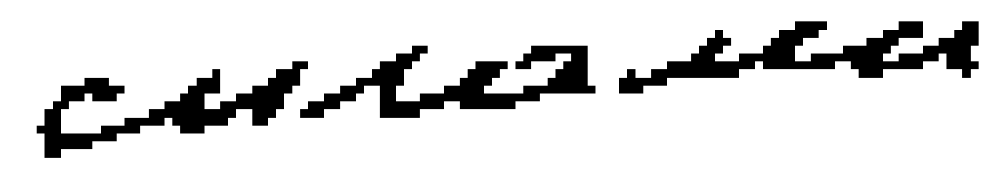

Фрагмент № 39


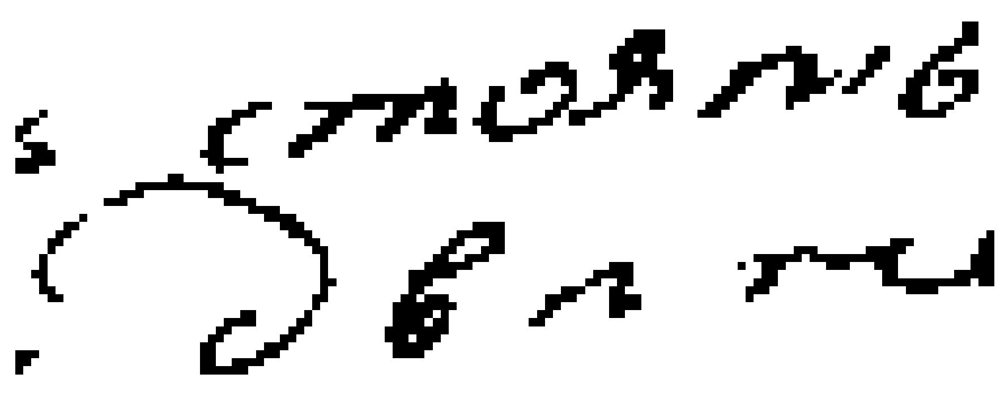

In [56]:
path_var = 'Literature Data/train_variant_7'
path_load = 'Literature Data/train_words_real'
img_p = '7_8.png'
img_path = path_var + '/' + img_p
img = cv2.imread(img_path)
train_words = new_words_extraction(img, 40)
for i, word in enumerate(train_words):
    path_i = path_load + '/' + '7_' + str(j) + '_' +'word_'  + str(i) + '.png'
    cv2.imwrite(path_i, word)

In [55]:
def sort_w(word):
    shape = word.shape
    return shape[1]

def new_words_extraction(image, count_of_words):
    h, w, _ = img.shape
    image = img[20:h-20, 20:w-20]
    words = []
    #grayscale
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    show(gray)
    #binary
    print('binary')
    ret,thresh = cv2.threshold(gray,127,255,cv2.THRESH_BINARY_INV)
    show(thresh)
    #dilation
    print('dilation')
    kernel = np.ones((5,5), np.uint8)
    img_dilation = cv2.dilate(thresh, kernel, iterations=1)
    show(img_dilation)
    #find contours
    ctrs, hier = cv2.findContours(img_dilation.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    #sort contours
    sorted_ctrs = sorted(ctrs, key=lambda ctr: cv2.boundingRect(ctr)[0])
    print(len(sorted_ctrs))
    for i, ctr in enumerate(sorted_ctrs):
        # Get bounding box
        x, y, w, h = cv2.boundingRect(ctr)
        if w >= 50 and h >= 10:
            roi = image.copy()[y:y+h, x:x+w]
            roi = otsu_binarization(roi)
            cv2.rectangle(image,(x,y),( x + w, y + h ),(90,0,255),2)
            words.append(roi)
    words.sort(key = sort_w, reverse = True)
    res_words = []
    show(img)
    for i, word in enumerate(words):
        if 5 < i < count_of_words:
            print('Фрагмент № ' + str(i))
            #show(word)
            res_words.append(word)
    
    return res_words

In [58]:
img = cv2.imread('Literature Data/test_words_real/7_0_word_0.png')
img.shape
                

(29, 298, 3)

In [59]:
img = cv2.imread('Literature Data/test_set/1_0_word_1.png')
img.shape

(77, 308, 3)